# &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; Home Loan Default-Risk Management

## 1. Problem Statement
**Business Objective:** The primary business objective of this project is to analyze and understand the key factors that are use to identify the potential defaulter based on the data given about the applicant. By applying Exploratory Data Analysis and Machine Learning techniques, the project aims to uncover, how different features of applicant and their financial background gives information about the defaulter applicant. This understanding enables lenders to make data-driven decisions related to **defaulter applicant**.

**Machine Leaning Type:** *Supervised Machine Learning: Classification Technique*

In [1]:
# Importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings 
warnings.filterwarnings("ignore")
#Phi_K: powerful library for correlation analysis
#Works with categorical, ordinal, and interval (continuous) variables.
#Captures non-linear dependencies.
import phik
from phik import report

# To see all columns/rows of DataFrame, if we refresh kernel, it will reset
pd.set_option('display.max_columns', None,'display.max_rows', None)

## 2. Loading Dataset

#### Reduce Memory Usage
I have seven CSV files containing a large amount of data. This will consume a lot of memory and may crash my system, especially during feature engineering and when combining the datasets into one. Therefore, I need to reduce the memory consumption.

In [2]:
# Writing function to reduce memory usage
def reduce_memory_usage(df):
  
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

### Data
There are 7 different sources of data:

* **application_train.csv:** The main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature **SK_ID_CURR**. The training application data comes with the `TARGET` indicating **0: the loan was repaid** or **1: the loan was not repaid**.
* **bureau.csv:** data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* **bureau_balance.csv:** monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* **previous_application.csv:** previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* **POS_CASH_balance.csv:** monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* **installments_payments.csv:** payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.
* **credit_card_balance.csv:** monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.


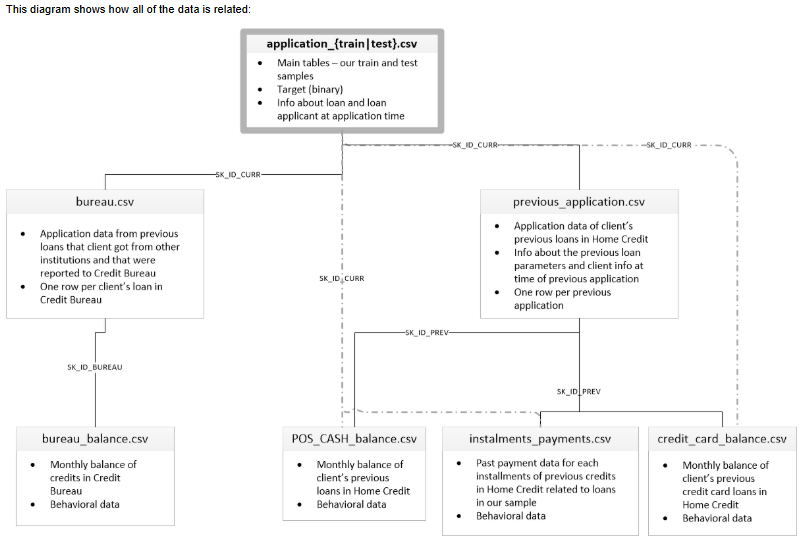

### Loading application_train.csv file

In [3]:
# Loading application_train.csv file
application_df = reduce_memory_usage(pd.read_csv(r'C:\Datamites_DataScience_Course\Datamites Internship\Home Loan Default - Risk Management\PRCP-1006-HomeLoanDef\All CSVs\application_train.csv'))
print('No. of rows',application_df.shape[0])
print('No. of columns',application_df.shape[1])
application_df.head()

Memory usage of dataframe is 286.23 MB
Memory usage after optimization is: 92.38 MB
Decreased by 67.7%
No. of rows 307511
No. of columns 122


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018799,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083008,0.262939,0.139404,0.024704,0.036896,0.972168,0.619141,0.014297,0.000000,0.068970,0.083313,0.125000,0.036896,0.020203,0.018997,0.000000,0.000000,0.025208,0.038300,0.972168,0.634277,0.014397,0.000000,0.068970,0.083313,0.125000,0.037689,0.022003,0.019806,0.0,0.0,0.024994,0.036896,0.972168,0.624512,0.014397,0.000000,0.068970,0.083313,0.125000,0.037506,0.020493,0.019302,0.000000,0.000000,reg oper account,block of flats,0.014900,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003542,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311279,0.622070,NaN,0.095886,0.052887,0.984863,0.795898,0.060486,0.080017,0.034485,0.291748,0.333252,0.013000,0.077271,0.054901,0.003901,0.009804,0.092407,0.053802,0.984863,0.804199,0.049713,0.080627,0.034485,0.291748,0.333252,0.012802,0.078979,0.055389,0.0,0.0,0.096802,0.052887,0.984863,0.798828,0.060791,0.080017,0.034485,0.291748,0.333252,0.013199,0.078674,0.055786,0.003901,0.010002,reg oper account,block of flats,0.071411,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010033,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,

In [4]:
# we can take sample of dataset if dtaset is huge
#sample_df = application_df.sample(n=50000, random_state=42)

### Loading bureau.csv file

In [4]:
bureau_df = reduce_memory_usage(pd.read_csv(r'C:\Datamites_DataScience_Course\Datamites Internship\Home Loan Default - Risk Management\PRCP-1006-HomeLoanDef\All CSVs\bureau.csv'))
print('No. of rows',bureau_df.shape[0])
print('No. of columns',bureau_df.shape[1])
bureau_df.head()

Memory usage of dataframe is 222.62 MB
Memory usage after optimization is: 112.95 MB
Decreased by 49.3%
No. of rows 1716428
No. of columns 17


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


### Loading bureau_balance.csv file

In [5]:
bureau_balance_df = reduce_memory_usage(pd.read_csv(r'C:\Datamites_DataScience_Course\Datamites Internship\Home Loan Default - Risk Management\PRCP-1006-HomeLoanDef\All CSVs\bureau_balance.csv'))
print('No. of rows',bureau_balance_df.shape[0])
print('No. of columns',bureau_balance_df.shape[1])
bureau_balance_df.head()

Memory usage of dataframe is 624.85 MB
Memory usage after optimization is: 338.46 MB
Decreased by 45.8%
No. of rows 27299925
No. of columns 3


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


### Loading previous_application.csv file

In [6]:
previous_application_df = reduce_memory_usage(pd.read_csv(r'C:\Datamites_DataScience_Course\Datamites Internship\Home Loan Default - Risk Management\PRCP-1006-HomeLoanDef\All CSVs\previous_application.csv'))
print('No. of rows',previous_application_df.shape[0])
print('No. of columns',previous_application_df.shape[1])
previous_application_df.head()

Memory usage of dataframe is 471.48 MB
Memory usage after optimization is: 309.01 MB
Decreased by 34.5%
No. of rows 1670214
No. of columns 37


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430054,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182861,0.867188,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615234,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735352,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335938,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.394531,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


### Loading POS_CASH_balance.csv file

In [7]:
posh_cash_balance_df = reduce_memory_usage(pd.read_csv(r'C:\Datamites_DataScience_Course\Datamites Internship\Home Loan Default - Risk Management\PRCP-1006-HomeLoanDef\All CSVs\POS_CASH_balance.csv'))
print('No. of rows',posh_cash_balance_df.shape[0])
print('No. of columns',posh_cash_balance_df.shape[1])
posh_cash_balance_df.head()

Memory usage of dataframe is 610.43 MB
Memory usage after optimization is: 238.45 MB
Decreased by 60.9%
No. of rows 10001358
No. of columns 8


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


### Loading installments_payments.csv file

In [8]:
installments_pay_df = reduce_memory_usage(pd.read_csv(r'C:\Datamites_DataScience_Course\Datamites Internship\Home Loan Default - Risk Management\PRCP-1006-HomeLoanDef\All CSVs\installments_payments.csv'))
print('No. of rows',installments_pay_df.shape[0])
print('No. of columns',installments_pay_df.shape[1])
installments_pay_df.head()

Memory usage of dataframe is 830.41 MB
Memory usage after optimization is: 311.40 MB
Decreased by 62.5%
No. of rows 13605401
No. of columns 8


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.359863,6948.359863
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525024,1716.525024
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000000,25425.000000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130859,24350.130859
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040039,2160.584961


### Loading credit_card_balance.csv file

In [9]:
credit_card_bal_df = reduce_memory_usage(pd.read_csv(r'C:\Datamites_DataScience_Course\Datamites Internship\Home Loan Default - Risk Management\PRCP-1006-HomeLoanDef\All CSVs\credit_card_balance.csv'))
print('No. of rows',credit_card_bal_df.shape[0])
print('No. of columns',credit_card_bal_df.shape[1])
credit_card_bal_df.head()

Memory usage of dataframe is 673.88 MB
Memory usage after optimization is: 289.33 MB
Decreased by 57.1%
No. of rows 3840312
No. of columns 23


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970001,135000,0.0,877.5,0.0,877.5,1700.324951,1800.0,1800.0,0.000000,0.000000,0.000000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.554688,45000,2250.0,2250.0,0.0,0.0,2250.000000,2250.0,2250.0,60175.078125,64875.554688,64875.554688,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.224609,450000,0.0,0.0,0.0,0.0,2250.000000,2250.0,2250.0,26926.425781,31460.085938,31460.085938,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.109375,225000,2250.0,2250.0,0.0,0.0,11795.759766,11925.0,11925.0,224949.281250,233048.968750,233048.968750,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.468750,450000,0.0,11547.0,0.0,11547.0,22924.890625,27000.0,27000.0,443044.406250,453919.468750,453919.468750,0.0,1,0.0,1.0,101.0,Active,0,0


## 3. Basic Checks 

### 3.a. Basic Checks of **application_train.csv** Dataset

In [69]:
# Chaking the shape of application_train dataset
application_df.shape

(307511, 122)

In [24]:
# Checking top 5 row of Dataset
application_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018799,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083008,0.262939,0.139404,0.024704,0.036896,0.972168,0.619141,0.014297,0.000000,0.068970,0.083313,0.125000,0.036896,0.020203,0.018997,0.000000,0.000000,0.025208,0.038300,0.972168,0.634277,0.014397,0.000000,0.068970,0.083313,0.125000,0.037689,0.022003,0.019806,0.0,0.0,0.024994,0.036896,0.972168,0.624512,0.014397,0.000000,0.068970,0.083313,0.125000,0.037506,0.020493,0.019302,0.000000,0.000000,reg oper account,block of flats,0.014900,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003542,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311279,0.622070,NaN,0.095886,0.052887,0.984863,0.795898,0.060486,0.080017,0.034485,0.291748,0.333252,0.013000,0.077271,0.054901,0.003901,0.009804,0.092407,0.053802,0.984863,0.804199,0.049713,0.080627,0.034485,0.291748,0.333252,0.012802,0.078979,0.055389,0.0,0.0,0.096802,0.052887,0.984863,0.798828,0.060791,0.080017,0.034485,0.291748,0.333252,0.013199,0.078674,0.055786,0.003901,0.010002,reg oper account,block of flats,0.071411,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010033,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,

In [12]:
#  Checking the information about dataset and its datatypes
application_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float16(61), float32(4), int16(2), int32(2), int8(37), object(16)
memory usage: 92.4+ MB


In [14]:
# Checking statistical analysis of Numerical Columns
application_df.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,307511.0,278180.518577,102790.175348,1.000020e+05,189145.500000,278202.000000,367142.500000,4.562550e+05
TARGET,307511.0,0.080729,0.272419,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+00
CNT_CHILDREN,307511.0,0.417052,0.722121,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01
AMT_INCOME_TOTAL,307511.0,168797.921875,237175.921875,2.565000e+04,112500.000000,147150.000000,202500.000000,1.170000e+08
AMT_CREDIT,307511.0,599025.937500,402479.531250,4.500000e+04,270000.000000,513531.000000,808650.000000,4.050000e+06
AMT_ANNUITY,307499.0,27108.572266,14493.233398,1.615500e+03,16524.000000,24903.000000,34596.000000,2.580255e+05
AMT_GOODS_PRICE,307233.0,538396.125000,369542.656250,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06
REGION_POPULATION_RELATIVE,307511.0,0.000000,0.013824,2.899170e-04,0.010010,0.018845,0.028656,7.250977e-02
DAYS_BIRTH,307511.0,-16036.995067,4363.988632,-2.522900e+04,-19682.000000,-15750.000000,-12413.000000,-7.489000e+03
DAYS_EMPLOYED,307511.0,63815.045904,141275.766519,-1.791200e+04,-2760.000000,-1213.000000,-289.000000,3.652430e+05


In [15]:
# Checking the statistical analysis of Categorical columns
application_df.describe(include='O').T

,count,unique,top,freq
NAME_CONTRACT_TYPE,307511,2,Cash loans,278232
CODE_GENDER,307511,3,F,202448
FLAG_OWN_CAR,307511,2,N,202924
FLAG_OWN_REALTY,307511,2,Y,213312
NAME_TYPE_SUITE,306219,7,Unaccompanied,248526
NAME_INCOME_TYPE,307511,8,Working,158774
NAME_EDUCATION_TYPE,307511,5,Secondary / secondary special,218391
NAME_FAMILY_STATUS,307511,6,Married,196432
NAME_HOUSING_TYPE,307511,6,House / apartment,272868
OCCUPATION_TYPE,211120,18,Laborers,55186


In [16]:
# Checking missing values
app_missing=application_df.isnull().sum()
app_missing=app_missing[app_missing>0].sort_values(ascending=False)
print(app_missing)

COMMONAREA_MEDI                 214865
COMMONAREA_AVG                  214865
COMMONAREA_MODE                 214865
NONLIVINGAPARTMENTS_MEDI        213514
NONLIVINGAPARTMENTS_MODE        213514
NONLIVINGAPARTMENTS_AVG         213514
FONDKAPREMONT_MODE              210295
LIVINGAPARTMENTS_MODE           210199
LIVINGAPARTMENTS_MEDI           210199
LIVINGAPARTMENTS_AVG            210199
FLOORSMIN_MODE                  208642
FLOORSMIN_MEDI                  208642
FLOORSMIN_AVG                   208642
YEARS_BUILD_MODE                204488
YEARS_BUILD_MEDI                204488
YEARS_BUILD_AVG                 204488
OWN_CAR_AGE                     202929
LANDAREA_AVG                    182590
LANDAREA_MEDI                   182590
LANDAREA_MODE                   182590
BASEMENTAREA_MEDI               179943
BASEMENTAREA_AVG                179943
BASEMENTAREA_MODE               179943
EXT_SOURCE_1                    173378
NONLIVINGAREA_MEDI              169682
NONLIVINGAREA_MODE       

#### **Key findings:** Basic checks of **application_train.csv** file
* **application_train.csv:**
  * No. of rows: `307511`
  * No. of Columns: `122`
* No. of Numerical Features: `106`
* No. of Categorical Features: `16`
* **Dependent Feature:** `TARGET` 
* #### Identification of Datatypes present in Dataset
* As we know, after using `df.info()` there are 2 types of Datatypes: **Numerical** (like:`float16(61)`,`float32(4)`,`int16(2)`,`int32(2)`,`int8(37)` and **Categorical** (like:`object(16)`)
* There are **missing values** in Dataset.

### 3.b. Basic Checks of **bureau.csv** Dataset

In [17]:
# checking the shape
bureau_df.shape

(1716428, 17)

In [18]:
# checking the top 5 rows of dataset
bureau_df.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [19]:
# Checking the information about dataset and its datatypes
bureau_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int32  
 1   SK_ID_BUREAU            int32  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int16  
 5   CREDIT_DAY_OVERDUE      int16  
 6   DAYS_CREDIT_ENDDATE     float16
 7   DAYS_ENDDATE_FACT       float16
 8   AMT_CREDIT_MAX_OVERDUE  float32
 9   CNT_CREDIT_PROLONG      int8   
 10  AMT_CREDIT_SUM          float32
 11  AMT_CREDIT_SUM_DEBT     float32
 12  AMT_CREDIT_SUM_LIMIT    float32
 13  AMT_CREDIT_SUM_OVERDUE  float32
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int32  
 16  AMT_ANNUITY             float32
dtypes: float16(2), float32(6), int16(2), int32(3), int8(1), object(3)
memory usage: 112.9+ MB


In [20]:
# Checking Statistics of Numerical columns
bureau_df.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,1716428.0,2.782149e+05,1.029386e+05,100001.000,188866.75,278055.0,367426.00,456255.0
SK_ID_BUREAU,1716428.0,5.924434e+06,5.322657e+05,5000000.000,5463953.75,5926303.5,6385681.25,6843457.0
DAYS_CREDIT,1716428.0,-1.142108e+03,7.951649e+02,-2922.000,-1666.00,-987.0,-474.00,0.0
CREDIT_DAY_OVERDUE,1716428.0,8.181666e-01,3.654443e+01,0.000,0.00,0.0,0.00,2792.0
DAYS_CREDIT_ENDDATE,1610875.0,NaN,NaN,-42048.000,-1138.00,-330.0,474.00,31200.0
DAYS_ENDDATE_FACT,1082775.0,NaN,NaN,-42016.000,-1489.00,-897.0,-425.00,0.0
AMT_CREDIT_MAX_OVERDUE,591940.0,3.825417e+03,2.059873e+05,0.000,0.00,0.0,0.00,115987184.0
CNT_CREDIT_PROLONG,1716428.0,6.410406e-03,9.622391e-02,0.000,0.00,0.0,0.00,9.0
AMT_CREDIT_SUM,1716415.0,3.549946e+05,1.150277e+06,0.000,51300.00,125518.5,315000.00,585000000.0
AMT_CREDIT_SUM_DEBT,1458759.0,1.370851e+05,6.790749e+05,-4705600.500,0.00,0.0,40153.50,170100000.0


In [21]:
# Statistics of Categorical Columns
bureau_df.describe(include='object').T

,count,unique,top,freq
CREDIT_ACTIVE,1716428,4,Closed,1079273
CREDIT_CURRENCY,1716428,4,currency 1,1715020
CREDIT_TYPE,1716428,15,Consumer credit,1251615


In [22]:
# Fetching no of Numerical and Categorical features in Bureau Dataset
# 1. Fetching numerical features
bureau_num_features=[feature for feature in bureau_df.columns if bureau_df[feature].dtypes!='O']

#2. Fetching numerical features
bureau_cat_features=[feature for feature in bureau_df.columns if bureau_df[feature].dtypes=='O']

print('No. of Numerical Fetures:',len(bureau_num_features))
print('No. of Categorical Fetures:',len(bureau_cat_features))

No. of Numerical Fetures: 14
No. of Categorical Fetures: 3


In [23]:
# Checking Missing values in bureau.csv file
bureau_missing=bureau_df.isnull().sum()
bureau_missing = bureau_missing[bureau_missing>0].sort_values(ascending=False)
print(bureau_missing)

AMT_ANNUITY               1226791
AMT_CREDIT_MAX_OVERDUE    1124488
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_DEBT        257669
DAYS_CREDIT_ENDDATE        105553
AMT_CREDIT_SUM                 13
dtype: int64


#### **Key findings:** Basic checks of **bureau.csv** file
* **bureau.csv:** 
  * No. of rows: `1716428`
  * No. of Columns: `17`
* No. of Numerical Features: `14`
* No. of Categorical Features: `3`
* **Dependent Feature:** There is no dependent feature. This Dataset is used to **support** `application_train.csv` file 
* #### Identification of Datatypes present in Dataset
* As we know, after using `df.info()` there are 2 types of Datatypes: **Numerical** (like:`float16(2)`,`float32(6)`,`int16(2)`,`int32(3)`,`int8(1)` and **Categorical** (like:`object(3)`)
* There are **missing values** in Dataset.

### 3.c. Basic checks of **bureau_balance.csv** file

In [24]:
# checking No of rows and columns
bureau_balance_df.shape

(27299925, 3)

In [25]:
# checking the top 5 rows of dataset
bureau_balance_df.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [26]:
# Checking the information about dataset and its datatypes
bureau_balance_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int32 
 1   MONTHS_BALANCE  int8  
 2   STATUS          object
dtypes: int32(1), int8(1), object(1)
memory usage: 338.5+ MB


In [27]:
bureau_balance_df.columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

In [28]:
bureau_balance_df.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_BUREAU,27299925.0,6.036297e+06,492348.856904,5001709.0,5730933.0,6070821.0,6431951.0,6842888.0
MONTHS_BALANCE,27299925.0,-3.074169e+01,23.864509,-96.0,-46.0,-25.0,-11.0,0.0


In [29]:
bureau_balance_df.describe(include='O').T

,count,unique,top,freq
STATUS,27299925,8,C,13646993


In [30]:
# Fetching no of Numerical and Categorical features in Bureau Dataset
# 1. Fetching numerical features
bureau_bal_num_features=[feature for feature in bureau_balance_df.columns if bureau_balance_df[feature].dtypes!='O']

#2. Fetching numerical features
bureau_bal_cat_features=[feature for feature in bureau_balance_df.columns if bureau_balance_df[feature].dtypes=='O']

print('No. of Numerical Fetures:',len(bureau_bal_num_features))
print('No. of Categorical Fetures:',len(bureau_bal_cat_features))

No. of Numerical Fetures: 2
No. of Categorical Fetures: 1


In [31]:
# Checking missing values
bureau_bal_missing=bureau_balance_df.isnull().sum()
bureau_bal_missing=bureau_bal_missing[bureau_bal_missing>0].sort_values(ascending=False)
print(bureau_bal_missing)

Series([], dtype: int64)


#### **Key findings:** Basic checks of **bureau_balance.csv** file
* **bureau_balance.csv:** 
  * No. of rows: `27299925`
  * No. of Columns: `3`
* No. of Numerical Features: `2`
* No. of Categorical Features: `1`
* **Dependent Feature:** There is no dependent feature. This Dataset is used to **support** `application_train.csv` file 
* #### Identification of Datatypes present in Dataset
* As we know, after using `df.info()` there are 2 types of Datatypes: **Numerical** (like:`int32(1)`,`int8(1)` and **Categorical** (like:`object(1)`)
* There is **no missing values** in Dataset.

### 3.d. Basic Checks of **previous_application.csv** file

In [72]:
# Checking shape 
previous_application_df.shape

(1670214, 37)

In [33]:
# checking the top 5 rows of dataset
previous_application_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430054,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182861,0.867188,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615234,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735352,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335938,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.394531,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
# Checking the information about dataset and its datatypes
previous_application_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int32  
 1   SK_ID_CURR                   1670214 non-null  int32  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float32
 4   AMT_APPLICATION              1670214 non-null  float32
 5   AMT_CREDIT                   1670213 non-null  float32
 6   AMT_DOWN_PAYMENT             774370 non-null   float32
 7   AMT_GOODS_PRICE              1284699 non-null  float32
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int8   
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int8   
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [35]:
# checking the statistics of Numerical Features
previous_application_df.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_PREV,1670214.0,1.923089e+06,532597.958696,1.000001e+06,1.461857e+06,1.923110e+06,2.384280e+06,2.845382e+06
SK_ID_CURR,1670214.0,2.783572e+05,102814.823849,1.000010e+05,1.893290e+05,2.787145e+05,3.675140e+05,4.562550e+05
AMT_ANNUITY,1297979.0,1.595512e+04,14776.954102,0.000000e+00,6.321780e+03,1.125000e+04,2.065842e+04,4.180582e+05
AMT_APPLICATION,1670214.0,1.752339e+05,293300.531250,0.000000e+00,1.872000e+04,7.104600e+04,1.803600e+05,6.905160e+06
AMT_CREDIT,1670213.0,1.961140e+05,317783.656250,0.000000e+00,2.416050e+04,8.054100e+04,2.164185e+05,6.905160e+06
AMT_DOWN_PAYMENT,774370.0,6.697401e+03,20905.724609,-9.000000e-01,0.000000e+00,1.638000e+03,7.740000e+03,3.060045e+06
AMT_GOODS_PRICE,1284699.0,2.278472e+05,315460.500000,0.000000e+00,5.084100e+04,1.123200e+05,2.340000e+05,6.905160e+06
HOUR_APPR_PROCESS_START,1670214.0,1.248418e+01,3.334028,0.000000e+00,1.000000e+01,1.200000e+01,1.500000e+01,2.300000e+01
NFLAG_LAST_APPL_IN_DAY,1670214.0,9.964675e-01,0.059330,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
RATE_DOWN_PAYMENT,774370.0,0.000000e+00,0.107788,-1.496077e-05,0.000000e+00,5.160522e-02,1.088867e-01,1.000000e+00


In [36]:
# checking the statistics of Categorical Features
previous_application_df.describe(include='O').T

,count,unique,top,freq
NAME_CONTRACT_TYPE,1670214,4,Cash loans,747553
WEEKDAY_APPR_PROCESS_START,1670214,7,TUESDAY,255118
FLAG_LAST_APPL_PER_CONTRACT,1670214,2,Y,1661739
NAME_CASH_LOAN_PURPOSE,1670214,25,XAP,922661
NAME_CONTRACT_STATUS,1670214,4,Approved,1036781
NAME_PAYMENT_TYPE,1670214,4,Cash through the bank,1033552
CODE_REJECT_REASON,1670214,9,XAP,1353093
NAME_TYPE_SUITE,849809,7,Unaccompanied,508970
NAME_CLIENT_TYPE,1670214,4,Repeater,1231261
NAME_GOODS_CATEGORY,1670214,28,XNA,950809


In [37]:
# Finding the Numerical and categorical Features
# 1. Numerical Features
pre_app_num_features=[feature for feature in previous_application_df.columns if previous_application_df[feature].dtypes!='O']

# 2. Categorical Features
pre_app_cat_features=[feature for feature in previous_application_df.columns if previous_application_df[feature].dtypes=='O']

print('No. of Numerical Fetures:',len(pre_app_num_features))
print('No. of Categorical Fetures:',len(pre_app_cat_features))

No. of Numerical Fetures: 21
No. of Categorical Fetures: 16


In [38]:
# checking missing values in dataset
prev_app_missing=previous_application_df.isnull().sum()
prev_app_missing = prev_app_missing[prev_app_missing>0].sort_values(ascending=False)
print(prev_app_missing)

RATE_INTEREST_PRIMARY        1664263
RATE_INTEREST_PRIVILEGED     1664263
AMT_DOWN_PAYMENT              895844
RATE_DOWN_PAYMENT             895844
NAME_TYPE_SUITE               820405
DAYS_FIRST_DRAWING            673065
DAYS_FIRST_DUE                673065
DAYS_LAST_DUE_1ST_VERSION     673065
DAYS_LAST_DUE                 673065
DAYS_TERMINATION              673065
NFLAG_INSURED_ON_APPROVAL     673065
AMT_GOODS_PRICE               385515
AMT_ANNUITY                   372235
CNT_PAYMENT                   372230
PRODUCT_COMBINATION              346
AMT_CREDIT                         1
dtype: int64


#### **Key findings:** Basic checks of **previous_application.csv** file
* **previous_application.csv:** 
  * No. of rows: `1670214`
  * No. of Columns: `37`
* No. of Numerical Features: `21`
* No. of Categorical Features: `16`
* **Dependent Feature:** There is no dependent feature. This Dataset is used to **support** `application_train.csv` file 
* #### Identification of Datatypes present in Dataset
* As we know, after using `df.info()` there are 2 types of Datatypes: **Numerical** (like:`float16(5)`,`float32(10)`,`int16(1)`,`int32(3)`,`int8(2)` and **Categorical** (like:`object(16)`)
* There are **missing values** in Dataset.

### 3.e. Basic Checks of **POSH_CASH_balance.csv** file

In [39]:
# Checking shape 
posh_cash_balance_df.shape

(10001358, 8)

In [40]:
posh_cash_balance_df.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [41]:
# Checking the information about dataset and its datatypes
posh_cash_balance_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int32  
 1   SK_ID_CURR             int32  
 2   MONTHS_BALANCE         int8   
 3   CNT_INSTALMENT         float16
 4   CNT_INSTALMENT_FUTURE  float16
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int16  
 7   SK_DPD_DEF             int16  
dtypes: float16(2), int16(2), int32(2), int8(1), object(1)
memory usage: 238.5+ MB


In [42]:
# checking the statistics of Numerical Features
posh_cash_balance_df.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_PREV,10001358.0,1.903217e+06,535846.530722,1000001.0,1434405.0,1896565.0,2368963.0,2843499.0
SK_ID_CURR,10001358.0,2.784039e+05,102763.745090,100001.0,189550.0,278654.0,367429.0,456255.0
MONTHS_BALANCE,10001358.0,-3.501259e+01,26.066570,-96.0,-54.0,-28.0,-13.0,-1.0
CNT_INSTALMENT,9975287.0,NaN,0.000000,1.0,10.0,12.0,24.0,92.0
CNT_INSTALMENT_FUTURE,9975271.0,NaN,0.000000,0.0,3.0,7.0,14.0,85.0
SK_DPD,10001358.0,1.160693e+01,132.714043,0.0,0.0,0.0,0.0,4231.0
SK_DPD_DEF,10001358.0,6.544684e-01,32.762491,0.0,0.0,0.0,0.0,3595.0


In [43]:
# checking the statistics of Categorical Features
posh_cash_balance_df.describe(include='O').T

,count,unique,top,freq
NAME_CONTRACT_STATUS,10001358,9,Active,9151119


In [44]:
# Finding the Numerical and categorical Features
# 1. Numerical Features
posh_cash_num_features=[feature for feature in posh_cash_balance_df.columns if posh_cash_balance_df[feature].dtypes!='O']

# 2. Categorical Features
posh_cash_cat_features=[feature for feature in posh_cash_balance_df.columns if posh_cash_balance_df[feature].dtypes=='O']

print('No. of Numerical Fetures:',len(posh_cash_num_features))
print('No. of Categorical Fetures:',len(posh_cash_cat_features))

No. of Numerical Fetures: 7
No. of Categorical Fetures: 1


In [45]:
# checking missing values in dataset
posh_cash_bal_missing=posh_cash_balance_df.isnull().sum()
posh_cash_bal_missing = posh_cash_bal_missing[posh_cash_bal_missing>0].sort_values(ascending=False)
print(posh_cash_bal_missing)

CNT_INSTALMENT_FUTURE    26087
CNT_INSTALMENT           26071
dtype: int64


#### **Key findings:** Basic checks of **POSH_CASH_balance.csv** file
* **POSH_CASH_balance.csv:** 
  * No. of rows: `10001358`
  * No. of Columns: `8`
* No. of Numerical Features: `7`
* No. of Categorical Features: `1`
* **Dependent Feature:** There is no dependent feature. This Dataset is used to **support** `application_train.csv` file 
* #### Identification of Datatypes present in Dataset
* As we know, after using `df.info()` there are 2 types of Datatypes: **Numerical** (like:`float16(2)`,`int16(2)`,`int32(2)`,`int8(2)` and **Categorical** (like:`object(1)`)
* There are **missing values** in Dataset.

### 3.f. Basic checks of **installment_payment.csv** file

In [46]:
# Checking shape
installments_pay_df.shape

(13605401, 8)

In [47]:
# checking top 5 rows of dataset
installments_pay_df.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.359863,6948.359863
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525024,1716.525024
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000000,25425.000000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130859,24350.130859
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040039,2160.584961


In [48]:
# # Checking the information about dataset and its datatypes
installments_pay_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int32  
 1   SK_ID_CURR              int32  
 2   NUM_INSTALMENT_VERSION  float16
 3   NUM_INSTALMENT_NUMBER   int16  
 4   DAYS_INSTALMENT         float16
 5   DAYS_ENTRY_PAYMENT      float16
 6   AMT_INSTALMENT          float32
 7   AMT_PAYMENT             float32
dtypes: float16(3), float32(2), int16(1), int32(2)
memory usage: 311.4 MB


In [49]:
# Checking the statistics of Numerical Columns
installments_pay_df.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_PREV,13605401.0,1.903365e+06,536202.905546,1000001.0,1.434191e+06,1.896520e+06,2.369094e+06,2843499.00
SK_ID_CURR,13605401.0,2.784449e+05,102718.310411,100001.0,1.896390e+05,2.786850e+05,3.675300e+05,456255.00
NUM_INSTALMENT_VERSION,13605401.0,NaN,0.000000,0.0,0.000000e+00,1.000000e+00,1.000000e+00,178.00
NUM_INSTALMENT_NUMBER,13605401.0,1.887090e+01,26.664067,1.0,4.000000e+00,8.000000e+00,1.900000e+01,277.00
DAYS_INSTALMENT,13605401.0,NaN,NaN,-2922.0,-1.654000e+03,-8.180000e+02,-3.610000e+02,-1.00
DAYS_ENTRY_PAYMENT,13602496.0,NaN,NaN,-4920.0,-1.662000e+03,-8.270000e+02,-3.700000e+02,-1.00
AMT_INSTALMENT,13605401.0,1.705092e+04,49642.953125,0.0,4.226085e+03,8.884080e+03,1.671021e+04,3771487.75
AMT_PAYMENT,13602496.0,1.723821e+04,53759.812500,0.0,3.398265e+03,8.125515e+03,1.610842e+04,3771487.75


In [50]:
# Finding the Numerical and categorical Features
# 1. Numerical Features
installment_pay_num_features=[feature for feature in installments_pay_df.columns if installments_pay_df[feature].dtypes!='O']

print('No. of Numerical Fetures:',len(installment_pay_num_features))

No. of Numerical Fetures: 8


In [51]:
# Checking missing values
ins_pay_missing=installments_pay_df.isnull().sum()
ins_pay_missing=ins_pay_missing[ins_pay_missing>0].sort_values(ascending=False)
print(ins_pay_missing)

DAYS_ENTRY_PAYMENT    2905
AMT_PAYMENT           2905
dtype: int64


#### **Key findings:** Basic checks of **installment_payments.csv** file
* **installment_payments.csv:** 
  * No. of rows: `13605401`
  * No. of Columns: `8`
* No. of Numerical Features: `8`
* No. of Categorical Features: There is `no` categorical feature.
* **Dependent Feature:** There is no dependent feature. This Dataset is used to **support** `application_train.csv` file 
* #### Identification of Datatypes present in Dataset
* As we know, after using `df.info()` there are 2 types of Datatypes: **Numerical** (like:`float16(3)`,`float32(2)`,`int16(1)`,`int32(2)`)
* There are **missing values** in Dataset.

### 3.g. Basic checks of **credit_card_balance.csv** file

In [52]:
# checking the shape
credit_card_bal_df.shape

(3840312, 23)

In [53]:
# checking top 5 rows of dataset
credit_card_bal_df.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970001,135000,0.0,877.5,0.0,877.5,1700.324951,1800.0,1800.0,0.000000,0.000000,0.000000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.554688,45000,2250.0,2250.0,0.0,0.0,2250.000000,2250.0,2250.0,60175.078125,64875.554688,64875.554688,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.224609,450000,0.0,0.0,0.0,0.0,2250.000000,2250.0,2250.0,26926.425781,31460.085938,31460.085938,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.109375,225000,2250.0,2250.0,0.0,0.0,11795.759766,11925.0,11925.0,224949.281250,233048.968750,233048.968750,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.468750,450000,0.0,11547.0,0.0,11547.0,22924.890625,27000.0,27000.0,443044.406250,453919.468750,453919.468750,0.0,1,0.0,1.0,101.0,Active,0,0


In [54]:
# checking the dataset and datatypes
credit_card_bal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int32  
 1   SK_ID_CURR                  int32  
 2   MONTHS_BALANCE              int8   
 3   AMT_BALANCE                 float32
 4   AMT_CREDIT_LIMIT_ACTUAL     int32  
 5   AMT_DRAWINGS_ATM_CURRENT    float32
 6   AMT_DRAWINGS_CURRENT        float32
 7   AMT_DRAWINGS_OTHER_CURRENT  float32
 8   AMT_DRAWINGS_POS_CURRENT    float32
 9   AMT_INST_MIN_REGULARITY     float32
 10  AMT_PAYMENT_CURRENT         float32
 11  AMT_PAYMENT_TOTAL_CURRENT   float32
 12  AMT_RECEIVABLE_PRINCIPAL    float32
 13  AMT_RECIVABLE               float32
 14  AMT_TOTAL_RECEIVABLE        float32
 15  CNT_DRAWINGS_ATM_CURRENT    float16
 16  CNT_DRAWINGS_CURRENT        int16  
 17  CNT_DRAWINGS_OTHER_CURRENT  float16
 18  CNT_DRAWINGS_POS_CURRENT    float16
 19  CNT_INSTALMENT_MATURE

In [55]:
# Checking the statistics of Numerical Columns
credit_card_bal_df.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_PREV,3840312.0,1.904504e+06,536469.470563,1.000018e+06,1.434385e+06,1.897122e+06,2.369328e+06,2843496.000
SK_ID_CURR,3840312.0,2.783242e+05,102704.475133,1.000060e+05,1.895170e+05,2.783960e+05,3.675800e+05,456250.000
MONTHS_BALANCE,3840312.0,-3.452192e+01,26.667751,-9.600000e+01,-5.500000e+01,-2.800000e+01,-1.100000e+01,-1.000
AMT_BALANCE,3840312.0,5.830016e+04,107464.140625,-4.202502e+05,0.000000e+00,0.000000e+00,8.904669e+04,1505902.125
AMT_CREDIT_LIMIT_ACTUAL,3840312.0,1.538080e+05,165145.699523,0.000000e+00,4.500000e+04,1.125000e+05,1.800000e+05,1350000.000
AMT_DRAWINGS_ATM_CURRENT,3090496.0,5.961323e+03,28033.972656,-6.827310e+03,0.000000e+00,0.000000e+00,0.000000e+00,2115000.000
AMT_DRAWINGS_CURRENT,3840312.0,7.433390e+03,33366.816406,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,2287098.250
AMT_DRAWINGS_OTHER_CURRENT,3090496.0,2.881696e+02,8197.021484,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1529847.000
AMT_DRAWINGS_POS_CURRENT,3090496.0,2.968804e+03,20663.214844,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2239274.250
AMT_INST_MIN_REGULARITY,3535076.0,3.540206e+03,5525.349609,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,202882.000


In [56]:
# Checking the statistics of categorical Columns
credit_card_bal_df.describe(include='O').T

,count,unique,top,freq
NAME_CONTRACT_STATUS,3840312,7,Active,3698436


In [57]:
# Finding the Numerical and categorical Features
# 1. Numerical Features
cred_card__bal_num_features=[feature for feature in credit_card_bal_df.columns if credit_card_bal_df[feature].dtypes!='O']

# 2. Categorical Features
cred_card__bal_cat_features=[feature for feature in credit_card_bal_df.columns if credit_card_bal_df[feature].dtypes=='O']

print('No. of Numerical Fetures:',len(cred_card__bal_num_features))
print('No. of Categorical Fetures:',len(cred_card__bal_cat_features))

No. of Numerical Fetures: 22
No. of Categorical Fetures: 1


In [58]:
# checking missing values
cred_card_bal_missing = credit_card_bal_df.isnull().sum()
cred_card_bal_missing = cred_card_bal_missing[cred_card_bal_missing>0].sort_values(ascending=False)
print(cred_card_bal_missing)

AMT_PAYMENT_CURRENT           767988
AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
CNT_INSTALMENT_MATURE_CUM     305236
dtype: int64


#### **Key findings:** Basic checks of **credit_card_balance.csv** file
* **credit_card_balance.csv:** 
  * No. of rows: `3840312`
  * No. of Columns: `23`
* No. of Numerical Features: `22`
* No. of Categorical Features: `1`
* **Dependent Feature:** There is no dependent feature. This Dataset is used to **support** `application_train.csv` file 
* #### Identification of Datatypes present in Dataset
* As we know, after using `df.info()` there are 2 types of Datatypes: **Numerical** (like:`float16(4)`,`float32(11)`,`int16(3)`,`int32(3)`,`int8(1)` and **Categorical** (like:`object(1)`)
* There are **missing values** in Dataset.

## 4. Exploratory Data Analysis (EDA)

### 4.A. EDA of **application_train.csv** Dataset

### Missing Values

In [10]:
# calculating % missing values in dataset features
# 1. Calculate missing % for ALL columns
missing_percentages = application_df.isnull().mean() * 100

# 2. Filter for columns with missing values and sort descending (highest missing first)
missing_sorted = missing_percentages[missing_percentages > 0].sort_values(ascending=False)

# 3. Print
for feature, pct in missing_sorted.items():
    print('{}: {}% missing values'.format(feature, np.round(pct, 4)))

COMMONAREA_MEDI: 69.8723% missing values
COMMONAREA_AVG: 69.8723% missing values
COMMONAREA_MODE: 69.8723% missing values
NONLIVINGAPARTMENTS_MEDI: 69.433% missing values
NONLIVINGAPARTMENTS_MODE: 69.433% missing values
NONLIVINGAPARTMENTS_AVG: 69.433% missing values
FONDKAPREMONT_MODE: 68.3862% missing values
LIVINGAPARTMENTS_MODE: 68.355% missing values
LIVINGAPARTMENTS_MEDI: 68.355% missing values
LIVINGAPARTMENTS_AVG: 68.355% missing values
FLOORSMIN_MODE: 67.8486% missing values
FLOORSMIN_MEDI: 67.8486% missing values
FLOORSMIN_AVG: 67.8486% missing values
YEARS_BUILD_MODE: 66.4978% missing values
YEARS_BUILD_MEDI: 66.4978% missing values
YEARS_BUILD_AVG: 66.4978% missing values
OWN_CAR_AGE: 65.9908% missing values
LANDAREA_AVG: 59.3767% missing values
LANDAREA_MEDI: 59.3767% missing values
LANDAREA_MODE: 59.3767% missing values
BASEMENTAREA_MEDI: 58.516% missing values
BASEMENTAREA_AVG: 58.516% missing values
BASEMENTAREA_MODE: 58.516% missing values
EXT_SOURCE_1: 56.3811% missin

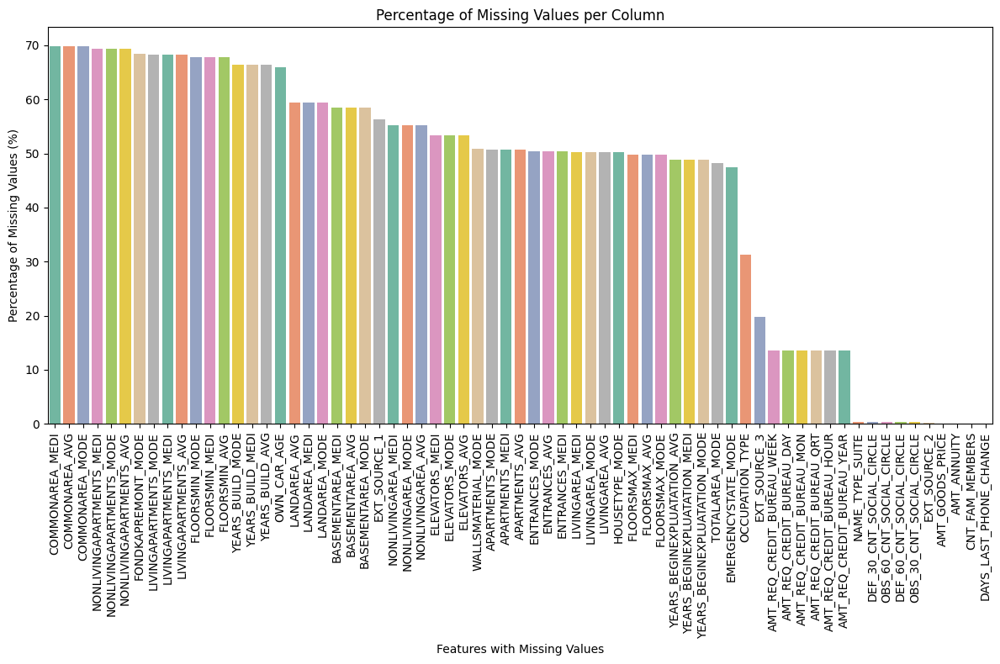

In [11]:
# Representing the plot of %missing values of each features with missing values
plt.figure(figsize=(12,8))
sns.barplot(x=missing_sorted.index,y=missing_sorted.values,palette='Set2')
plt.xlabel('Features with Missing Values')
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Percentage of Missing Values per Column')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [11]:
# Numerical Features with Nulls
num_features_with_na=[feature for feature in application_df.columns if application_df[feature].isnull().sum()>0 and application_df[feature].dtype!='O']
print('Number Features with Missing Values:\n',num_features_with_na,'\n')
print('No. of Number Features with Missing Values:',len(num_features_with_na))

Number Features with Missing Values:
 ['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'OWN_CAR_AGE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI',

In [18]:
# Categorical Features with Nulls
cat_features_with_na=[feature for feature in application_df.columns if application_df[feature].isnull().sum()>0 and application_df[feature].dtype=='O']
print('Number Features with Missing Values:',cat_features_with_na,'\n')
print('No. of Number Features with Missing Values:',len(cat_features_with_na))

Number Features with Missing Values: ['NAME_TYPE_SUITE', 'OCCUPATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'] 

No. of Number Features with Missing Values: 6


* As we know that, we have numerical and categorical features both, Now we have to analyse those features.

### Numerical Features analysis

In [25]:
# 1. fethcing Numerical Features
num_features=[feature for feature in application_df.columns if application_df[feature].dtype!='O']

In [16]:
print('Numerical Features of Applciation train Dataset:\n',num_features)

Numerical Features of Applciation train Dataset:
 ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMEN

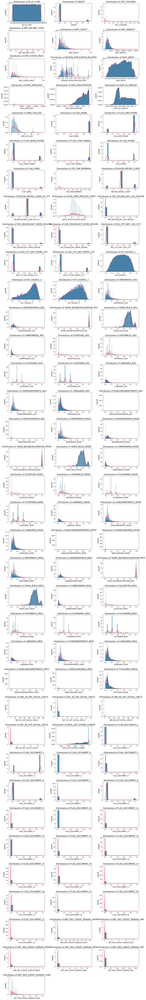

In [17]:
# Histogram of Numerical Columns
plt.figure(figsize=(15,106)) # To fix the canvas size
plotnumber=1 # initializing plot number
for feature in num_features:
    plt.subplot(36,3,plotnumber) #27*4=108, means we are trying to print 108 subplots 
    #sns.histplot(application_df[feature],kde=True)
    ax = sns.histplot(application_df[feature], kde=False, stat='density')
    sns.kdeplot(application_df[feature], color='crimson', ax=ax)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=12)
    plt.ylabel('count',fontsize=15)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### Analysis of Target 'TARGET' variable

In [43]:
application_df['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

In [45]:
# Finding the percentage of unique values in Target feature
application_df['TARGET'].value_counts(normalize=True)*100

TARGET
0    91.927118
1     8.072882
Name: proportion, dtype: float64

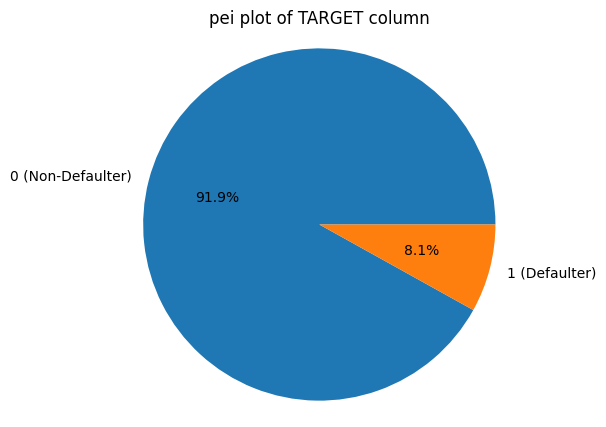

In [60]:
# Ploting in Pei plot
counts = application_df['TARGET'].value_counts()
plt.figure(figsize=(5, 5))

# Plot the Pie Chart
plt.pie(
    counts, 
    labels=['0 (Non-Defaulter)', '1 (Defaulter)'],  # Custom labels
    autopct='%1.1f%%',       # format to show percentage (e.g., 91.9%)
    #startangle=90,           # rotates the start to look cleaner
    #explode=(0, 0.1)         # optional: pulls the '1' slice out slightly
)

plt.title('pei plot of TARGET column')
plt.axis('equal')  # Ensures the pie chart is drawn as a circle
plt.show()

* As we can see in the plot, our dataset is highly imbalanced . <br>
**0:** Home Loan Non- Defaulters<br>
**1:** Home Loan Defaulter

### Analysis of Temporal Variables

In [27]:
# Fetching Temporal Variables
temporal_features=[feature for feature in application_df[num_features] if 'YEARS' in feature or 'DAYS' in feature]
print('Temporal Features:',temporal_features,'\n')
print('No. of Temporal Features',len(temporal_features))

Temporal Features: ['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BUILD_MEDI', 'DAYS_LAST_PHONE_CHANGE'] 

No. of Temporal Features 11


<Figure size 1000x2000 with 0 Axes>

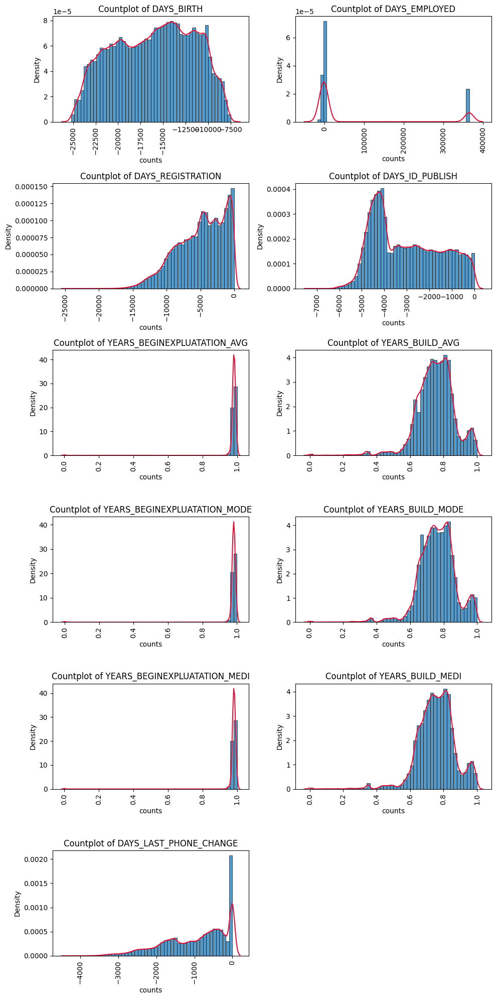

In [28]:
# Drawing the plot for temporal features 
plt.figure(figsize=(10,20))
plt_no=1
for feature in temporal_features:
    data=application_df.copy()
    plt.subplot(6,2,plt_no)
     # Convert float16 to float32 or float64 before plotting
    if data[feature].dtype == np.float16:
        # Convert to float32 which is supported by seaborn
        data[feature] = data[feature].astype(np.float32)
        
    ax = sns.histplot(data[feature], kde=False, stat='density', bins=50)
    sns.kdeplot(data[feature], color='crimson', ax=ax)
    plt.xlabel(feature)
    plt.xlabel('counts')
    plt.xticks(rotation=90)
    plt.title(f'Countplot of {feature}')
    plt_no+=1
plt.tight_layout()
plt.show()

* As we can see in the above Temporal feature, there are some **Anomalies** features(`DAYS_BIRTH`,`DAYS_EMPLOYED`,`DAYS_REGISTRATION`), which contains negative values.
* **DAYS_BIRTH**
  *  The numbers in the DAYS_BIRTH column are negative because they are recorded relative to the current loan application. To see these stats in years, we can mutliple by -1 and divide by the number of days in a year.

In [15]:
# DAYS_BIRTH Analysis
(application_df['DAYS_BIRTH']/-365).describe().T # converted days in to Years

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

Those ages look reasonable. There are no outliers for the age on either the high or low end.

In [26]:
# DAYS_EMPLOYED Analysis
(application_df['DAYS_EMPLOYED']/365).describe().T # converted days in to Years

count    307511.000000
mean        174.835742
std         387.056895
min         -49.073973
25%          -7.561644
50%          -3.323288
75%          -0.791781
max        1000.665753
Name: DAYS_EMPLOYED, dtype: float64

For **DAYS_EMPLOYED** feature, it maximun value is ~1000 years and mean is ~174 years, which don't looks right.

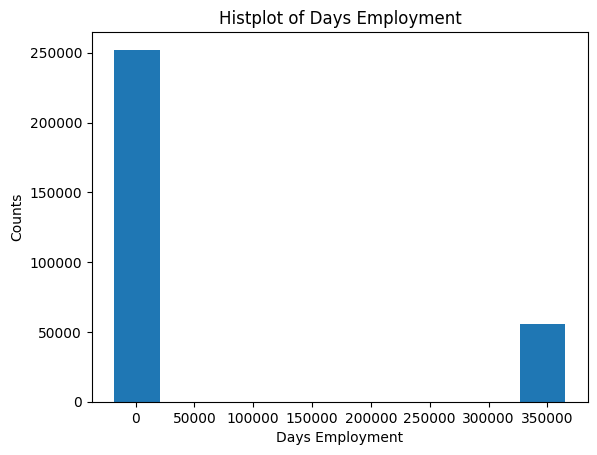

In [22]:
application_df['DAYS_EMPLOYED'].plot.hist(title = 'Histplot of Days Employment')
plt.xlabel('Days Employment')
plt.ylabel('Counts')
plt.show()

let's subset the anomalous clients and see if they tend to have higher or low rates of default than the rest of the clients.

In [22]:
data=application_df.copy()
anom = data[data['DAYS_EMPLOYED'] == 365243]
non_anom = data[data['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


The anomalies have a lower rate of default.

In [25]:
# DAYS_REGISTRATION Analysis
(application_df['DAYS_REGISTRATION']/-365).describe().T

count    307511.000000
mean         13.660596
std           9.651392
min          -0.000000
25%           5.506849
50%          12.339726
75%          20.493151
max          67.594521
Name: DAYS_REGISTRATION, dtype: float64

### Correlation of Numerical Features with TARGET

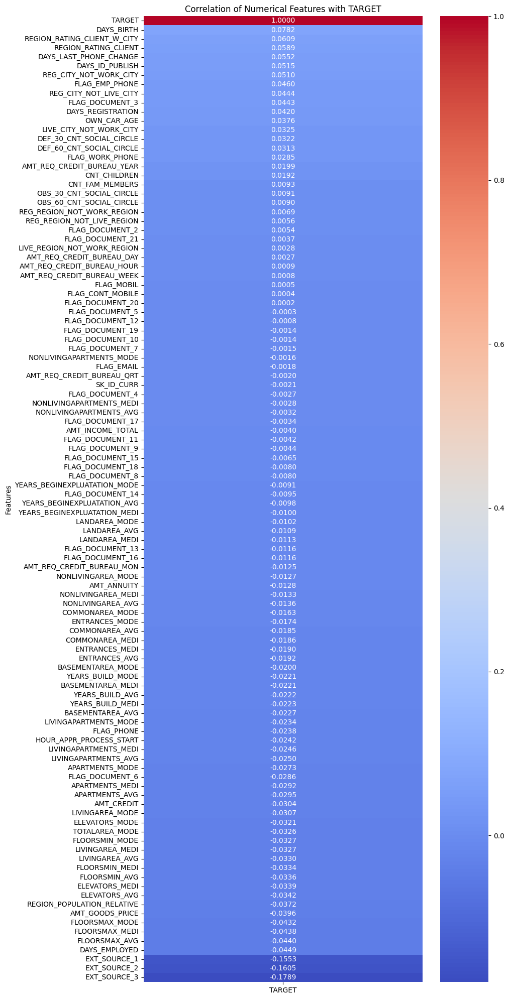

In [26]:
# 1.Finding the Correlation of Numerical Features
correlation_matrix=application_df[num_features].corr()
# 2.Finding the Correlation of SalePrice with Numerical Features
target_correlations=correlation_matrix['TARGET'].sort_values(ascending=False)
# 3. Drawing Heatmap for showing correlation of SalePrice with Numerical Features
plt.figure(figsize=(10,20))
sns.heatmap(target_correlations.to_frame(), annot=True, cmap='coolwarm', fmt=".4f")
#sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation of Numerical Features with TARGET')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

The `DAYS_BIRTH` is the most positive correlation. (except for TARGET because the correlation of a variable with itself is always 1). 

### Outlier Detection of Numerical Features

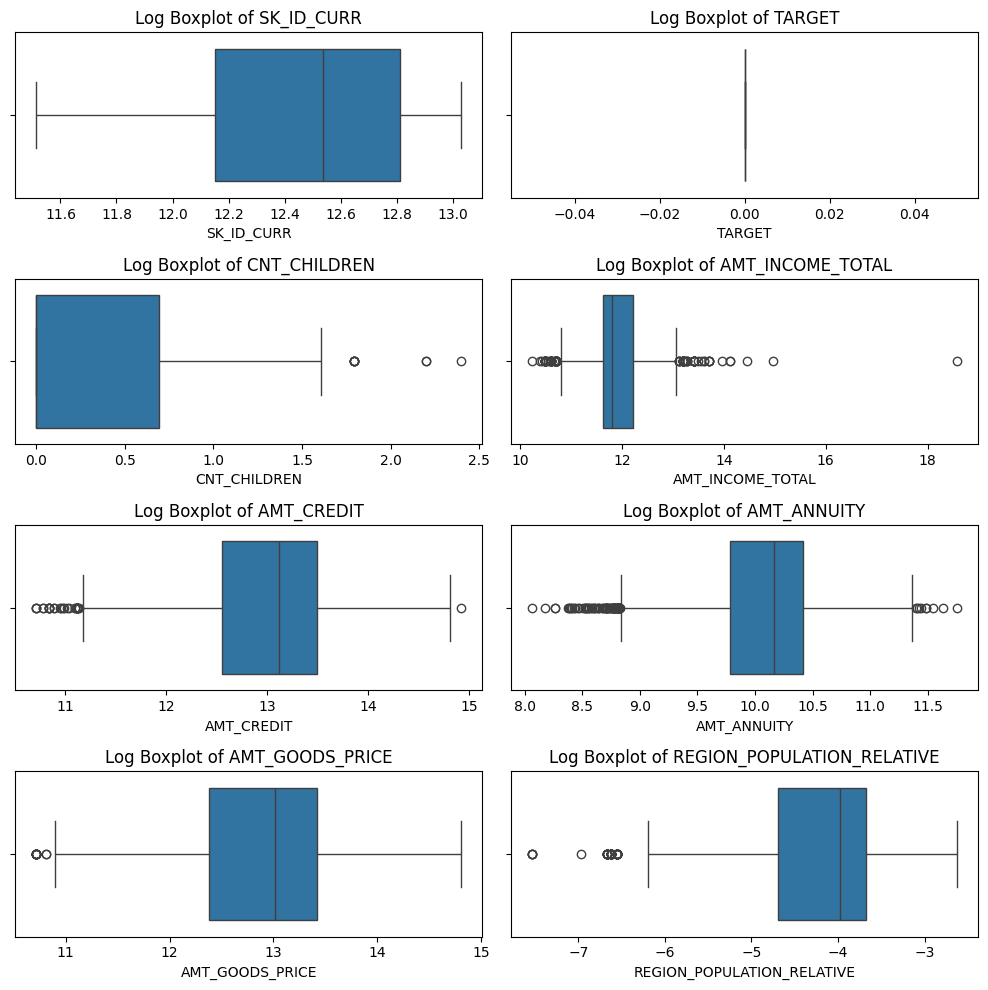

In [27]:
# Checking Outliers for Numerical features which donot conatains 0 or negative values
data=application_df.copy()
plt.figure(figsize=(10,10))
plotnumber=1
for feature in num_features:
    data = data[data[feature] > 0]
    # 3. Only plot if we actually have data left after filtering
    if not data.empty:
        plt.subplot(4, 2, plotnumber) # Adjusted grid size for example
        # Apply log
        data[feature] = np.log(data[feature])
        sns.boxplot(x=data[feature])
        plt.xlabel(feature)
        plt.title(f'Log Boxplot of {feature}')
        plotnumber += 1
plt.tight_layout()
plt.show()

### Analysis of Categorical Features

In [19]:
# Fetching Categorical Features
cat_features=[feature for feature in application_df.columns if application_df[feature].dtype=='O']
print('Categorical Features:',cat_features,'\n')
print('No. of Categorical Features:',len(cat_features))

Categorical Features: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'] 

No. of Categorical Features: 16


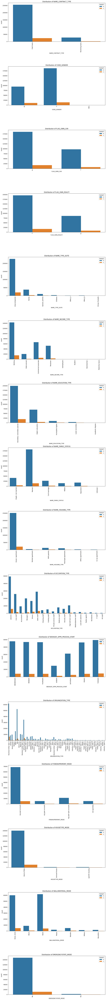

In [20]:
# ploting the categorical features
plt.figure(figsize=(12,112)) # To fix the canvas size
plotnumber=1 # initializing plot number
for feature in cat_features:
    plt.subplot(16,1,plotnumber) #16*1=16, means we are trying to print 40 subplots 
    sns.countplot(x=application_df[feature],hue=application_df['TARGET'])
    plt.title(f'Distribution of {feature}',fontsize=12)
    plt.xlabel(feature,fontsize=10)
    plt.xticks(rotation=90)
    plt.ylabel('count',fontsize=10)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### Finding the relationship between categorical variables and Dependent feature(TARGET)

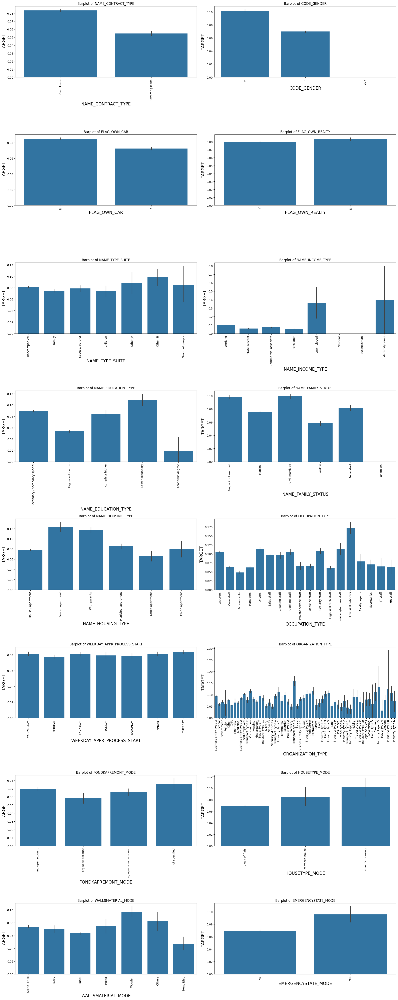

In [24]:
# # Finding the relationship between categorical variables and Dependent feature(TARGET)
plt.figure(figsize=(20,50))
plotnumber=1
for feature in cat_features:
    data=application_df.copy()
    plt.subplot(8,2,plotnumber)
    sns.barplot(x=data[feature],y=data['TARGET'])
    plt.title(f'Barplot of {feature}')
    plt.xlabel(feature,fontsize=15)
    plt.xticks(rotation=90)
    plt.ylabel('TARGET',fontsize=15)
    plotnumber+=1
plt.tight_layout()
plt.show()

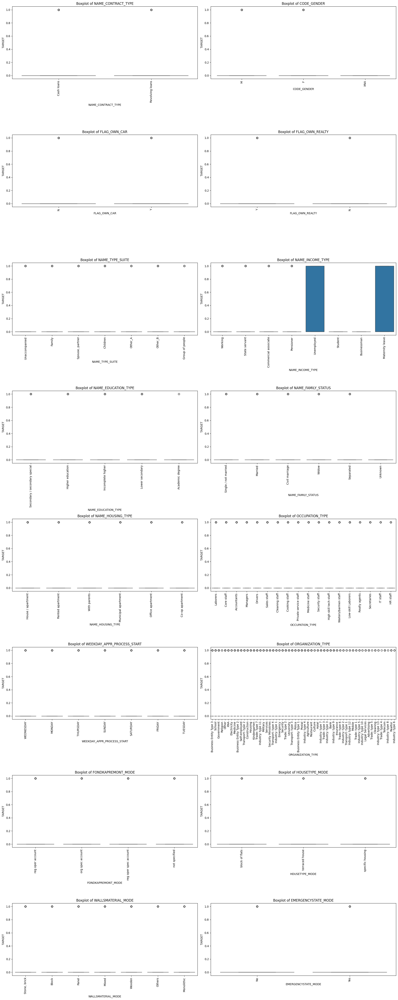

In [23]:
# Outliers detection of Categorical Features with SalePrice
plt.figure(figsize=(20,50))
plotnumber=1
for feature in cat_features:
    data=application_df.copy()
    plt.subplot(8,2,plotnumber)
    sns.boxplot(x=data[feature], y=data['TARGET'])
    plt.title(f'Boxplot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('TARGET')
    plt.xticks(rotation=90)
    plotnumber+=1
plt.tight_layout()
plt.show()

### Correlation of Categorical features using Phi_K matrix

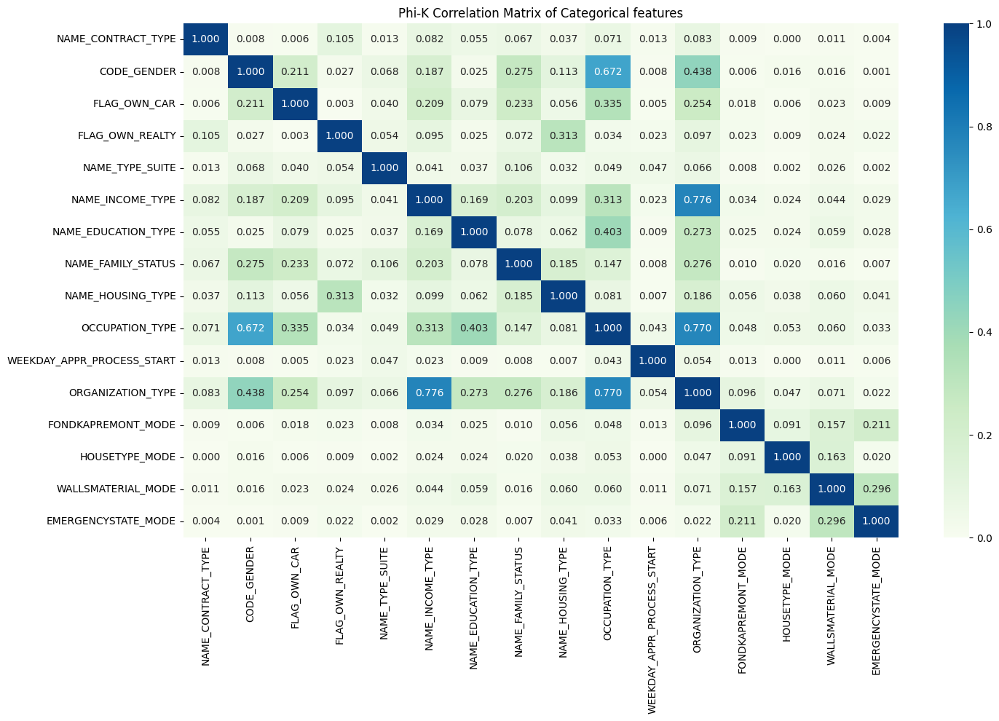

In [36]:
application_phi_k_corr = application_df[cat_features].phik_matrix()
plt.figure(figsize=(15,10))
sns.heatmap(application_phi_k_corr, annot=True, cmap="GnBu", vmin=0, vmax=1,fmt=".3f")
plt.title("Phi-K Correlation Matrix of Categorical features")
plt.tight_layout()
plt.show()

### Domain Analysis: Important features of **application_train.csv**:
* **SK_ID_CURR:** This is `Id` column of Dataset.
* **TARGET:** This is target column of dataset, which contains `Binary Categories(Defaulter:1 & Non-defaulter:0)`, where number of `Defaulters` are `very less` than `Non-Defaulters`, so that it is **highly imbalance** dataset.
* **EXT_SOURCE_1:** From the above plot and missing values checks, we can observe that  `Ext_Source_1` is a Normalised Score from an External Data Source -1, and when we check for the number of nulls for this field (not shown here), we see that nearly 56% of the entries in the ‘Ext_Source_1’ column are null (empty) values, and hence we will take a look at the remaining values only.
* **EXT_SOURCE_2:** From the above plot and missing values checks, we can observe that `Ext_Source_2` is the Normalised Score from an External Data Source-2, and once we check for the nulls in this column, we will see that approximately `0.2%` of the entries in this column correspond to nulls. 
* **EXT_SOURCE_3:** From the above plot and missing values checks, we can observe that `Ext_Source_3` is the Normalised Score from an External Data Source-3, and once we check for nulls in this column, we find that approximately `20%` of the entries in this column correspond to nulls, and we carry out our analysis on the remaining entries. 
* **NAME_CONTRACT_TYPE:** From the above plot, we can observe that most of the applicants are taking cash loans instead of revolving loans such as Credit Cards.
* **CODE_GENDER:** From the above plot, we can observe that `Female` applicants are taking more loan as compared to the `Male` applicants.
* **FLAG_OWN_CAR:**  From the above plot, we can observe that the applicants who `do not have Car`, they are taking more loan as compare to the applicants have car.
* **FLAG_OWN_REALTY:** From the above plot, we can observe that, most applicants who are applying for load owns flat/house.
* **NAME_TYPE_SUITE:** From the above plot, we can observe that, For the various types of people accompanying the client for loan.
* **NAME_INCOME_TYPE:** From the above plot, we can observe that, The people who are `working` take the most number of loans whereas `Commercial Associates`, `Pensioners` and `State Servants` take considerably lesser number of loans. We have very little datapoints related to `Unemployed people`, `Students`, `Businessmen` and `women` on Maternity leave. One interesting observation over here is the fact that whatever loans the students and businessmen have applied to, they have been deemed capable of repayment of the same.
* **NAME_EDUCATION_TYPE:** From the above plot, we can observe that, the applicant who have `secondary/secondary special` take the most number of loans, then `Higher Education` applicant where as `incomplete higher`,`lower secondary` application taking less loans.
* **NAME_FAMILY_STATUS:** From the above plot, we can observe that, the applicant who are `Married` taking more loans where are `single/not married`,`civil marriage`,`widows`,`seperated` takes lesser number of loans.
* **NAME_HOUSING_TYPE:** From the above plot, we can observe that, the applicant who has `appartment/House` taking more loan, where as `Rented Appartment`,`With Parent`,`Municipal Apartment`,`Office Appartment`,`Co-op Apartment` taking less loans.
* **OCCUPATION_TYPE:** From the plot above, we can observe that most applicants are `Laborers`, who are taking out the most loans.
* **ORGANIZATION_TYPE:** From the plot above, we can observe that most applicants those are belong to `Business Entity Type 3`,`XNA`,`self-employed` organizations taking more loans.
* * **CNT_CHILDREN:** From the above plot, we can observe that the applicants having `no children` take considerably higher number of loans.
* **DAYS_BIRTH:** From the above plot, we can observe that most number of people applying for loans are in the range of (35–40) years whereas this is followed by people in the range of (40–45) years whereas the number of applicants in people aged <25 or aged>65 is very low. 

### 4.B. EDA of **bureau.csv** Dataset

In [81]:
bureau_df.columns

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')

* In **bureau.csv** dataset there is no **TARGET**(output) feature

In [82]:
bureau_df.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [83]:
bureau_df.shape

(1716428, 17)

### Missing Values

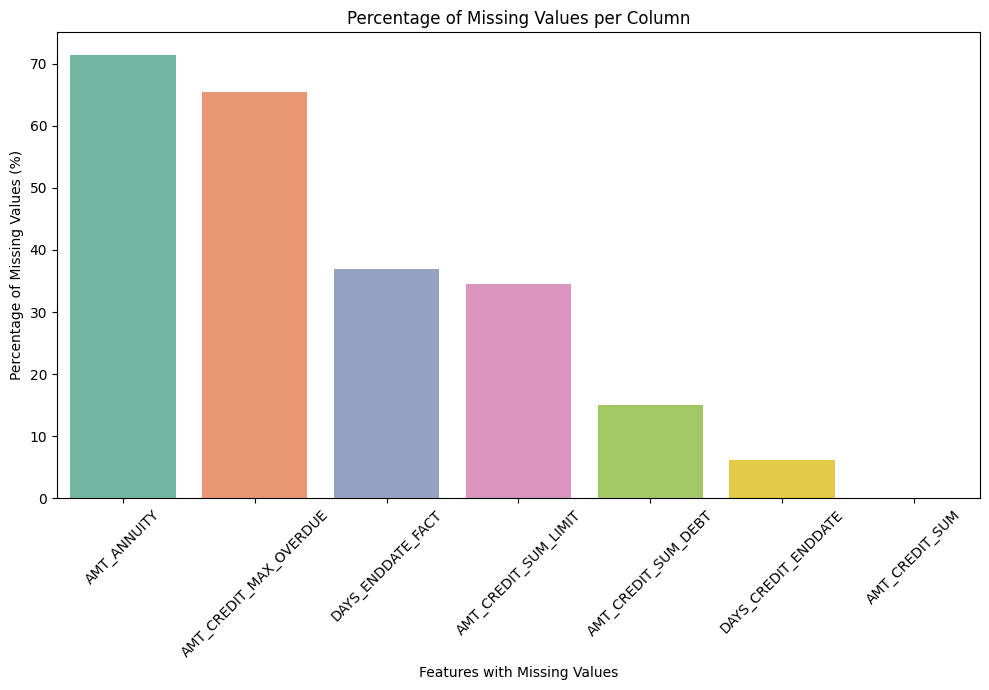

In [84]:
# finding the missing values of bureau.csv dataset
missing_perc=bureau_df.isnull().mean()*100
missing_perc=missing_perc[missing_perc>0].sort_values(ascending=False)
# ploting the missing value 
plt.figure(figsize=(10,7))
sns.barplot(x=missing_perc.index, y=missing_perc.values,palette='Set2')
plt.xlabel('Features with Missing Values')
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Percentage of Missing Values per Column')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [85]:
print(missing_perc)

AMT_ANNUITY               71.473490
AMT_CREDIT_MAX_OVERDUE    65.513264
DAYS_ENDDATE_FACT         36.916958
AMT_CREDIT_SUM_LIMIT      34.477415
AMT_CREDIT_SUM_DEBT       15.011932
DAYS_CREDIT_ENDDATE        6.149573
AMT_CREDIT_SUM             0.000757
dtype: float64


#### seperating Numerical and categorical features

In [10]:
# Numerical Features
bureau_num_features=[feature for feature in bureau_df.columns if bureau_df[feature].dtypes!='object']
# Categorical Features
bureau_cat_features=[feature for feature in bureau_df.columns if bureau_df[feature].dtypes=='object']

print('Numerical Features:', bureau_num_features,'\n')
print('Length of Numerical Features:',len(bureau_num_features))
print('='*40)
print('Categorical Features:', bureau_cat_features,'\n')
print('Length of Categorical Features:',len(bureau_cat_features))

Numerical Features: ['SK_ID_CURR', 'SK_ID_BUREAU', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY'] 

Length of Numerical Features: 14
Categorical Features: ['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE'] 

Length of Categorical Features: 3


### Analysis of Numerical Features

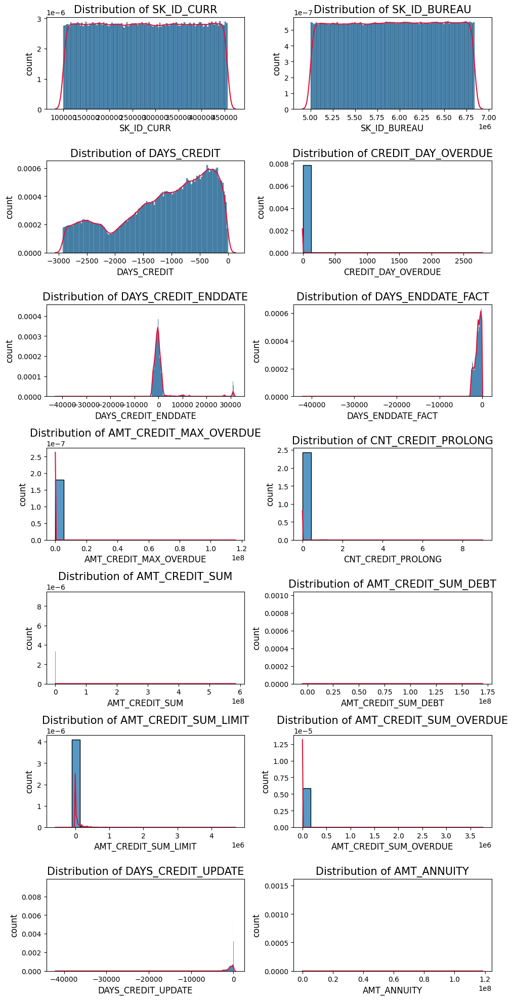

In [15]:
# Ploting Histogram with KDE of Numerical features
plt.figure(figsize=(10,20))
plotnumber=1
for feature in bureau_num_features:
    plt.subplot(7,2,plotnumber) #7*2=14, means we are trying to print 14 subplots 
    #sns.histplot(application_df[feature],kde=True)
    ax = sns.histplot(bureau_df[feature], kde=False, stat='density')
    sns.kdeplot(bureau_df[feature], color='crimson', ax=ax)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=12)
    plt.ylabel('count',fontsize=12)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### correlation of Numerical features using Heatmap

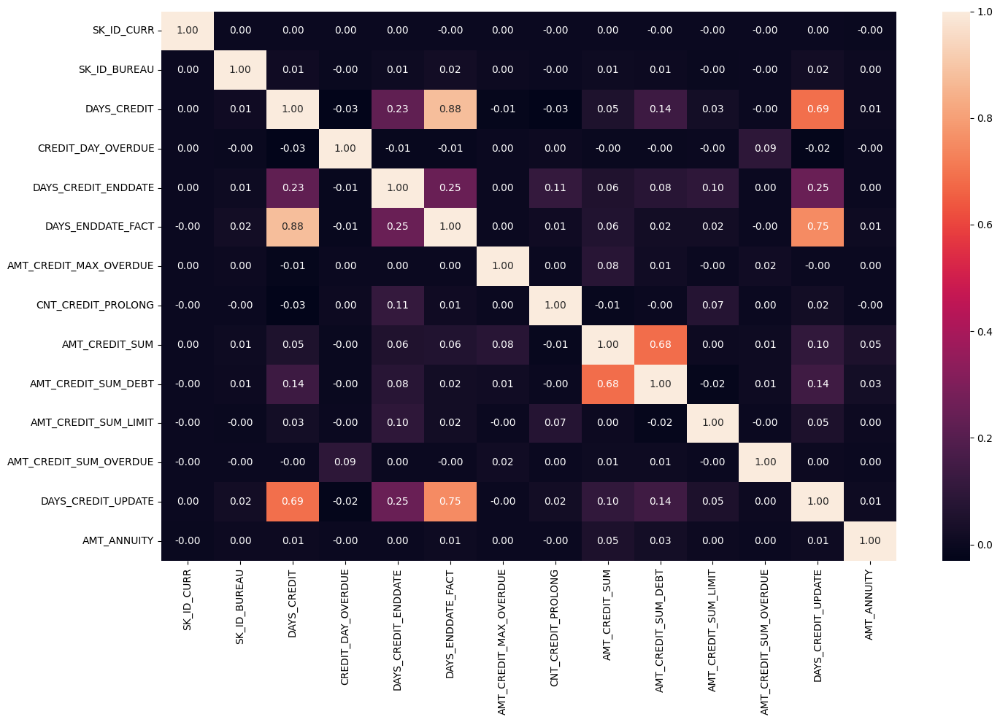

In [11]:
corr_matrix= bureau_df[bureau_num_features].corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr_matrix,annot=True,fmt='.2f')
plt.tight_layout()
plt.show()

### Analysis of Categorical Features

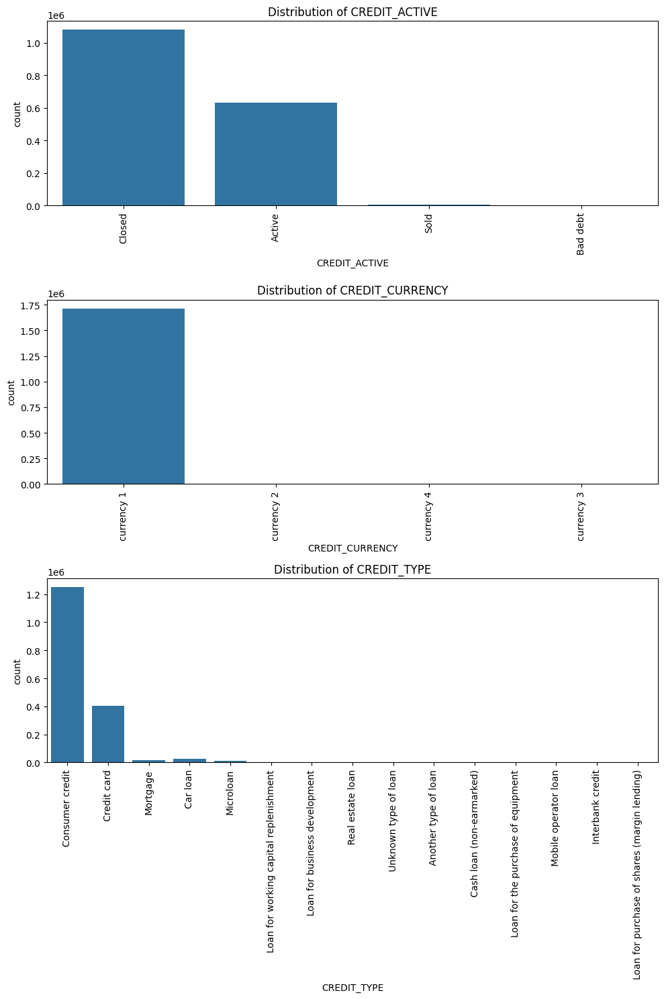

In [14]:
# ploting the categorical features
plt.figure(figsize=(10,15)) # To fix the canvas size
plotnumber=1 # initializing plot number
for feature in bureau_cat_features:
    plt.subplot(3,1,plotnumber) #16*1=16, means we are trying to print 40 subplots 
    sns.countplot(x=bureau_df[feature])
    plt.title(f'Distribution of {feature}',fontsize=12)
    plt.xlabel(feature,fontsize=10)
    plt.xticks(rotation=90)
    plt.ylabel('count',fontsize=10)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

#### Bivariate Analysis of Bureau features

**CREDIT_ACTIVE vs DAYS_CREDIT** 

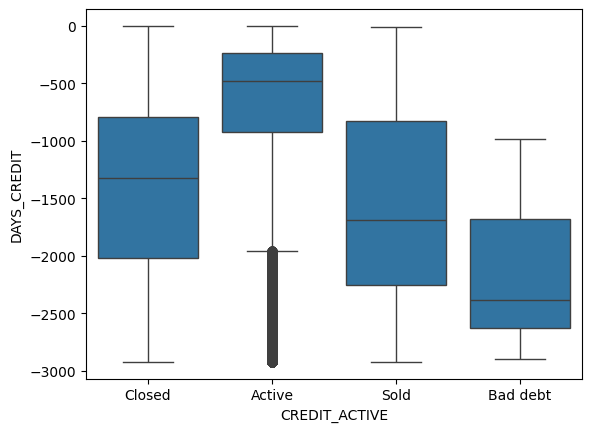

In [22]:
# Analysis using Boxplot 
sns.boxplot(x=bureau_df['CREDIT_ACTIVE'],y=bureau_df['DAYS_CREDIT'])
plt.show()

### Correlation of Categorical features using Phi_K matrix

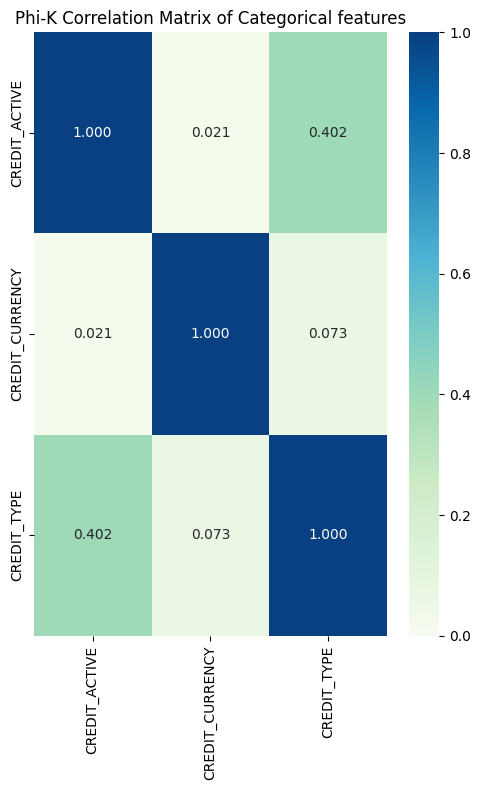

In [57]:
bureau_phi_k_corr = bureau_df[bureau_cat_features].phik_matrix()
plt.figure(figsize=(5,8))
sns.heatmap(bureau_phi_k_corr, annot=True, cmap="GnBu", vmin=0, vmax=1,fmt=".3f")
plt.title("Phi-K Correlation Matrix of Categorical features")
plt.tight_layout()
plt.show()

### Analysis of important Bureau features
* **DAY_CREDIT:** From the above plot, we have found that, When the **Credit Status** is `Active`, it means that the corresponding `Days_Credit` i.e. number of days before Application, the median value is approx. 500 days.
* **CREDIT_ACTIVE:** From the above plot, we have found that, most of the applications in the Bureau Data are `closed`, which is followed by the status being `Active`.There are very few loans that are `Sold` or considered to be `Bad Debt`.
* **CREDIT_TYPE:** From the above plot, we have found that, `Consumer Credit` and `Credit Cards` are the mostly registered `credit type` in the Credit Bureau.

### 4.C. EDA of **bureau_balance.csv** Dataset

In [25]:
bureau_balance_df.columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

* In **bureau_balance.csv** dataset there is no **TARGET**(output) feature

In [30]:
bureau_balance_df.head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


### Numerical Feature Analysis

In [13]:
# Fetching Numerical features
bureau_bal_num_features=[feature for feature in bureau_balance_df.columns if bureau_balance_df[feature].dtypes !='O']
print(bureau_bal_num_features)

['SK_ID_BUREAU', 'MONTHS_BALANCE']


#### Histogram of Numerical features

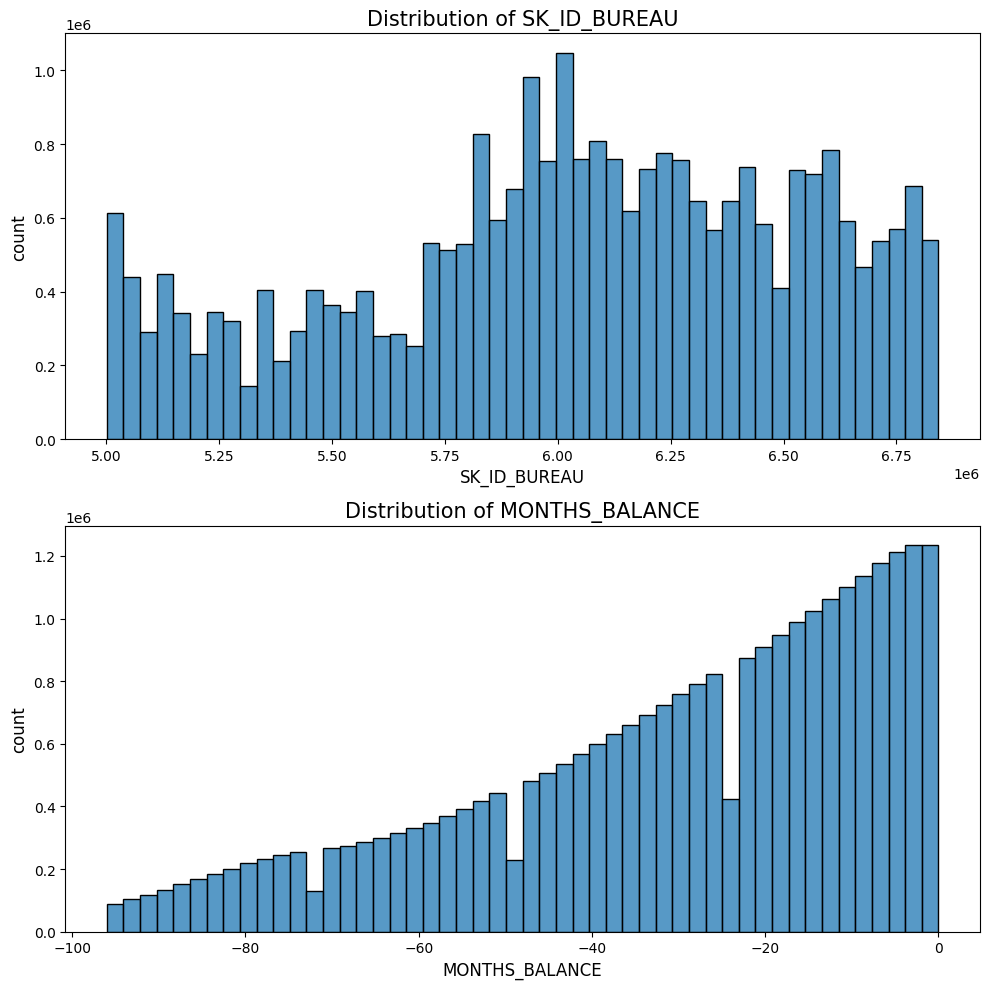

In [17]:
# ploting the Histgram of numerical features
plt.figure(figsize=(10,10))
plotnumber=1
for feature in bureau_bal_num_features:
    plt.subplot(2,1,plotnumber)
    sns.histplot(bureau_balance_df[feature], bins=50)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=12)
    plt.ylabel('count',fontsize=12)
    plotnumber+=1
plt.tight_layout() 
plt.show()    

### correlation of Numerical features using Heatmap

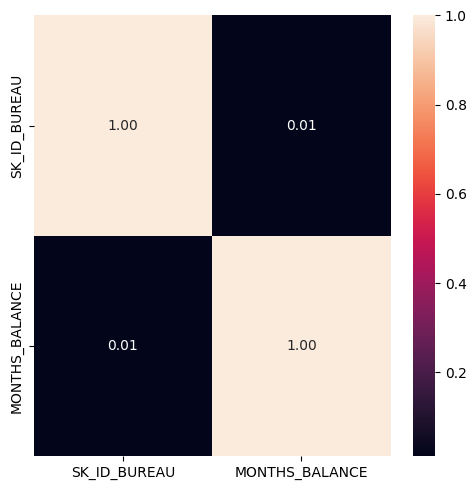

In [16]:
corr_matrix= bureau_balance_df[bureau_bal_num_features].corr()
plt.figure(figsize=(5,5))
sns.heatmap(corr_matrix,annot=True,fmt='.2f')
plt.tight_layout()
plt.show()

### Categorical Feature Analysis

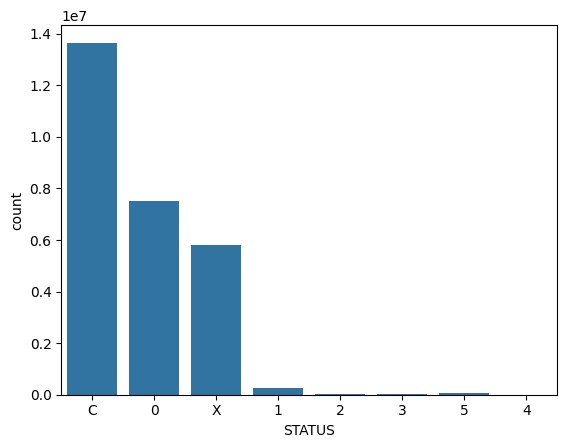

In [33]:
# Analysis of STATUS feature
sns.countplot(x=bureau_balance_df['STATUS'])
plt.show()

### Analysis: Important feature of **bereau_balance.csv** 
* **SK_ID_BUREAU:** This feature is `Id` columns, which will help to join with `bureau.csv` dataset.
* **STATUS:** Most of the loans are `C means Closed` in the Credit Bureau, which is followed by clients with  `0 means DPD` and then by applicants whose status is `X means unknown`. We can conclude that there are very few annuity `1 means defaulters` in the data.

### 4.D. EDA of **previous_application.csv** dataset

In [10]:
previous_application_df.shape

(1670214, 37)

In [11]:
previous_application_df.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [33]:
previous_application_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430054,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615234,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735352,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335938,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.394531,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


### Missing Values

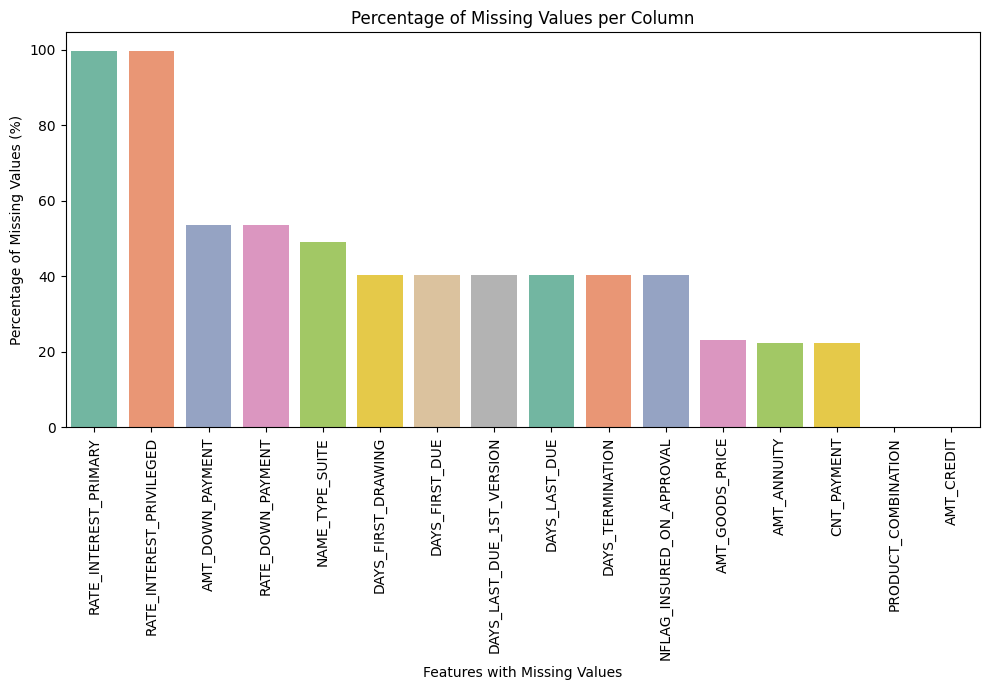

In [65]:
# finding the missing values of previous_application.csv dataset
missing_perc=previous_application_df.isnull().mean()*100
missing_perc=missing_perc[missing_perc>0].sort_values(ascending=False)
# ploting the missing value 
plt.figure(figsize=(10,7))
sns.barplot(x=missing_perc.index, y=missing_perc.values,palette='Set2')
plt.xlabel('Features with Missing Values')
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Percentage of Missing Values per Column')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [71]:
# Missing values in features 
print(missing_perc)

RATE_INTEREST_PRIMARY        99.643698
RATE_INTEREST_PRIVILEGED     99.643698
AMT_DOWN_PAYMENT             53.636480
RATE_DOWN_PAYMENT            53.636480
NAME_TYPE_SUITE              49.119754
DAYS_FIRST_DRAWING           40.298129
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_LAST_DUE                40.298129
DAYS_TERMINATION             40.298129
NFLAG_INSURED_ON_APPROVAL    40.298129
AMT_GOODS_PRICE              23.081773
AMT_ANNUITY                  22.286665
CNT_PAYMENT                  22.286366
PRODUCT_COMBINATION           0.020716
AMT_CREDIT                    0.000060
dtype: float64


In [58]:
# Numerical Features
prev_app_num_features=[feature for feature in previous_application_df.columns if previous_application_df[feature].dtypes!='object']
# Categorical Features
prev_app_cat_features=[feature for feature in previous_application_df.columns if previous_application_df[feature].dtypes=='object']

print('Numerical Features:', prev_app_num_features,'\n')
print('Length of Numerical Features:',len(prev_app_num_features))
print('='*40)
print('Categorical Features:', prev_app_cat_features,'\n')
print('Length of Categorical Features:',len(prev_app_cat_features))

Numerical Features: ['SK_ID_PREV', 'SK_ID_CURR', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'] 

Length of Numerical Features: 21
Categorical Features: ['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'] 

Length of Categorical Features: 16


### Numerical Features Analysis

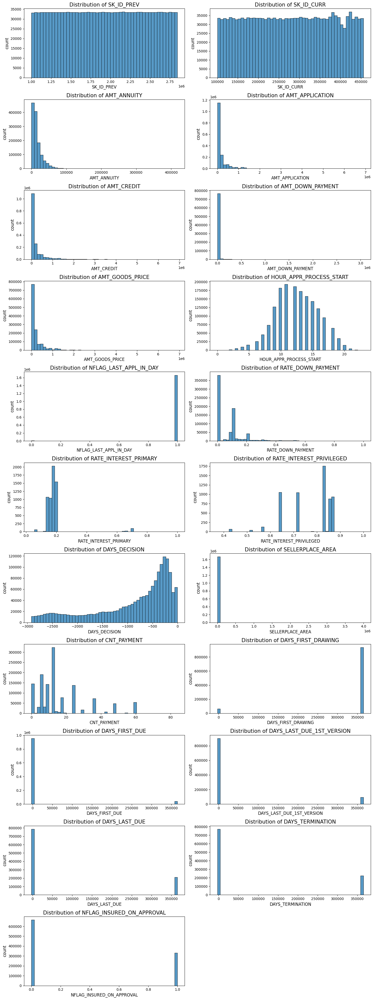

In [79]:
# Ploting Histogram with KDE of Numerical features
data=previous_application_df.copy()
plt.figure(figsize=(15,40))
plotnumber=1
for feature in prev_app_num_features:
    plt.subplot(11,2,plotnumber) #11*2=22, means we are trying to print 22 subplots 
    #sns.histplot(previous_application_df[feature],kde=True)
    sns.histplot(data[feature],bins=50)
    #sns.kdeplot(previous_application_df[feature], color='crimson', ax=ax)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=12)
    plt.ylabel('count',fontsize=12)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### correlation of Numerical features using Heatmap

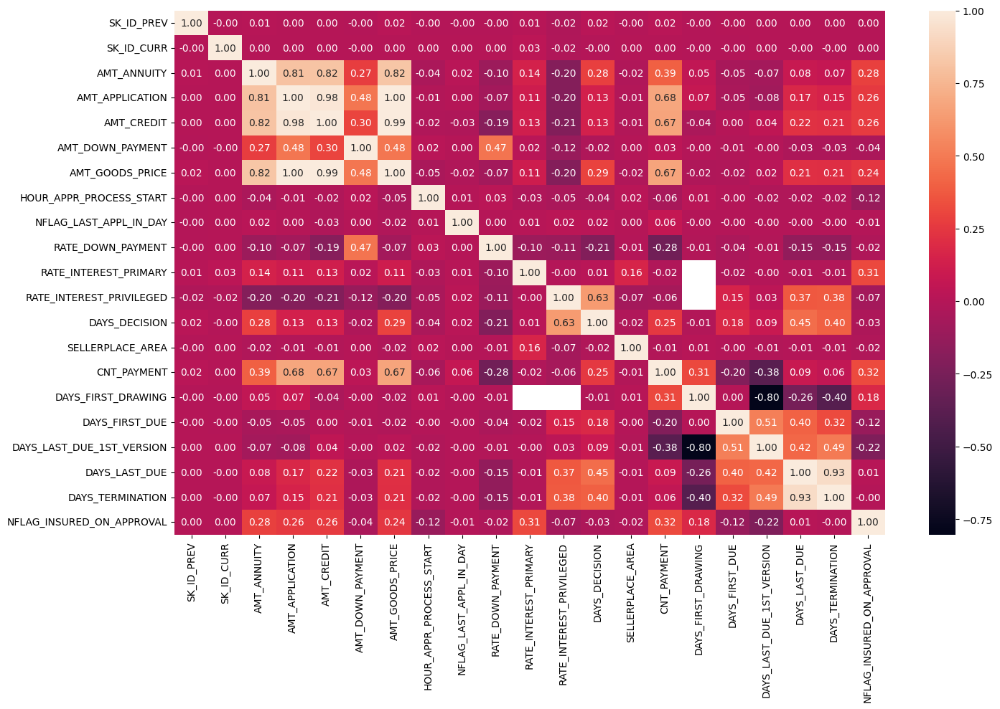

In [70]:
corr_matrix= previous_application_df[prev_app_num_features].corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr_matrix,annot=True,fmt='.2f')
plt.tight_layout()
plt.show()

### Categorical Features Analysis

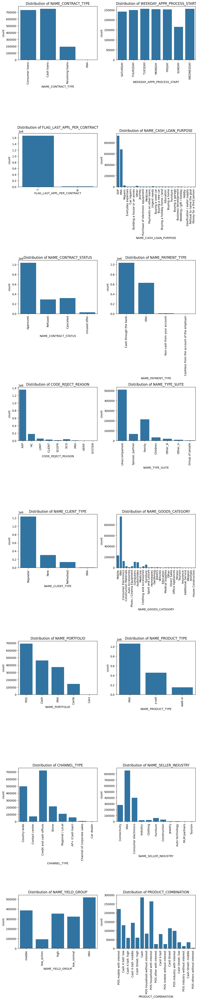

In [19]:
# ploting the categorical features
plt.figure(figsize=(10,50)) # To fix the canvas size
plotnumber=1 # initializing plot number
for feature in prev_app_cat_features:
    plt.subplot(8,2,plotnumber) #8*2=16, means we are trying to print 40 subplots 
    sns.countplot(x=previous_application_df[feature])
    plt.title(f'Distribution of {feature}',fontsize=12)
    plt.xlabel(feature,fontsize=10)
    plt.xticks(rotation=90)
    plt.ylabel('count',fontsize=10)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### Correlation of Categorical features using Phi_K matrix

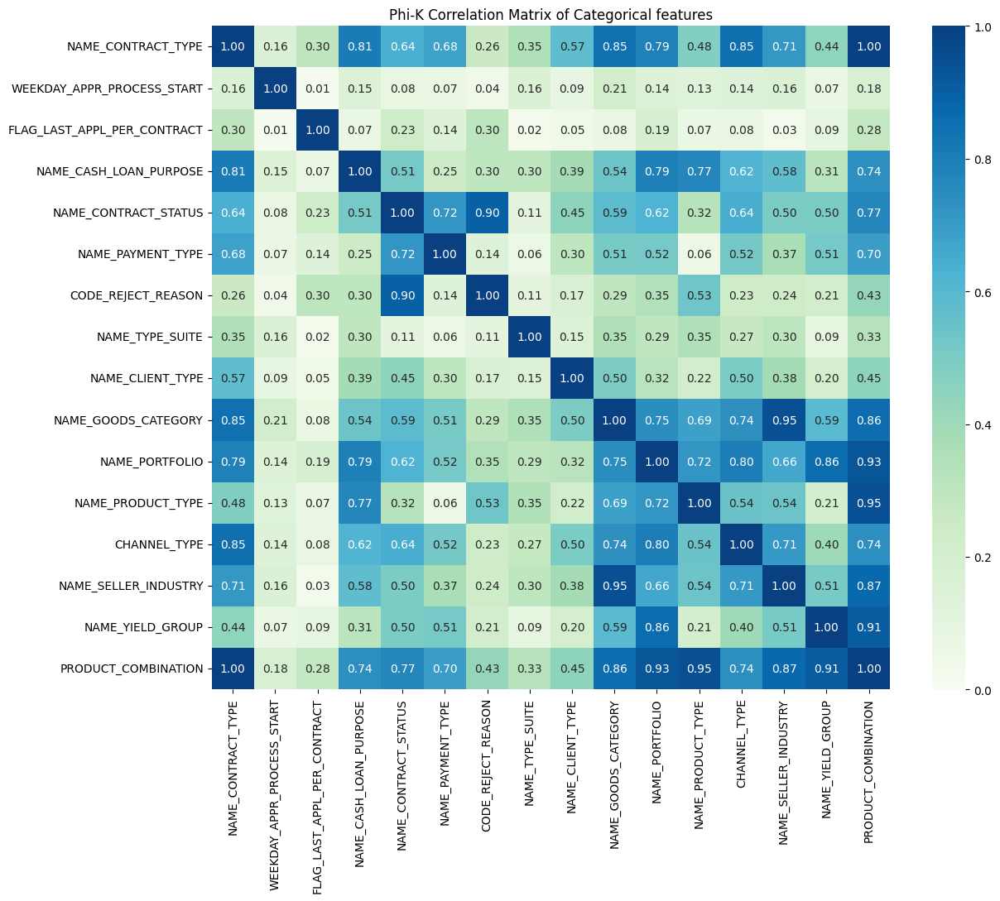

In [64]:
prev_app_phi_k_corr = previous_application_df[prev_app_cat_features].phik_matrix()
plt.figure(figsize=(13,11))
sns.heatmap(prev_app_phi_k_corr, annot=True, cmap="GnBu", vmin=0, vmax=1,fmt=".2f")
plt.title("Phi-K Correlation Matrix of Categorical features")
plt.tight_layout()
plt.show()

### Analysis: Important feature of **previous_application.csv** 
* **SK_ID_PREV:** This is the id column of this dataset.
* **SK_ID_CURR:** This feature will help to join this dataset to `application_train.csv` which is main dataset.

### Droping the features with missing values(more than 90%)

In [10]:
# Dropping highly missing values columns
previous_application_df = previous_application_df.drop(columns=['RATE_INTEREST_PRIMARY','RATE_INTEREST_PRIVILEGED'])

In [12]:
previous_application_df.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS',
       'DAYS_DECISION', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY', 'CNT_PAYMENT',
       'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING',
       'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE',
       'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [11]:
# Printing No of features left in previous_application_df
print(previous_application_df.shape[1])

35


### 4.E. EDA of **POSH_CASH_balance.csv** dataset

In [86]:
posh_cash_balance_df.shape

(10001358, 8)

In [87]:
posh_cash_balance_df.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [88]:
posh_cash_balance_df.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

### Missing Values


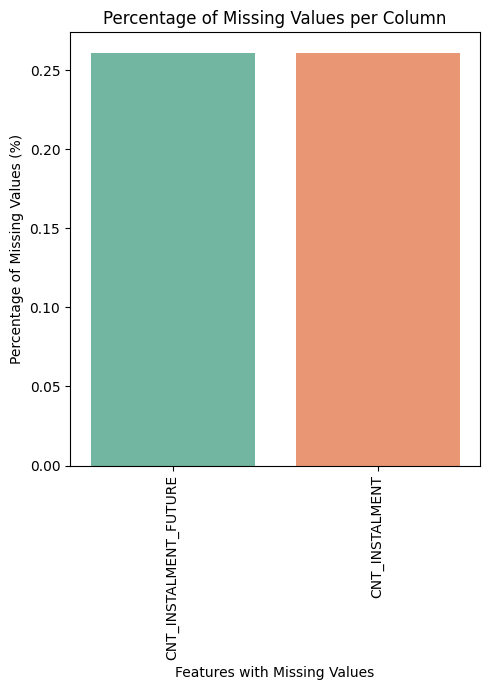

In [91]:
# finding the missing values of POSH_CASH_balance.csv dataset
missing_perc=posh_cash_balance_df.isnull().mean()*100
missing_perc=missing_perc[missing_perc>0].sort_values(ascending=False)
# ploting the missing value 
plt.figure(figsize=(5,7))
sns.barplot(x=missing_perc.index, y=missing_perc.values,palette='Set2')
plt.xlabel('Features with Missing Values')
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Percentage of Missing Values per Column')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [92]:
print(missing_perc)

CNT_INSTALMENT_FUTURE    0.260835
CNT_INSTALMENT           0.260675
dtype: float64


#### seperating Numerical and Categorical features

In [93]:
# Numerical Features
posh_cash_num_features=[feature for feature in posh_cash_balance_df.columns if posh_cash_balance_df[feature].dtypes!='object']
# Categorical Features
posh_cash_cat_features=[feature for feature in posh_cash_balance_df.columns if posh_cash_balance_df[feature].dtypes=='object']

print('Numerical Features:', posh_cash_num_features,'\n')
print('Length of Numerical Features:',len(posh_cash_num_features))
print('='*40)
print('Categorical Features:', posh_cash_cat_features,'\n')
print('Length of Categorical Features:',len(posh_cash_cat_features))

Numerical Features: ['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE', 'SK_DPD', 'SK_DPD_DEF'] 

Length of Numerical Features: 7
Categorical Features: ['NAME_CONTRACT_STATUS'] 

Length of Categorical Features: 1


### Numerical feature analysis

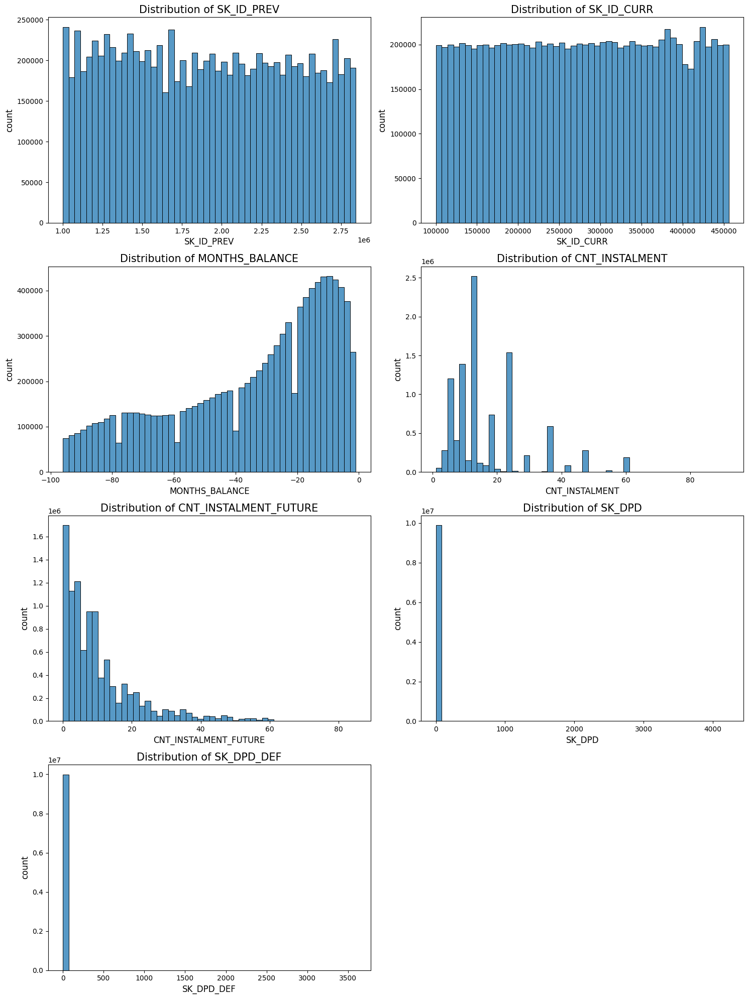

In [101]:
# Ploting Histogram with KDE of Numerical features
data=posh_cash_balance_df.copy()
plt.figure(figsize=(15,20))
plotnumber=1
for feature in posh_cash_num_features:
    plt.subplot(4,2,plotnumber) 
    #sns.histplot(previous_application_df[feature],kde=True)
    sns.histplot(data[feature], bins=50)
    #sns.kdeplot(previous_application_df[feature], color='crimson', ax=ax)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=12)
    plt.ylabel('count',fontsize=12)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### correlation of Numerical features using Heatmap

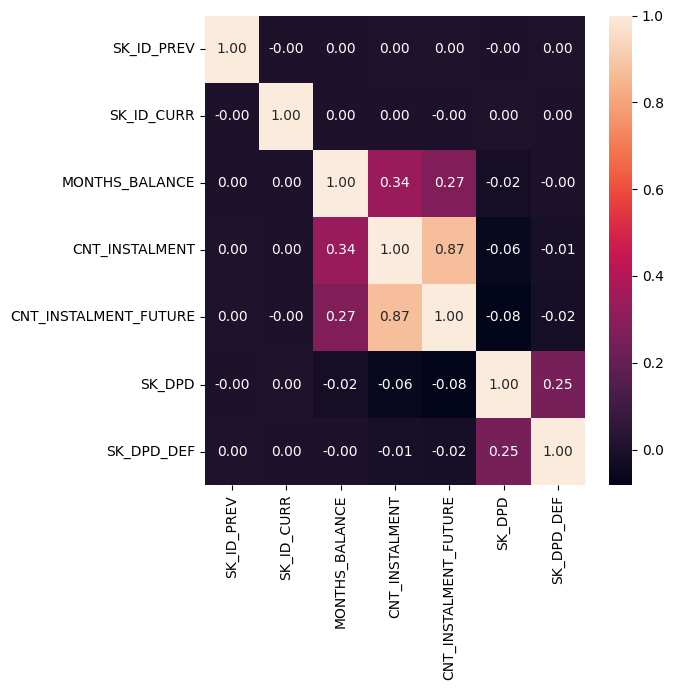

In [99]:
corr_matrix= posh_cash_balance_df[posh_cash_num_features].corr()
plt.figure(figsize=(7,7))
sns.heatmap(corr_matrix,annot=True,fmt='.2f')
plt.tight_layout()
plt.show()

### Categorical Features Analysis

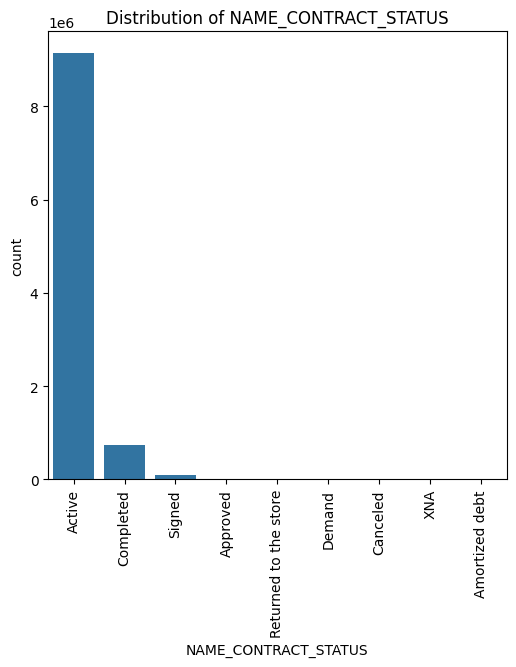

In [102]:
# ploting the categorical features
plt.figure(figsize=(10,50)) # To fix the canvas size
plotnumber=1 # initializing plot number
for feature in posh_cash_cat_features:
    plt.subplot(8,2,plotnumber) #8*2=16, means we are trying to print 40 subplots 
    sns.countplot(x=posh_cash_balance_df[feature])
    plt.title(f'Distribution of {feature}',fontsize=12)
    plt.xlabel(feature,fontsize=10)
    plt.xticks(rotation=90)
    plt.ylabel('count',fontsize=10)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### 4.F. EDA of **installment_payments.csv** dataset

In [106]:
installments_pay_df.shape

(13605401, 8)

In [104]:
installments_pay_df.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')

In [105]:
installments_pay_df.head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.359863,6948.359863
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525024,1716.525024
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000000,25425.000000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130859,24350.130859
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040039,2160.584961


### Missing Values

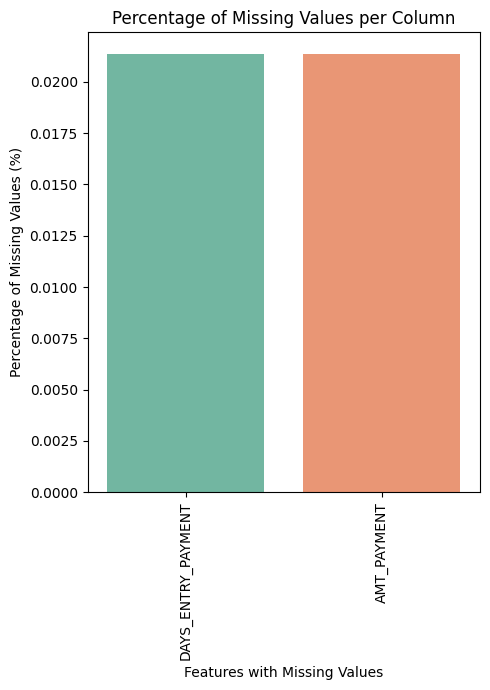

In [110]:
# finding the missing values of installment_payments.csv dataset
missing_perc=installments_pay_df.isnull().mean()*100
missing_perc=missing_perc[missing_perc>0].sort_values(ascending=False)
# ploting the missing value 
plt.figure(figsize=(5,7))
sns.barplot(x=missing_perc.index, y=missing_perc.values,palette='Set2')
plt.xlabel('Features with Missing Values')
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Percentage of Missing Values per Column')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [111]:
print(missing_perc)

DAYS_ENTRY_PAYMENT    0.021352
AMT_PAYMENT           0.021352
dtype: float64


#### seperating Numerical and Categorical features

In [107]:
# Numerical Features
installment_pay_num_features=[feature for feature in installments_pay_df.columns if installments_pay_df[feature].dtypes!='object']
# Categorical Features
installment_pay_cat_features=[feature for feature in installments_pay_df.columns if installments_pay_df[feature].dtypes=='object']

print('Numerical Features:', installment_pay_num_features,'\n')
print('Length of Numerical Features:',len(installment_pay_num_features))
print('='*40)
print('Categorical Features:', installment_pay_cat_features,'\n')
print('Length of Categorical Features:',len(installment_pay_cat_features))

Numerical Features: ['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION', 'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_INSTALMENT', 'AMT_PAYMENT'] 

Length of Numerical Features: 8
Categorical Features: [] 

Length of Categorical Features: 0


### Numerical Features Analysis

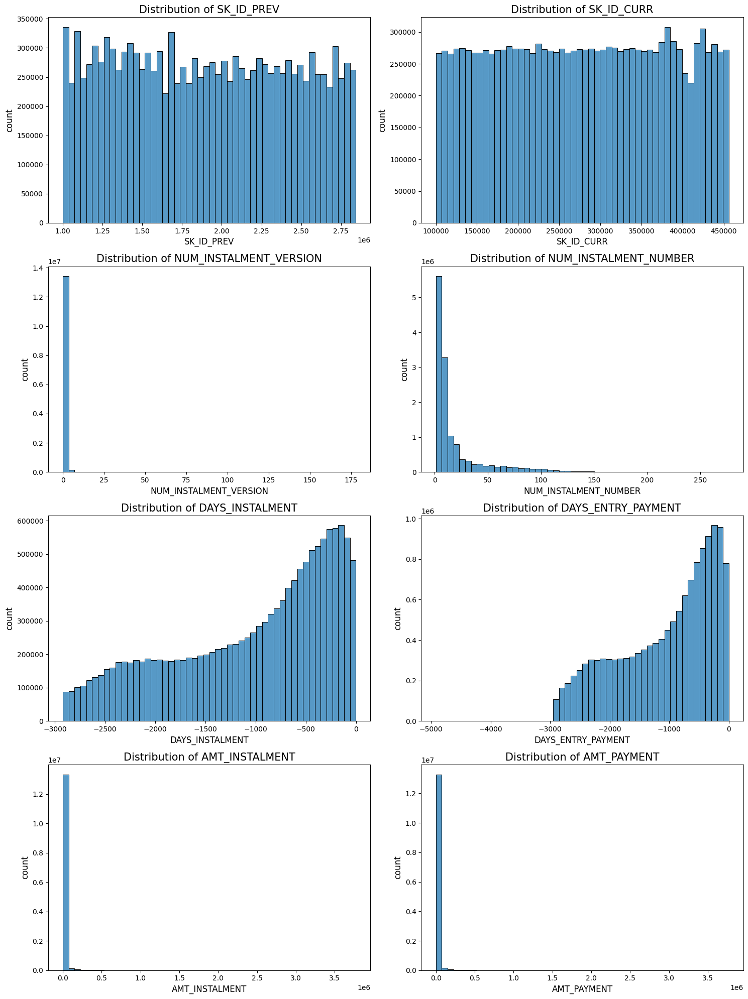

In [108]:
# Ploting Histogram with KDE of Numerical features
data=installments_pay_df.copy()
plt.figure(figsize=(15,20))
plotnumber=1
for feature in installment_pay_num_features:
    plt.subplot(4,2,plotnumber) 
    #sns.histplot(previous_application_df[feature],kde=True)
    sns.histplot(data[feature], bins=50)
    #sns.kdeplot(previous_application_df[feature], color='crimson', ax=ax)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=12)
    plt.ylabel('count',fontsize=12)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

### correlation of Numerical features using Heatmap

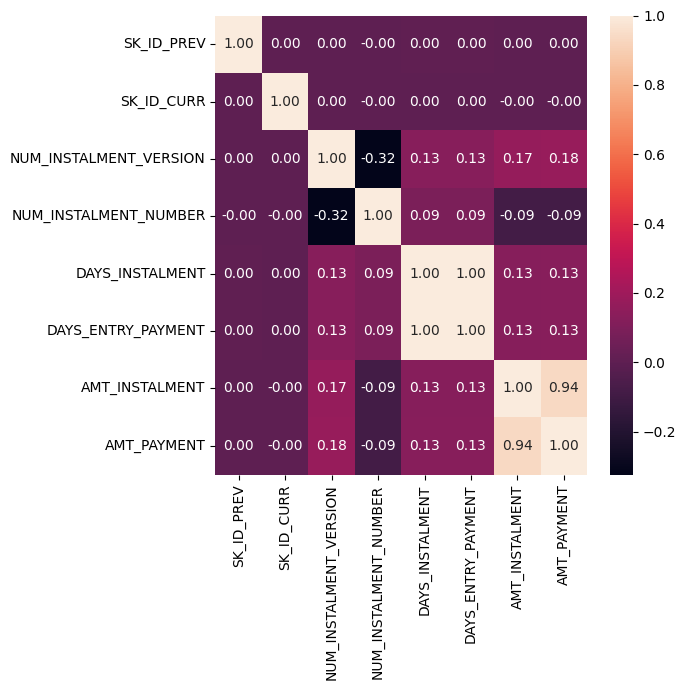

In [109]:
corr_matrix= installments_pay_df[installment_pay_num_features].corr()
plt.figure(figsize=(7,7))
sns.heatmap(corr_matrix,annot=True,fmt='.2f')
plt.tight_layout()
plt.show()

### 4.G. EDA of **credit_card.csv** dataset

In [112]:
credit_card_bal_df.shape

(3840312, 23)

In [113]:
credit_card_bal_df.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [114]:
credit_card_bal_df.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970001,135000,0.0,877.5,0.0,877.5,1700.324951,1800.0,1800.0,0.000000,0.000000,0.000000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.554688,45000,2250.0,2250.0,0.0,0.0,2250.000000,2250.0,2250.0,60175.078125,64875.554688,64875.554688,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.224609,450000,0.0,0.0,0.0,0.0,2250.000000,2250.0,2250.0,26926.425781,31460.085938,31460.085938,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.109375,225000,2250.0,2250.0,0.0,0.0,11795.759766,11925.0,11925.0,224949.281250,233048.968750,233048.968750,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.468750,450000,0.0,11547.0,0.0,11547.0,22924.890625,27000.0,27000.0,443044.406250,453919.468750,453919.468750,0.0,1,0.0,1.0,101.0,Active,0,0


### Missing values

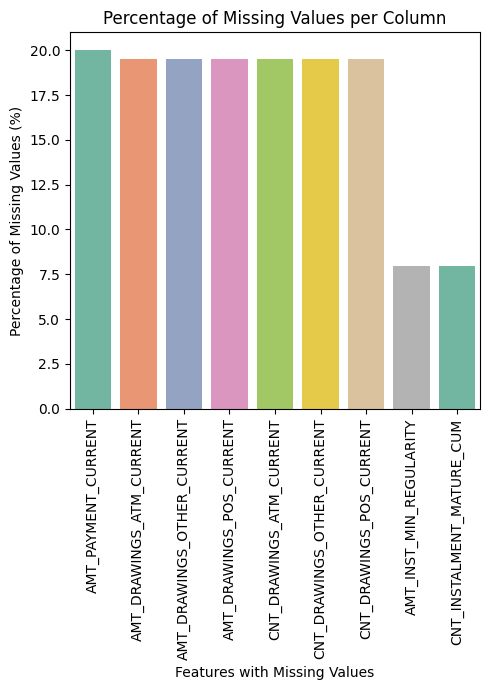

In [115]:
# finding the missing values of POSH_CASH_balance.csv dataset
missing_perc=credit_card_bal_df.isnull().mean()*100
missing_perc=missing_perc[missing_perc>0].sort_values(ascending=False)
# ploting the missing value 
plt.figure(figsize=(5,7))
sns.barplot(x=missing_perc.index, y=missing_perc.values,palette='Set2')
plt.xlabel('Features with Missing Values')
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Percentage of Missing Values per Column')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [121]:
print(missing_perc)

AMT_PAYMENT_CURRENT           19.998063
AMT_DRAWINGS_ATM_CURRENT      19.524872
AMT_DRAWINGS_OTHER_CURRENT    19.524872
AMT_DRAWINGS_POS_CURRENT      19.524872
CNT_DRAWINGS_ATM_CURRENT      19.524872
CNT_DRAWINGS_OTHER_CURRENT    19.524872
CNT_DRAWINGS_POS_CURRENT      19.524872
AMT_INST_MIN_REGULARITY        7.948208
CNT_INSTALMENT_MATURE_CUM      7.948208
dtype: float64


#### Seperating Numerical and Categorical features

In [116]:
# Numerical Features
credit_card_num_features=[feature for feature in credit_card_bal_df.columns if credit_card_bal_df[feature].dtypes!='object']
# Categorical Features
credit_card_cat_features=[feature for feature in credit_card_bal_df.columns if credit_card_bal_df[feature].dtypes=='object']

print('Numerical Features:', credit_card_num_features,'\n')
print('Length of Numerical Features:',len(credit_card_num_features))
print('='*40)
print('Categorical Features:', credit_card_cat_features,'\n')
print('Length of Categorical Features:',len(credit_card_cat_features))

Numerical Features: ['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM', 'SK_DPD', 'SK_DPD_DEF'] 

Length of Numerical Features: 22
Categorical Features: ['NAME_CONTRACT_STATUS'] 

Length of Categorical Features: 1


### Numerical Feature Analysis

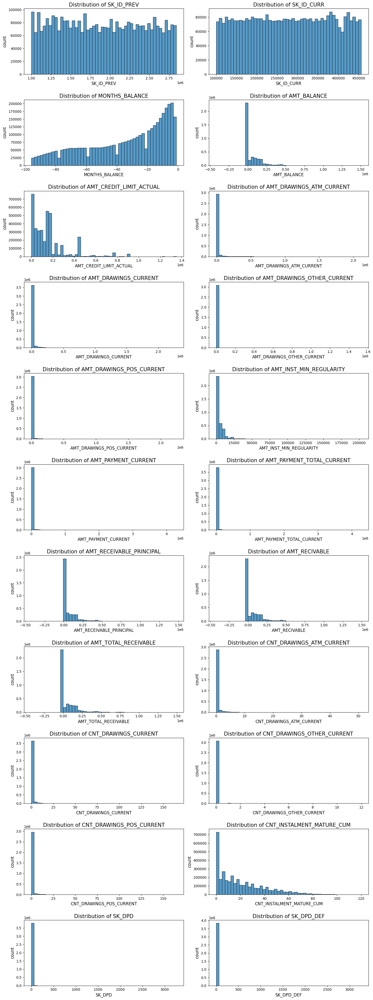

In [119]:
# Ploting Histogram with KDE of Numerical features
data=credit_card_bal_df.copy()
plt.figure(figsize=(15,40))
plotnumber=1
for feature in credit_card_num_features:
    plt.subplot(11,2,plotnumber) 
    #sns.histplot(previous_application_df[feature],kde=True)
    sns.histplot(data[feature], bins=50)
    #sns.kdeplot(previous_application_df[feature], color='crimson', ax=ax)
    plt.title(f'Distribution of {feature}',fontsize=15)
    plt.xlabel(feature,fontsize=12)
    plt.ylabel('count',fontsize=12)
    plotnumber+=1
plt.tight_layout() # using tight layout to adjust the shape and do not overlap the figures
plt.show()

#### correlation of Numerical features using Heatmap

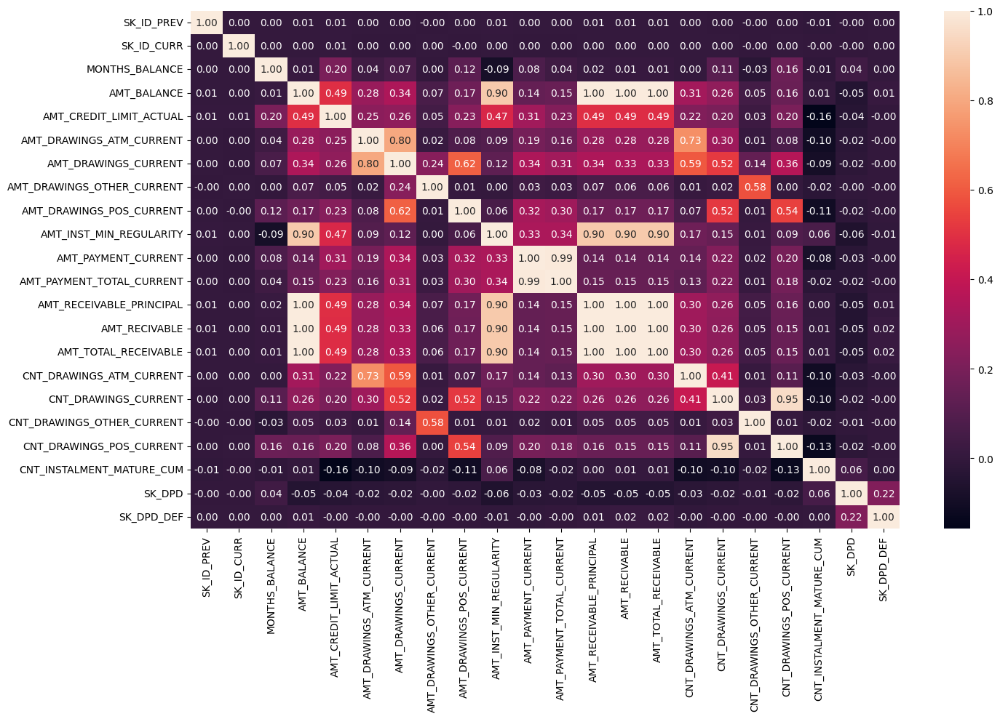

In [120]:
corr_matrix= credit_card_bal_df[credit_card_num_features].corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr_matrix,annot=True,fmt='.2f')
plt.tight_layout()
plt.show()

### Categorical feature Analysis

In [36]:
# fetching categories of NAME_CONTRACT_STATUS feature
credit_card_bal_df['NAME_CONTRACT_STATUS'].unique()

array(['Active', 'Completed', 'Demand', 'Signed', 'Sent proposal',
       'Refused', 'Approved'], dtype=object)

In [41]:
# fetching categories of NAME_CONTRACT_STATUS feature
credit_card_bal_df['NAME_CONTRACT_STATUS'].value_counts()

NAME_CONTRACT_STATUS
Active           3698436
Completed         128918
Signed             11058
Demand              1365
Sent proposal        513
Refused               17
Approved               5
Name: count, dtype: int64

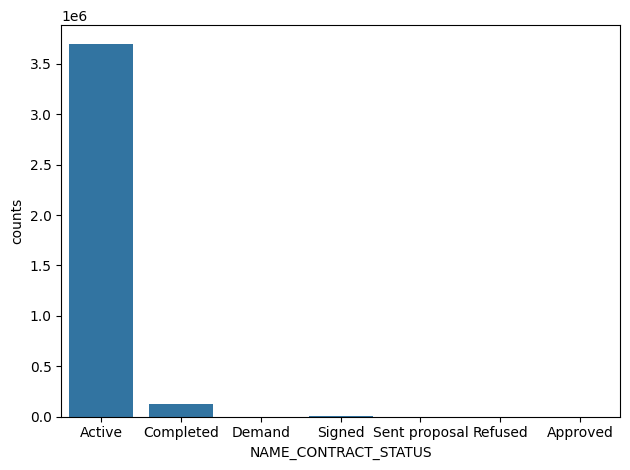

In [40]:
# Ploting the NAME_CONTRACT_STATUS using countplot
sns.countplot(x=credit_card_bal_df['NAME_CONTRACT_STATUS'])
plt.xlabel('NAME_CONTRACT_STATUS')
plt.ylabel('counts')
plt.tight_layout()
plt.show()

## 5. Sampling and Joining of datasets

In [ ]:
# application_df -> (307511, 122)
# bureau_df -> (1716428, 17)
# bureau_balance_df -> (27299925, 3)
# previous_application_df -> (1670214, 37)
# posh_cash_balance_df -> (10001358, 8)
# installments_pay_df -> (13605401, 8)
# credit_card_bal_df -> (3840312, 23)

# Stratified Sampling 
#data.groupby('Survived', group_keys=False).apply(lambda x: x.sample(frac=0.01))

#### Step.1. Sampling of application_train.csv

In [12]:
# Creating 10% Stratified Sample
application_df_sample=application_df.groupby('TARGET', group_keys=False).apply(lambda x: x.sample(frac=0.1))

In [13]:
application_df_sample.shape

(30751, 122)

In [14]:
application_df_sample['TARGET'].value_counts(normalize=True)*100

TARGET
0    91.928718
1     8.071282
Name: proportion, dtype: float64

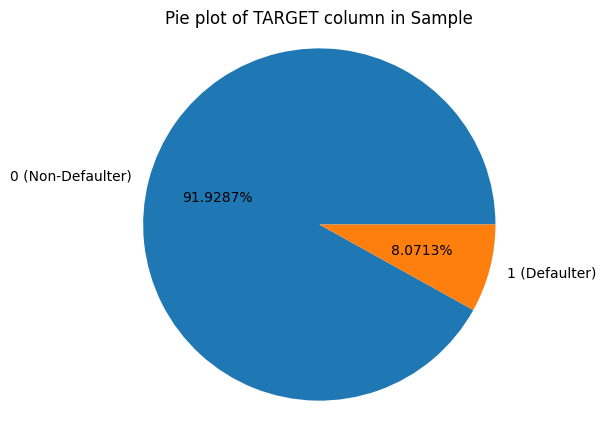

In [15]:
# Ploting in Pie plot
counts_sample = application_df_sample['TARGET'].value_counts()
plt.figure(figsize=(5, 5))

# Plot the Pie Chart
plt.pie(
    counts_sample, 
    labels=['0 (Non-Defaulter)', '1 (Defaulter)'],  # Custom labels
    autopct='%1.4f%%',       # format to show percentage (e.g., 91.9%)
    #startangle=90,           # rotates the start to look cleaner
    #explode=(0, 0.1)         # optional: pulls the '1' slice out slightly
)

plt.title('Pie plot of TARGET column in Sample')
plt.axis('equal')  # Ensures the pie chart is drawn as a circle
plt.show()

* As we can the application_train.csv Sample(Stratified) is proportionally similar to original.

In [16]:
# Creating Filter list of ids
application_sample_ids = application_df_sample['SK_ID_CURR'].unique()

print(f"Application Sample Shape: {application_df_sample.shape}")
print(f"Number of unique applicants: {len(application_sample_ids)}")

Application Sample Shape: (30751, 122)
Number of unique applicants: 30751


#### Step.2. Sampling and joining of Bureau and Bureau_balance dataset

* As we know that `Bureau` dataset has a **child** `Bureau_balance` dataset.
* #### Logic: Bureau Balance (Months) $\to$ Bureau (Loans) $\to$ Customer

In [17]:
bureau_df.shape

(1716428, 17)

In [18]:
bureau_balance_df.shape

(27299925, 3)

In [19]:
bureau_df.columns

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')

In [21]:
bureau_balance_df.columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

**Step.A: Bureau Balance Process**

In [20]:
# Aggregate Monthly history to Loan Level
# 1. Aggregation (.groupby & .agg)
bureau_bal_agg = bureau_balance_df.groupby('SK_ID_BUREAU').agg({'MONTHS_BALANCE': ['min', 'max', 'size']})
# 2. Flattening the Columns (The List Comprehension)
bureau_bal_agg.columns = ['BB_' + '_'.join(col) for col in bureau_bal_agg.columns]
# 3. Resetting the Index
bureau_bal_agg.reset_index(inplace=True)

In [21]:
bureau_bal_agg.shape

(817395, 4)

In [24]:
bureau_bal_agg.head()

,SK_ID_BUREAU,BB_MONTHS_BALANCE_min,BB_MONTHS_BALANCE_max,BB_MONTHS_BALANCE_size
0,5001709,-96,0,97
1,5001710,-82,0,83
2,5001711,-3,0,4
3,5001712,-18,0,19
4,5001713,-21,0,22


**Step.B: Bureau Process**

In [22]:
# FILTER: Keep only loans belonging to our sampled customers
bureau_sample = bureau_df[bureau_df['SK_ID_CURR'].isin(application_sample_ids)]

In [23]:
bureau_sample.shape

(146929, 17)

In [24]:
# Joining the Bureau Balance sample data to the Bureau sample data
bureau = bureau_sample.merge(bureau_bal_agg, on='SK_ID_BUREAU', how='left')

In [25]:
bureau.shape

(146929, 20)

In [26]:
bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,BB_MONTHS_BALANCE_min,BB_MONTHS_BALANCE_max,BB_MONTHS_BALANCE_size
0,435112,5714512,Closed,currency 1,-1412,0,-861.0,-849.0,NaN,0,85288.5,0.0,0.0,0.0,Consumer credit,-753,NaN,NaN,NaN,NaN
1,435112,5714513,Closed,currency 1,-1590,0,-1344.0,-1276.0,NaN,0,100129.5,0.0,0.0,0.0,Consumer credit,-783,NaN,NaN,NaN,NaN
2,435112,5714514,Closed,currency 1,-1181,0,-875.0,-872.0,NaN,0,44419.5,0.0,0.0,0.0,Consumer credit,-872,NaN,NaN,NaN,NaN
3,435112,5714516,Closed,currency 1,-1475,0,-1293.0,-1322.0,NaN,0,21690.0,0.0,NaN,0.0,Consumer credit,-1322,NaN,NaN,NaN,NaN
4,435112,5714517,Closed,currency 1,-1411,0,-861.0,-861.0,NaN,0,85293.0,0.0,NaN,0.0,Consumer credit,-855,NaN,NaN,NaN,NaN


In [27]:
# Final Aggregation to Customer Level
# First, identify numeric columns that can be aggregated with all functions
numeric_cols = bureau.select_dtypes(include=['number']).columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'SK_ID_BUREAU' and col != 'SK_ID_CURR']

# For numeric columns, apply all aggregations
agg_numeric = bureau[numeric_cols + ['SK_ID_CURR']].groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum'])

# For categorical columns, apply only appropriate aggregations
categorical_cols = bureau.select_dtypes(exclude=['number']).columns.tolist()
categorical_cols = [col for col in categorical_cols if col != 'SK_ID_BUREAU' and col != 'SK_ID_CURR']

if categorical_cols:  # Only process if there are categorical columns
    agg_categorical = bureau[categorical_cols + ['SK_ID_CURR']].groupby('SK_ID_CURR').agg(['min', 'max'])
    # Combine the results
    bureau_final = pd.concat([agg_numeric, agg_categorical], axis=1)
else:
    bureau_final = agg_numeric

# If you need to keep SK_ID_CURR as a regular column rather than an index
bureau_final = bureau_final.reset_index()

In [28]:
bureau_final.shape

(26395, 67)

In [29]:
bureau_final.head()

SK_ID_CURR DAYS_CREDIT                         CREDIT_DAY_OVERDUE           \
                     min  max         mean   sum                min max mean   
0     100061        -924 -924  -924.000000  -924                  0   0  0.0   
1     100070       -2350 -299 -1523.166667 -9139                  0   0  0.0   
2     100076        -441 -121  -244.333333  -733                  0   0  0.0   
3     100077       -1186 -148  -824.250000 -3297                  0   0  0.0   
4     100100       -2830 -443 -1866.400000 -9332                  0   0  0.0   

      DAYS_CREDIT_ENDDATE                              DAYS_ENDDATE_FACT  \
  sum                 min     max         mean     sum               min   
0   0              -738.0  -738.0  -738.000000  -738.0            -771.0   
1   0             -1255.0  1103.0   126.000000   756.0           -1665.0   
2   0               627.0   912.0   769.500000  1539.0               NaN   
3   0             -1002.0  -650.0  -884.666687 -2654.0           -1002.0   
4   0             -2616.0  -367.0 -1237.599976 -6188.0           -2704.0   

                              AMT_CREDIT_MAX_OVERDUE                \
     max         mean     sum                    min           max   
0 -771.0  -771.000000  -771.0                    NaN           NaN   
1 -460.0 -1125.666626 -3377.0                    NaN           NaN   
2    NaN          NaN     0.0                    0.0  49170.238281   
3 -649.0  -876.000000 -2628.0                    0.0      0.000000   
4 -205.0 -1101.000000 -5505.0                    NaN           NaN   

                              CNT_CREDIT_PROLONG              AMT_CREDIT_SUM  \
           mean           sum                min max mean sum            min   
0           NaN      0.000000                  0   0  0.0   0        37741.5   
1           NaN      0.000000                  0   0  0.0   0       253800.0   
2  24585.119141  49170.238281                  0   0  0.0   0       135000.0   
3      0.000000      0.000000                  0   0  0.0   0        96228.0   
4           NaN      0.000000                  0   0  0.0   0         4500.0   

                                        AMT_CREDIT_SUM_DEBT             \
           max          mean        sum                 min        max   
0    37741.500  3.774150e+04    37741.5            0.000000        0.0   
1  2025000.000  1.459800e+06  8758800.0            0.000000  1450858.5   
2  1811057.625  1.098686e+06  3296057.5       130250.789062  1321393.5   
3   270000.000  1.718640e+05   687456.0            0.000000   257926.5   
4  1800000.000  6.327487e+05  3163743.5            0.000000        0.0   

                          AMT_CREDIT_SUM_LIMIT                             \
          mean        sum                  min           max         mean   
0       0.0000        0.0                  NaN           NaN          NaN   
1  374939.2500  2249635.5                  0.0      0.000000     0.000000   
2  870286.6875  2610860.0                  0.0   4749.209961  2374.604980   
3   64481.6250   257926.5                  0.0  12073.049805  4024.349854   
4       0.0000        0.0                  0.0      0.000000     0.000000   

                AMT_CREDIT_SUM_OVERDUE                DAYS_CREDIT_UPDATE       \
            sum                    min  max mean  sum                min  max   
0      0.000000                    0.0  0.0  0.0  0.0               -426 -426   
1      0.000000                    0.0  0.0  0.0  0.0              -1628   -4   
2   4749.209961                    0.0  0.0  0.0  0.0                -20  -10   
3  12073.049805                    0.0  0.0  0.0  0.0               -773  -24   
4      0.000000                    0.0  0.0  0.0  0.0               -850 -203   

                    AMT_ANNUITY                                             \
         mean   sum         min           max          mean            sum   
0 -426.000000  -426         NaN           NaN           NaN       0.00000

In [30]:
print(bureau_final.columns)

MultiIndex([(            'SK_ID_CURR',     ''),
            (           'DAYS_CREDIT',  'min'),
            (           'DAYS_CREDIT',  'max'),
            (           'DAYS_CREDIT', 'mean'),
            (           'DAYS_CREDIT',  'sum'),
            (    'CREDIT_DAY_OVERDUE',  'min'),
            (    'CREDIT_DAY_OVERDUE',  'max'),
            (    'CREDIT_DAY_OVERDUE', 'mean'),
            (    'CREDIT_DAY_OVERDUE',  'sum'),
            (   'DAYS_CREDIT_ENDDATE',  'min'),
            (   'DAYS_CREDIT_ENDDATE',  'max'),
            (   'DAYS_CREDIT_ENDDATE', 'mean'),
            (   'DAYS_CREDIT_ENDDATE',  'sum'),
            (     'DAYS_ENDDATE_FACT',  'min'),
            (     'DAYS_ENDDATE_FACT',  'max'),
            (     'DAYS_ENDDATE_FACT', 'mean'),
            (     'DAYS_ENDDATE_FACT',  'sum'),
            ('AMT_CREDIT_MAX_OVERDUE',  'min'),
            ('AMT_CREDIT_MAX_OVERDUE',  'max'),
            ('AMT_CREDIT_MAX_OVERDUE', 'mean'),
            ('AMT_CREDIT_MAX_OVERDUE',  

#### Step.3. Sampling and joining of Previous Application, Posh Cash Balance, Installment Payments and Credit Card Balance Dataset

* These 4 tables (previous, installments, pos_cash, credit_card) all **link** to `SK_ID_CURR`. We will process them one by one using a _Helper Function_ to save code.

In [31]:
# Function for filtering the datasets
import gc
def process_child_table(df, prefix):
        
    # 1. Filter (Crucial: Do this BEFORE One-Hot Encoding to save memory)
    df = df[df['SK_ID_CURR'].isin(application_sample_ids)]
    
    # 2. One-Hot Encode Categorical Columns
    # We use dummy_na=True to capture missing values as their own category
    df = pd.get_dummies(df, dummy_na=True)
    
    # 3. Aggregate
    # For OHE columns, 'mean' = percentage, 'sum' = count
    # For numeric columns, we usually want min/max/mean/sum
    
    # Separate the ID from the features
    features = df.drop(columns=['SK_ID_CURR'])
    
    # Aggregate everything by ID
    agg_df = features.groupby(df['SK_ID_CURR']).agg(['min', 'max', 'mean', 'sum'])
    
    # 4. Rename Columns (Flatten the header)
    agg_df.columns = [f'{prefix}_{col[0]}_{col[1]}' for col in agg_df.columns]
    agg_df.reset_index(inplace=True)

    # 5. Memory Cleanup
    del df, features
    gc.collect()
    
    return agg_df
	
# --- Execute for all tables ---
print("Processing Previous Applications...")
previous_app_agg = process_child_table(previous_application_df, 'PREV')

print("Processing POS Cash...")
posh_cash_agg = process_child_table(posh_cash_balance_df, 'POSH')

print("Processing Installments...")
installment_pay_agg = process_child_table(installments_pay_df, 'INST')

print("Processing Credit Card...")
credit_card_agg = process_child_table(credit_card_bal_df, 'CC')

Processing Previous Applications...
Processing POS Cash...
Processing Installments...
Processing Credit Card...


In [32]:
previous_app_agg.shape

(29083, 697)

In [33]:
previous_app_agg.head()

,SK_ID_CURR,PREV_SK_ID_PREV_min,PREV_SK_ID_PREV_max,PREV_SK_ID_PREV_mean,PREV_SK_ID_PREV_sum,PREV_AMT_ANNUITY_min,PREV_AMT_ANNUITY_max,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_sum,PREV_AMT_APPLICATION_min,PREV_AMT_APPLICATION_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_sum,PREV_AMT_CREDIT_min,PREV_AMT_CREDIT_max,PREV_AMT_CREDIT_mean,PREV_AMT_CREDIT_sum,PREV_AMT_DOWN_PAYMENT_min,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_DOWN_PAYMENT_mean,PREV_AMT_DOWN_PAYMENT_sum,PREV_AMT_GOODS_PRICE_min,PREV_AMT_GOODS_PRICE_max,PREV_AMT_GOODS_PRICE_mean,PREV_AMT_GOODS_PRICE_sum,PREV_HOUR_APPR_PROCESS_START_min,PREV_HOUR_APPR_PROCESS_START_max,PREV_HOUR_APPR_PROCESS_START_mean,PREV_HOUR_APPR_PROCESS_START_sum,PREV_NFLAG_LAST_APPL_IN_DAY_min,PREV_NFLAG_LAST_APPL_IN_DAY_max,PREV_NFLAG_LAST_APPL_IN_DAY_mean,PREV_NFLAG_LAST_APPL_IN_DAY_sum,PREV_RATE_DOWN_PAYMENT_min,PREV_RATE_DOWN_PAYMENT_max,PREV_RATE_DOWN_PAYMENT_mean,PREV_RATE_DOWN_PAYMENT_sum,PREV_DAYS_DECISION_min,PREV_DAYS_DECISION_max,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_sum,PREV_SELLERPLACE_AREA_min,PREV_SELLERPLACE_AREA_max,PREV_SELLERPLACE_AREA_mean,PREV_SELLERPLACE_AREA_sum,PREV_CNT_PAYMENT_min,PREV_CNT_PAYMENT_max,PREV_CNT_PAYMENT_mean,PREV_CNT_PAYMENT_sum,PREV_DAYS_FIRST_DRAWING_min,PREV_DAYS_FIRST_DRAWING_max,PREV_DAYS_FIRST_DRAWING_mean,PREV_DAYS_FIRST_DRAWING_sum,PREV_DAYS_FIRST_DUE_min,PREV_DAYS_FIRST_DUE_max,PREV_DAYS_FIRST_DUE_mean,PREV_DAYS_FIRST_DUE_sum,PREV_DAYS_LAST_DUE_1ST_VERSION_min,PREV_DAYS_LAST_DUE_1ST_VERSION_max,PREV_DAYS_LAST_DUE_1ST_VERSION_mean,PREV_DAYS_LAST_DUE_1ST_VERSION_sum,PREV_DAYS_LAST_DUE_min,PREV_DAYS_LAST_DUE_max,PREV_DAYS_LAST_DUE_mean,PREV_DAYS_LAST_DUE_sum,PREV_DAYS_TERMINATION_min,PREV_DAYS_TERMINATION_max,PREV_DAYS_TERMINATION_mean,PREV_DAYS_TERMINATION_sum,PREV_NFLAG_INSURED_ON_APPROVAL_min,PREV_NFLAG_INSURED_ON_APPROVAL_max,PREV_NFLAG_INSURED_ON_APPROVAL_mean,PREV_NFLAG_INSURED_ON_APPROVAL_sum,PREV_NAME_CONTRACT_TYPE_Cash loans_min,PREV_NAME_CONTRACT_TYPE_Cash loans_max,PREV_NAME_CONTRACT_TYPE_Cash loans_mean,PREV_NAME_CONTRACT_TYPE_Cash loans_sum,PREV_NAME_CONTRACT_TYPE_Consumer loans_min,PREV_NAME_CONTRACT_TYPE_Consumer loans_max,PREV_NAME_CONTRACT_TYPE_Consumer loans_mean,PREV_NAME_CONTRACT_TYPE_Consumer loans_sum,PREV_NAME_CONTRACT_TYPE_Revolving loans_min,PREV_NAME_CONTRACT_TYPE_Revolving loans_max,PREV_NAME_CONTRACT_TYPE_Revolving loans_mean,PREV_NAME_CONTRACT_TYPE_Revolving loans_sum,PREV_NAME_CONTRACT_TYPE_XNA_min,PREV_NAME_CONTRACT_TYPE_XNA_max,PREV_NAME_CONTRACT_TYPE_XNA_mean,PREV_NAME_CONTRACT_TYPE_XNA_sum,PREV_NAME_CONTRACT_TYPE_nan_min,PREV_NAME_CONTRACT_TYPE_nan_max,PREV_NAME_CONTRACT_TYPE_nan_mean,PREV_NAME_CONTRACT_TYPE_nan_sum,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_SATURDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_SATURDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_SATURDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_SATURDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_SUNDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_THURSDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_THURSDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_THURSDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_THURSDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_TUESDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_TUESDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_TUESDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_TUESDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_WEDNESDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_WEDNESDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_WEDNESDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_WEDNESDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_nan_min,PREV_WEEKDAY_APPR_PROCESS_START_nan_max,PR

In [37]:
print(previous_app_agg.columns)

Index(['SK_ID_CURR', 'PREV_SK_ID_PREV_min', 'PREV_SK_ID_PREV_max',
       'PREV_SK_ID_PREV_mean', 'PREV_SK_ID_PREV_sum', 'PREV_AMT_ANNUITY_min',
       'PREV_AMT_ANNUITY_max', 'PREV_AMT_ANNUITY_mean', 'PREV_AMT_ANNUITY_sum',
       'PREV_AMT_APPLICATION_min',
       ...
       'PREV_PRODUCT_COMBINATION_POS other with interest_mean',
       'PREV_PRODUCT_COMBINATION_POS other with interest_sum',
       'PREV_PRODUCT_COMBINATION_POS others without interest_min',
       'PREV_PRODUCT_COMBINATION_POS others without interest_max',
       'PREV_PRODUCT_COMBINATION_POS others without interest_mean',
       'PREV_PRODUCT_COMBINATION_POS others without interest_sum',
       'PREV_PRODUCT_COMBINATION_nan_min', 'PREV_PRODUCT_COMBINATION_nan_max',
       'PREV_PRODUCT_COMBINATION_nan_mean',
       'PREV_PRODUCT_COMBINATION_nan_sum'],
      dtype='object', length=701)


In [34]:
posh_cash_agg.shape

(28966, 57)

In [39]:
posh_cash_agg.head()

,SK_ID_CURR,POSH_SK_ID_PREV_min,POSH_SK_ID_PREV_max,POSH_SK_ID_PREV_mean,POSH_SK_ID_PREV_sum,POSH_MONTHS_BALANCE_min,POSH_MONTHS_BALANCE_max,POSH_MONTHS_BALANCE_mean,POSH_MONTHS_BALANCE_sum,POSH_CNT_INSTALMENT_min,POSH_CNT_INSTALMENT_max,POSH_CNT_INSTALMENT_mean,POSH_CNT_INSTALMENT_sum,POSH_CNT_INSTALMENT_FUTURE_min,POSH_CNT_INSTALMENT_FUTURE_max,POSH_CNT_INSTALMENT_FUTURE_mean,POSH_CNT_INSTALMENT_FUTURE_sum,POSH_SK_DPD_min,POSH_SK_DPD_max,POSH_SK_DPD_mean,POSH_SK_DPD_sum,POSH_SK_DPD_DEF_min,POSH_SK_DPD_DEF_max,POSH_SK_DPD_DEF_mean,POSH_SK_DPD_DEF_sum,POSH_NAME_CONTRACT_STATUS_Active_min,POSH_NAME_CONTRACT_STATUS_Active_max,POSH_NAME_CONTRACT_STATUS_Active_mean,POSH_NAME_CONTRACT_STATUS_Active_sum,POSH_NAME_CONTRACT_STATUS_Amortized debt_min,POSH_NAME_CONTRACT_STATUS_Amortized debt_max,POSH_NAME_CONTRACT_STATUS_Amortized debt_mean,POSH_NAME_CONTRACT_STATUS_Amortized debt_sum,POSH_NAME_CONTRACT_STATUS_Approved_min,POSH_NAME_CONTRACT_STATUS_Approved_max,POSH_NAME_CONTRACT_STATUS_Approved_mean,POSH_NAME_CONTRACT_STATUS_Approved_sum,POSH_NAME_CONTRACT_STATUS_Canceled_min,POSH_NAME_CONTRACT_STATUS_Canceled_max,POSH_NAME_CONTRACT_STATUS_Canceled_mean,POSH_NAME_CONTRACT_STATUS_Canceled_sum,POSH_NAME_CONTRACT_STATUS_Completed_min,POSH_NAME_CONTRACT_STATUS_Completed_max,POSH_NAME_CONTRACT_STATUS_Completed_mean,POSH_NAME_CONTRACT_STATUS_Completed_sum,POSH_NAME_CONTRACT_STATUS_Demand_min,POSH_NAME_CONTRACT_STATUS_Demand_max,POSH_NAME_CONTRACT_STATUS_Demand_mean,POSH_NAME_CONTRACT_STATUS_Demand_sum,POSH_NAME_CONTRACT_STATUS_Returned to the store_min,POSH_NAME_CONTRACT_STATUS_Returned to the store_max,POSH_NAME_CONTRACT_STATUS_Returned to the store_mean,POSH_NAME_CONTRACT_STATUS_Returned to the store_sum,POSH_NAME_CONTRACT_STATUS_Signed_min,POSH_NAME_CONTRACT_STATUS_Signed_max,POSH_NAME_CONTRACT_STATUS_Signed_mean,POSH_NAME_CONTRACT_STATUS_Signed_sum,POSH_NAME_CONTRACT_STATUS_XNA_min,POSH_NAME_CONTRACT_STATUS_XNA_max,POSH_NAME_CONTRACT_STATUS_XNA_mean,POSH_NAME_CONTRACT_STATUS_XNA_sum,POSH_NAME_CONTRACT_STATUS_nan_min,POSH_NAME_CONTRACT_STATUS_nan_max,POSH_NAME_CONTRACT_STATUS_nan_mean,POSH_NAME_CONTRACT_STATUS_nan_sum
0,100002,1038818,1038818,1.038818e+06,19737542,-19,-1,-10.000000,-190,24.0,24.0,24.000000,456.0,6.0,24.0,15.000000,285.0,0,0,0.000000,0,0,0,0.000000,0,True,True,1.000000,19,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0,False,False,0.000000,0,False,False,0.0,0,False,False,0.0,0,False,False,0.000000,0,False,False,0.0,0,False,False,0.0,0
1,100035,1198431,2604720,1.899350e+06,140551920,-68,-20,-40.445946,-2993,2.0,24.0,13.013514,963.0,0.0,24.0,7.648649,566.0,0,0,0.000000,0,0,0,0.000000,0,False,True,0.891892,66,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0,False,True,0.094595,7,False,False,0.0,0,False,False,0.0,0,False,True,0.013514,1,False,False,0.0,0,False,False,0.0,0
2,100068,2542713,2542713,2.542713e+06,12713565,-6,-2,-4.000000,-20,12.0,12.0,12.000000,60.0,8.0,12.0,10.000000,50.0,0,0,0.000000,0,0,0,0.000000,0,False,True,0.800000,4,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0,False,False,0.000000,0,False,False,0.0,0,False,False,0.0,0,False,True,0.200000,1,False,False,0.0,0,False,False,0.0,0
3,100071,1642618,2651825,2.241835e+06,71738709,-52,-23,-37.312500,-1194,12.0,24.0,18.750000,600.0,0.0,24.0,10.968750,351.0,0,0,0.000000,0,0,0,0.000000,0,False,True,0.937500,30,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0,False,True,0.062500,2,False,False,0.0,0,False,False,0.0,0,False,False,0.000000,0,False,False,0.0,0,False,False,0.0,0
4,100073,1108226,2570592,1.790882e+06,137897887,-88,-1,-32.000000,-2464,10.0,30.0,24.545454,1890.0,0.0,30.0,13.285714,1023.0,0,3,0.038961,3,0,3,0.038961,3,False,True,0.987013,76,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0,False,True,0.012987,1,False,False,0.0,0,False,False,0.0,0,False,False,0.000000,0,False,False,0.0,0,False,False,0.0,0


In [40]:
print(posh_cash_agg.columns)

Index(['SK_ID_CURR', 'POSH_SK_ID_PREV_min', 'POSH_SK_ID_PREV_max',
       'POSH_SK_ID_PREV_mean', 'POSH_SK_ID_PREV_sum',
       'POSH_MONTHS_BALANCE_min', 'POSH_MONTHS_BALANCE_max',
       'POSH_MONTHS_BALANCE_mean', 'POSH_MONTHS_BALANCE_sum',
       'POSH_CNT_INSTALMENT_min', 'POSH_CNT_INSTALMENT_max',
       'POSH_CNT_INSTALMENT_mean', 'POSH_CNT_INSTALMENT_sum',
       'POSH_CNT_INSTALMENT_FUTURE_min', 'POSH_CNT_INSTALMENT_FUTURE_max',
       'POSH_CNT_INSTALMENT_FUTURE_mean', 'POSH_CNT_INSTALMENT_FUTURE_sum',
       'POSH_SK_DPD_min', 'POSH_SK_DPD_max', 'POSH_SK_DPD_mean',
       'POSH_SK_DPD_sum', 'POSH_SK_DPD_DEF_min', 'POSH_SK_DPD_DEF_max',
       'POSH_SK_DPD_DEF_mean', 'POSH_SK_DPD_DEF_sum',
       'POSH_NAME_CONTRACT_STATUS_Active_min',
       'POSH_NAME_CONTRACT_STATUS_Active_max',
       'POSH_NAME_CONTRACT_STATUS_Active_mean',
       'POSH_NAME_CONTRACT_STATUS_Active_sum',
       'POSH_NAME_CONTRACT_STATUS_Amortized debt_min',
       'POSH_NAME_CONTRACT_STATUS_Amortized deb

In [35]:
installment_pay_agg.shape

(29176, 29)

In [36]:
installment_pay_agg.head()

,SK_ID_CURR,INST_SK_ID_PREV_min,INST_SK_ID_PREV_max,INST_SK_ID_PREV_mean,INST_SK_ID_PREV_sum,INST_NUM_INSTALMENT_VERSION_min,INST_NUM_INSTALMENT_VERSION_max,INST_NUM_INSTALMENT_VERSION_mean,INST_NUM_INSTALMENT_VERSION_sum,INST_NUM_INSTALMENT_NUMBER_min,INST_NUM_INSTALMENT_NUMBER_max,INST_NUM_INSTALMENT_NUMBER_mean,INST_NUM_INSTALMENT_NUMBER_sum,INST_DAYS_INSTALMENT_min,INST_DAYS_INSTALMENT_max,INST_DAYS_INSTALMENT_mean,INST_DAYS_INSTALMENT_sum,INST_DAYS_ENTRY_PAYMENT_min,INST_DAYS_ENTRY_PAYMENT_max,INST_DAYS_ENTRY_PAYMENT_mean,INST_DAYS_ENTRY_PAYMENT_sum,INST_AMT_INSTALMENT_min,INST_AMT_INSTALMENT_max,INST_AMT_INSTALMENT_mean,INST_AMT_INSTALMENT_sum,INST_AMT_PAYMENT_min,INST_AMT_PAYMENT_max,INST_AMT_PAYMENT_mean,INST_AMT_PAYMENT_sum
0,100021,1213820,2425547,1.763591e+06,40562599,1.0,2.0,1.086957,25.0,1,8,3.652174,84,-2772.0,-20.0,-1010.913025,-23251.0,-2776.0,-66.0,-1023.217407,-23534.0,2705.760010,52236.179688,9059.022461,2.083575e+05,2705.760010,52236.179688,9059.022461,2.083575e+05
1,100051,1168900,1168900,1.168900e+06,21040200,1.0,1.0,1.000000,18.0,1,18,9.500000,171,-525.0,-15.0,-270.000000,-4860.0,-537.0,-15.0,-276.555542,-4978.0,6887.160156,6887.160156,6887.160156,1.239689e+05,6887.160156,6887.160156,6887.160156,1.239689e+05
2,100061,1194857,2440070,1.544298e+06,118910913,1.0,3.0,1.636364,126.0,1,24,9.844156,758,-1542.0,-49.0,-692.818176,-53347.0,-1557.0,-75.0,-703.545471,-54173.0,5978.654785,350120.531250,37177.078125,2.862635e+06,145.934998,350120.531250,40008.871094,3.080683e+06
3,100070,1006389,2055750,1.890061e+06,35911167,1.0,2.0,1.052632,20.0,1,14,6.736842,128,-1337.0,-189.0,-993.105286,-18869.0,-1367.0,-217.0,-1007.578918,-19144.0,13249.934570,108039.195312,18761.119141,3.564612e+05,147.960007,108039.195312,17300.142578,3.287027e+05
4,100077,1684441,2333792,2.063229e+06,24758749,1.0,3.0,1.333333,16.0,1,5,2.583333,31,-2440.0,-145.0,-1486.750000,-17841.0,-2442.0,-148.0,-1484.166626,-17810.0,15089.669922,95597.414062,33057.230469,3.966868e+05,11.610000,95597.414062,29281.908203,3.513829e+05


In [43]:
print(installment_pay_agg.columns)

Index(['SK_ID_CURR', 'INST_SK_ID_PREV_min', 'INST_SK_ID_PREV_max',
       'INST_SK_ID_PREV_mean', 'INST_SK_ID_PREV_sum',
       'INST_NUM_INSTALMENT_VERSION_min', 'INST_NUM_INSTALMENT_VERSION_max',
       'INST_NUM_INSTALMENT_VERSION_mean', 'INST_NUM_INSTALMENT_VERSION_sum',
       'INST_NUM_INSTALMENT_NUMBER_min', 'INST_NUM_INSTALMENT_NUMBER_max',
       'INST_NUM_INSTALMENT_NUMBER_mean', 'INST_NUM_INSTALMENT_NUMBER_sum',
       'INST_DAYS_INSTALMENT_min', 'INST_DAYS_INSTALMENT_max',
       'INST_DAYS_INSTALMENT_mean', 'INST_DAYS_INSTALMENT_sum',
       'INST_DAYS_ENTRY_PAYMENT_min', 'INST_DAYS_ENTRY_PAYMENT_max',
       'INST_DAYS_ENTRY_PAYMENT_mean', 'INST_DAYS_ENTRY_PAYMENT_sum',
       'INST_AMT_INSTALMENT_min', 'INST_AMT_INSTALMENT_max',
       'INST_AMT_INSTALMENT_mean', 'INST_AMT_INSTALMENT_sum',
       'INST_AMT_PAYMENT_min', 'INST_AMT_PAYMENT_max', 'INST_AMT_PAYMENT_mean',
       'INST_AMT_PAYMENT_sum'],
      dtype='object')


In [37]:
credit_card_agg.shape

(8695, 117)

In [45]:
credit_card_agg.head()

,SK_ID_CURR,CC_SK_ID_PREV_min,CC_SK_ID_PREV_max,CC_SK_ID_PREV_mean,CC_SK_ID_PREV_sum,CC_MONTHS_BALANCE_min,CC_MONTHS_BALANCE_max,CC_MONTHS_BALANCE_mean,CC_MONTHS_BALANCE_sum,CC_AMT_BALANCE_min,CC_AMT_BALANCE_max,CC_AMT_BALANCE_mean,CC_AMT_BALANCE_sum,CC_AMT_CREDIT_LIMIT_ACTUAL_min,CC_AMT_CREDIT_LIMIT_ACTUAL_max,CC_AMT_CREDIT_LIMIT_ACTUAL_mean,CC_AMT_CREDIT_LIMIT_ACTUAL_sum,CC_AMT_DRAWINGS_ATM_CURRENT_min,CC_AMT_DRAWINGS_ATM_CURRENT_max,CC_AMT_DRAWINGS_ATM_CURRENT_mean,CC_AMT_DRAWINGS_ATM_CURRENT_sum,CC_AMT_DRAWINGS_CURRENT_min,CC_AMT_DRAWINGS_CURRENT_max,CC_AMT_DRAWINGS_CURRENT_mean,CC_AMT_DRAWINGS_CURRENT_sum,CC_AMT_DRAWINGS_OTHER_CURRENT_min,CC_AMT_DRAWINGS_OTHER_CURRENT_max,CC_AMT_DRAWINGS_OTHER_CURRENT_mean,CC_AMT_DRAWINGS_OTHER_CURRENT_sum,CC_AMT_DRAWINGS_POS_CURRENT_min,CC_AMT_DRAWINGS_POS_CURRENT_max,CC_AMT_DRAWINGS_POS_CURRENT_mean,CC_AMT_DRAWINGS_POS_CURRENT_sum,CC_AMT_INST_MIN_REGULARITY_min,CC_AMT_INST_MIN_REGULARITY_max,CC_AMT_INST_MIN_REGULARITY_mean,CC_AMT_INST_MIN_REGULARITY_sum,CC_AMT_PAYMENT_CURRENT_min,CC_AMT_PAYMENT_CURRENT_max,CC_AMT_PAYMENT_CURRENT_mean,CC_AMT_PAYMENT_CURRENT_sum,CC_AMT_PAYMENT_TOTAL_CURRENT_min,CC_AMT_PAYMENT_TOTAL_CURRENT_max,CC_AMT_PAYMENT_TOTAL_CURRENT_mean,CC_AMT_PAYMENT_TOTAL_CURRENT_sum,CC_AMT_RECEIVABLE_PRINCIPAL_min,CC_AMT_RECEIVABLE_PRINCIPAL_max,CC_AMT_RECEIVABLE_PRINCIPAL_mean,CC_AMT_RECEIVABLE_PRINCIPAL_sum,CC_AMT_RECIVABLE_min,CC_AMT_RECIVABLE_max,CC_AMT_RECIVABLE_mean,CC_AMT_RECIVABLE_sum,CC_AMT_TOTAL_RECEIVABLE_min,CC_AMT_TOTAL_RECEIVABLE_max,CC_AMT_TOTAL_RECEIVABLE_mean,CC_AMT_TOTAL_RECEIVABLE_sum,CC_CNT_DRAWINGS_ATM_CURRENT_min,CC_CNT_DRAWINGS_ATM_CURRENT_max,CC_CNT_DRAWINGS_ATM_CURRENT_mean,CC_CNT_DRAWINGS_ATM_CURRENT_sum,CC_CNT_DRAWINGS_CURRENT_min,CC_CNT_DRAWINGS_CURRENT_max,CC_CNT_DRAWINGS_CURRENT_mean,CC_CNT_DRAWINGS_CURRENT_sum,CC_CNT_DRAWINGS_OTHER_CURRENT_min,CC_CNT_DRAWINGS_OTHER_CURRENT_max,CC_CNT_DRAWINGS_OTHER_CURRENT_mean,CC_CNT_DRAWINGS_OTHER_CURRENT_sum,CC_CNT_DRAWINGS_POS_CURRENT_min,CC_CNT_DRAWINGS_POS_CURRENT_max,CC_CNT_DRAWINGS_POS_CURRENT_mean,CC_CNT_DRAWINGS_POS_CURRENT_sum,CC_CNT_INSTALMENT_MATURE_CUM_min,CC_CNT_INSTALMENT_MATURE_CUM_max,CC_CNT_INSTALMENT_MATURE_CUM_mean,CC_CNT_INSTALMENT_MATURE_CUM_sum,CC_SK_DPD_min,CC_SK_DPD_max,CC_SK_DPD_mean,CC_SK_DPD_sum,CC_SK_DPD_DEF_min,CC_SK_DPD_DEF_max,CC_SK_DPD_DEF_mean,CC_SK_DPD_DEF_sum,CC_NAME_CONTRACT_STATUS_Active_min,CC_NAME_CONTRACT_STATUS_Active_max,CC_NAME_CONTRACT_STATUS_Active_mean,CC_NAME_CONTRACT_STATUS_Active_sum,CC_NAME_CONTRACT_STATUS_Completed_min,CC_NAME_CONTRACT_STATUS_Completed_max,CC_NAME_CONTRACT_STATUS_Completed_mean,CC_NAME_CONTRACT_STATUS_Completed_sum,CC_NAME_CONTRACT_STATUS_Demand_min,CC_NAME_CONTRACT_STATUS_Demand_max,CC_NAME_CONTRACT_STATUS_Demand_mean,CC_NAME_CONTRACT_STATUS_Demand_sum,CC_NAME_CONTRACT_STATUS_Refused_min,CC_NAME_CONTRACT_STATUS_Refused_max,CC_NAME_CONTRACT_STATUS_Refused_mean,CC_NAME_CONTRACT_STATUS_Refused_sum,CC_NAME_CONTRACT_STATUS_Sent proposal_min,CC_NAME_CONTRACT_STATUS_Sent proposal_max,CC_NAME_CONTRACT_STATUS_Sent proposal_mean,CC_NAME_CONTRACT_STATUS_Sent proposal_sum,CC_NAME_CONTRACT_STATUS_Signed_min,CC_NAME_CONTRACT_STATUS_Signed_max,CC_NAME_CONTRACT_STATUS_Signed_mean,CC_NAME_CONTRACT_STATUS_Signed_sum,CC_NAME_CONTRACT_STATUS_nan_min,CC_NAME_CONTRACT_STATUS_nan_max,CC_NAME_CONTRACT_STATUS_nan_mean,CC_NAME_CONTRACT_STATUS_nan_sum
0,100110,2541902,2541902,2541902.0,12709510,-5,-1,-3.0,-15,0.0,0.00000,0.0000,0.0,135000,135000,135000.000000,675000,NaN,NaN,NaN,0.0,0.0,0.0,0.000000,0.000,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.000000,0.0,0.000000,0.000000,0.00000,NaN,NaN,NaN,0.0000,0.0,0.00,0.000000,0.000000,0.0,0.000000,0.0000,0.0,0.0,0.00000,0.000000,0.0,0.0,0.00000,0.000000,0.0,NaN,NaN,NaN,0.0,0,0,0.000000,0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.000000,0.0,0,0,0.0,0,0,0,0.0,0,True,True,1.0,5,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0,False,False,0.0,0
1,100151,2355232,2355232,2355232.0,30618016,-13,-1,-7.0,-91,0

In [46]:
print(credit_card_agg.columns)

Index(['SK_ID_CURR', 'CC_SK_ID_PREV_min', 'CC_SK_ID_PREV_max',
       'CC_SK_ID_PREV_mean', 'CC_SK_ID_PREV_sum', 'CC_MONTHS_BALANCE_min',
       'CC_MONTHS_BALANCE_max', 'CC_MONTHS_BALANCE_mean',
       'CC_MONTHS_BALANCE_sum', 'CC_AMT_BALANCE_min',
       ...
       'CC_NAME_CONTRACT_STATUS_Sent proposal_mean',
       'CC_NAME_CONTRACT_STATUS_Sent proposal_sum',
       'CC_NAME_CONTRACT_STATUS_Signed_min',
       'CC_NAME_CONTRACT_STATUS_Signed_max',
       'CC_NAME_CONTRACT_STATUS_Signed_mean',
       'CC_NAME_CONTRACT_STATUS_Signed_sum', 'CC_NAME_CONTRACT_STATUS_nan_min',
       'CC_NAME_CONTRACT_STATUS_nan_max', 'CC_NAME_CONTRACT_STATUS_nan_mean',
       'CC_NAME_CONTRACT_STATUS_nan_sum'],
      dtype='object', length=113)


#### Step.4. Final Joining of Datasets

In [38]:
# Start with the application sample
final_df = application_df_sample.copy()

# List of all aggregated dataframes
all_dfs = [bureau_final, previous_app_agg, posh_cash_agg, installment_pay_agg, credit_card_agg]

# Loop through and merge
for df in all_dfs:
    # 1. Check if the dataframe has MultiIndex columns
    if isinstance(df.columns, pd.MultiIndex):
        # Flatten the columns: e.g., ('AMT_CREDIT', 'mean') -> 'AMT_CREDIT_mean'
        # We join the levels with an underscore
        df.columns = ['_'.join(col).strip() if col[1] else col[0] for col in df.columns.values]
    
    # 2. Rename the ID column back if it got mangled (e.g., 'SK_ID_CURR_')
    if 'SK_ID_CURR_' in df.columns:
        df.rename(columns={'SK_ID_CURR_': 'SK_ID_CURR'}, inplace=True)
        
    # 3. Perform the merge
    final_df = final_df.merge(df, on='SK_ID_CURR', how='left')

# Fill missing values (created by the join) with 0
final_df = final_df.fillna(0)

print(f"Final Dataset Shape: {final_df.shape}")

Final Dataset Shape: (30751, 1084)


In [39]:
final_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_mean,DAYS_CREDIT_sum,CREDIT_DAY_OVERDUE_min,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,CREDIT_DAY_OVERDUE_sum,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,DAYS_CREDIT_ENDDATE_sum,DAYS_ENDDATE_FACT_min,DAYS_ENDDATE_FACT_max,DAYS_ENDDATE_FACT_mean,DAYS_ENDDATE_FACT_sum,AMT_CREDIT_MAX_OVERDUE_min,AMT_CREDIT_MAX_OVERDUE_max,AMT_CREDIT_MAX_OVERDUE_mean,AMT_CREDIT_MAX_OVERDUE_sum,CNT_CREDIT_PROLONG_min,CNT_CREDIT_PROLONG_max,CNT_CREDIT_PROLONG_mean,CNT_CREDIT_PROLONG_sum,AMT_CREDIT_SUM_min,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_sum,AMT_CREDIT_SUM_DEBT_min,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_DEBT_sum,AMT_CREDIT_SUM_LIMIT_min,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_LIMIT_sum,AMT_CREDIT_SUM_OVERDUE_min,AMT_CREDIT_SUM_OVERDUE_max,AMT_CREDIT_SUM_OVERDUE_mean,AMT_CREDIT_SUM_OVERDUE_sum,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,DAYS_CREDIT_UPDATE_mean,DAYS_CREDIT_UPDATE_sum,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_ANNUITY_sum,BB_MONTHS_BALANCE_min_min,BB_MONTHS_BALANCE_min_max,BB_MONTHS_BALANCE_min_mean,BB_MONTHS_BALANCE_min_sum,BB_MONTHS_BALANCE_max_min,BB_MONTHS_BALANCE_max_max,BB_MONTHS_BALANCE_max_mean,BB_MONTHS_BALANCE_max_sum,BB_MONTHS_BALANCE_size_min,BB_MONTHS_BALANCE_size_max,BB_MONTHS_BALANCE_size_mean,BB_MONTHS_BALANCE_size_sum,CREDIT_ACTIVE_min,CREDIT_ACTIVE_max,CREDIT_CURRENCY_min,CREDIT_CURRENCY_max,CREDIT_TYPE_min,CREDIT_TYPE_max,PREV_SK_ID_PREV_min,PREV_SK_ID_PREV_max,PREV_SK_ID_PREV_mean,PREV_SK_ID_PREV_sum,PREV_AMT_ANNUITY_min,PREV_AMT_ANNUITY_max,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_sum,PREV_AMT_APPLICATION_min,PREV_AMT_APPLICATION_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_sum,PREV_AMT_CREDIT_

#### Memory Cleaning of unnecessary dataframes

In [40]:
# Clean up memory
del application_df, bureau_df, bureau_balance_df, previous_application_df, posh_cash_balance_df,
installments_pay_df, credit_card_bal_df

del bureau_bal_agg, bureau

gc.collect()

6295

## 6. Feature Engineering on Final Dataframe after Joining 

In [50]:
final_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_mean,DAYS_CREDIT_sum,CREDIT_DAY_OVERDUE_min,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,CREDIT_DAY_OVERDUE_sum,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,DAYS_CREDIT_ENDDATE_sum,DAYS_ENDDATE_FACT_min,DAYS_ENDDATE_FACT_max,DAYS_ENDDATE_FACT_mean,DAYS_ENDDATE_FACT_sum,AMT_CREDIT_MAX_OVERDUE_min,AMT_CREDIT_MAX_OVERDUE_max,AMT_CREDIT_MAX_OVERDUE_mean,AMT_CREDIT_MAX_OVERDUE_sum,CNT_CREDIT_PROLONG_min,CNT_CREDIT_PROLONG_max,CNT_CREDIT_PROLONG_mean,CNT_CREDIT_PROLONG_sum,AMT_CREDIT_SUM_min,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_sum,AMT_CREDIT_SUM_DEBT_min,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_DEBT_sum,AMT_CREDIT_SUM_LIMIT_min,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_LIMIT_sum,AMT_CREDIT_SUM_OVERDUE_min,AMT_CREDIT_SUM_OVERDUE_max,AMT_CREDIT_SUM_OVERDUE_mean,AMT_CREDIT_SUM_OVERDUE_sum,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,DAYS_CREDIT_UPDATE_mean,DAYS_CREDIT_UPDATE_sum,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_ANNUITY_sum,BB_MONTHS_BALANCE_min_min,BB_MONTHS_BALANCE_min_max,BB_MONTHS_BALANCE_min_mean,BB_MONTHS_BALANCE_min_sum,BB_MONTHS_BALANCE_max_min,BB_MONTHS_BALANCE_max_max,BB_MONTHS_BALANCE_max_mean,BB_MONTHS_BALANCE_max_sum,BB_MONTHS_BALANCE_size_min,BB_MONTHS_BALANCE_size_max,BB_MONTHS_BALANCE_size_mean,BB_MONTHS_BALANCE_size_sum,CREDIT_ACTIVE_min,CREDIT_ACTIVE_max,CREDIT_CURRENCY_min,CREDIT_CURRENCY_max,CREDIT_TYPE_min,CREDIT_TYPE_max,PREV_SK_ID_PREV_min,PREV_SK_ID_PREV_max,PREV_SK_ID_PREV_mean,PREV_SK_ID_PREV_sum,PREV_AMT_ANNUITY_min,PREV_AMT_ANNUITY_max,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_sum,PREV_AMT_APPLICATION_min,PREV_AMT_APPLICATION_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_sum,PREV_AMT_CREDIT_

In [41]:
final_df.shape

(30751, 1084)

#### seperating Numerical and Categorical features

In [42]:
# Numerical Features
final_df_num_features=[feature for feature in final_df.columns if final_df[feature].dtypes!='object']
# Categorical Features
final_df_cat_features=[feature for feature in final_df.columns if final_df[feature].dtypes=='object']

#print('Numerical Features:', final_df_num_features,'\n')
print('Length of Numerical Features:',len(final_df_num_features))
print('='*40)
print('Categorical Features:', final_df_cat_features,'\n')
print('Length of Categorical Features:',len(final_df_cat_features))

Length of Numerical Features: 718
Categorical Features: ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'CREDIT_ACTIVE_min', 'CREDIT_ACTIVE_max', 'CREDIT_CURRENCY_min', 'CREDIT_CURRENCY_max', 'CREDIT_TYPE_min', 'CREDIT_TYPE_max', 'PREV_NAME_CONTRACT_TYPE_Cash loans_min', 'PREV_NAME_CONTRACT_TYPE_Cash loans_max', 'PREV_NAME_CONTRACT_TYPE_Consumer loans_min', 'PREV_NAME_CONTRACT_TYPE_Consumer loans_max', 'PREV_NAME_CONTRACT_TYPE_Revolving loans_min', 'PREV_NAME_CONTRACT_TYPE_Revolving loans_max', 'PREV_NAME_CONTRACT_TYPE_XNA_min', 'PREV_NAME_CONTRACT_TYPE_XNA_max', 'PREV_NAME_CONTRACT_TYPE_nan_min', 'PREV_NAME_CONTRACT_TYPE_nan_max', 'PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_min', 'PREV_WEEKDAY_APPR_PROCESS_ST

In [43]:
# Step.1. Cleaning false categories
for col in final_df_cat_features:
    # If the column only has 2 unique values (e.g., 0 and 1, or Yes and No)
    if final_df[col].nunique() <= 2:
        # Try to convert to numeric, if it's already 0/1 it becomes int
        final_df[col] = pd.to_numeric(final_df[col], errors='ignore')

# Update your list after cleaning
final_df_cat_features_clean = [f for f in final_df.columns if final_df[f].dtype == 'object']
print(f"Remaining actual categorical features: {len(final_df_cat_features_clean)}")

Remaining actual categorical features: 22


In [44]:
# Step.2 Encoding other categorical features using LabelEncoder
from sklearn.preprocessing import LabelEncoder

# Initialize the encoder
le = LabelEncoder()
le_count = 0

for col in final_df_cat_features_clean:
    # We only Label Encode columns with more than 2 categories 
    # (The ones with 2 are already handled or will be handled here)
    if final_df[col].dtype == 'object':
        # Fill NaN values with a string 'None' so the encoder doesn't crash
        final_df[col] = final_df[col].fillna('None').astype(str)
        
        # Apply the encoding
        final_df[col] = le.fit_transform(final_df[col])
        le_count += 1

print(f'{le_count} columns were label encoded.')

22 columns were label encoded.


In [45]:
# Step.3 Handle High-Cardinality Features
# Identify columns with many unique categories (e.g., more than 50)
high_cardinality = [col for col in final_df_cat_features_clean if final_df[col].nunique() > 50]

for col in high_cardinality:
    # Replace the value with its frequency percentage
    freq = final_df[col].value_counts(normalize=True)
    final_df[col + '_FREQ'] = final_df[col].map(freq)

In [46]:
# Step.4. Memory Optimization
final_df = reduce_memory_usage(final_df)

Memory usage of dataframe is 210.42 MB
Memory usage after optimization is: 60.68 MB
Decreased by 71.2%


In [47]:
final_df.shape

(30751, 1085)

In [48]:
final_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_mean,DAYS_CREDIT_sum,CREDIT_DAY_OVERDUE_min,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,CREDIT_DAY_OVERDUE_sum,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,DAYS_CREDIT_ENDDATE_sum,DAYS_ENDDATE_FACT_min,DAYS_ENDDATE_FACT_max,DAYS_ENDDATE_FACT_mean,DAYS_ENDDATE_FACT_sum,AMT_CREDIT_MAX_OVERDUE_min,AMT_CREDIT_MAX_OVERDUE_max,AMT_CREDIT_MAX_OVERDUE_mean,AMT_CREDIT_MAX_OVERDUE_sum,CNT_CREDIT_PROLONG_min,CNT_CREDIT_PROLONG_max,CNT_CREDIT_PROLONG_mean,CNT_CREDIT_PROLONG_sum,AMT_CREDIT_SUM_min,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_sum,AMT_CREDIT_SUM_DEBT_min,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_DEBT_sum,AMT_CREDIT_SUM_LIMIT_min,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_LIMIT_sum,AMT_CREDIT_SUM_OVERDUE_min,AMT_CREDIT_SUM_OVERDUE_max,AMT_CREDIT_SUM_OVERDUE_mean,AMT_CREDIT_SUM_OVERDUE_sum,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,DAYS_CREDIT_UPDATE_mean,DAYS_CREDIT_UPDATE_sum,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_ANNUITY_sum,BB_MONTHS_BALANCE_min_min,BB_MONTHS_BALANCE_min_max,BB_MONTHS_BALANCE_min_mean,BB_MONTHS_BALANCE_min_sum,BB_MONTHS_BALANCE_max_min,BB_MONTHS_BALANCE_max_max,BB_MONTHS_BALANCE_max_mean,BB_MONTHS_BALANCE_max_sum,BB_MONTHS_BALANCE_size_min,BB_MONTHS_BALANCE_size_max,BB_MONTHS_BALANCE_size_mean,BB_MONTHS_BALANCE_size_sum,CREDIT_ACTIVE_min,CREDIT_ACTIVE_max,CREDIT_CURRENCY_min,CREDIT_CURRENCY_max,CREDIT_TYPE_min,CREDIT_TYPE_max,PREV_SK_ID_PREV_min,PREV_SK_ID_PREV_max,PREV_SK_ID_PREV_mean,PREV_SK_ID_PREV_sum,PREV_AMT_ANNUITY_min,PREV_AMT_ANNUITY_max,PREV_AMT_ANNUITY_mean,PREV_AMT_ANNUITY_sum,PREV_AMT_APPLICATION_min,PREV_AMT_APPLICATION_max,PREV_AMT_APPLICATION_mean,PREV_AMT_APPLICATION_sum,PREV_AMT_CREDIT_

In [49]:
# Checking Missing Values
final_df.isnull().sum()

SK_ID_CURR                                                               0
TARGET                                                                   0
NAME_CONTRACT_TYPE                                                       0
CODE_GENDER                                                              0
FLAG_OWN_CAR                                                             0
FLAG_OWN_REALTY                                                          0
CNT_CHILDREN                                                             0
AMT_INCOME_TOTAL                                                         0
AMT_CREDIT                                                               0
AMT_ANNUITY                                                              0
AMT_GOODS_PRICE                                                          0
NAME_TYPE_SUITE                                                          0
NAME_INCOME_TYPE                                                         0
NAME_EDUCATION_TYPE      

### Adding some expert features

In [50]:
# Adding some expert features by doing some feature engineering
def add_expert_features(df):
    # 1. Credit-to-Income Ratio: How big is the loan compared to their salary?
    df['CREDIT_TO_INCOME_RATIO'] = df['AMT_CREDIT'] / (df['AMT_INCOME_TOTAL'] + 0.00001)
    
    # 2. Annuity-to-Income Ratio: Can they afford the monthly payment?
    df['ANNUITY_TO_INCOME_RATIO'] = df['AMT_ANNUITY'] / (df['AMT_INCOME_TOTAL'] + 0.00001)
    
    # 3. Credit Term: How many months/years is the loan for?
    df['CREDIT_TERM'] = df['AMT_ANNUITY'] / (df['AMT_CREDIT'] + 0.00001)
    
    # 4. Days Employed Percentage: How much of their adult life have they been working?
    df['DAYS_EMPLOYED_PERCENT'] = df['DAYS_EMPLOYED'] / (df['DAYS_BIRTH'] + 0.00001)
    
    # 5. External Sources Weighted: Combining the three strongest predictors
    df['EXT_SOURCES_MEAN'] = df[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1)
    
    return df

# Apply to your main dataframe
data_final=final_df.copy()
final_df_1 = add_expert_features(data_final)

In [51]:
final_df_1.shape

(30751, 1090)

In [52]:
final_df_2=final_df_1.drop(columns=['AMT_CREDIT','AMT_INCOME_TOTAL','AMT_ANNUITY','AMT_INCOME_TOTAL','AMT_ANNUITY','AMT_CREDIT',
                                   'DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3'])

In [53]:
final_df_2.shape

(30751, 1082)

### Outliers Detection and removal

In [54]:
# Numerical Features
final_df_num_features_test=[feature for feature in final_df_2.columns if final_df_2[feature].dtypes!='object']
# Categorical Features
final_df_cat_features_test=[feature for feature in final_df_2.columns if final_df_2[feature].dtypes=='object']

print('Length of Numerical Features:',len(final_df_num_features_test))
print('Length of Categorical Features:',len(final_df_cat_features_test))

Length of Numerical Features: 1082
Length of Categorical Features: 0


* We can see, all the categorical columns/features have been encoded to numerical data.

### Outlier detection and removal

In [55]:
#Outlier detection and its removaL from features
#data=df.copy()
for feature in final_df_2.select_dtypes(include=['number']).columns:
    #Calculating Quartiles
    Q1=final_df_2[feature].quantile(0.25)
    Q3=final_df_2[feature].quantile(0.75)
    #Calculating InterQuartileRange
    IQR=Q3-Q1
    # Defining Upper and Lower boundary 
    lower_bound = Q1-1.5*IQR
    upper_bound = Q3+1.5*IQR
    # After outlier removal, assigning DataFrame(df) to a new variable df_filtered
    df_filtered = final_df_2[(final_df_2[feature]>=lower_bound)&(final_df_2[feature]<=upper_bound)]

print(final_df_2.shape)
print(df_filtered.shape)
   

(30751, 1082)
(30738, 1082)


## 7. Feature Selection

In [56]:
# Dropping Multicollinearity from Dataset
# Calculate correlation matrix and make negative correlation as positive using abs() function 
data = df_filtered.copy()
corr_matrix = data.corr().abs()

# Select the upper triangle of the correlation matrix (to avoid duplicates)
# k=1 excludes the diagonal (self-correlation)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than a threshold(Eg.0.8)
to_drop = [feature for feature in upper.columns if any(upper[feature] > 0.8)]

# Drop the identified features
df_dropped = data.drop(columns=to_drop, axis=1)

print('df_filtered shape:',df_filtered.shape)
print('df_dropped shape:',df_dropped.shape)

df_filtered shape: (30738, 1082)
df_dropped shape: (30738, 645)


In [57]:
print("Features to drop:", len(to_drop))

Features to drop: 437


## 8. Model Building

In [58]:
df_dropped.shape

(30738, 645)

In [59]:
df_dropped.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_sum,CREDIT_DAY_OVERDUE_min,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,DAYS_ENDDATE_FACT_max,AMT_CREDIT_MAX_OVERDUE_min,AMT_CREDIT_MAX_OVERDUE_max,CNT_CREDIT_PROLONG_min,CNT_CREDIT_PROLONG_max,CNT_CREDIT_PROLONG_mean,AMT_CREDIT_SUM_min,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_DEBT_min,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_LIMIT_min,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_OVERDUE_min,AMT_CREDIT_SUM_OVERDUE_max,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,AMT_ANNUITY_min,AMT_ANNUITY_max,BB_MONTHS_BALANCE_min_min,BB_MONTHS_BALANCE_min_max,BB_MONTHS_BALANCE_max_min,BB_MONTHS_BALANCE_max_max,CREDIT_ACTIVE_min,CREDIT_ACTIVE_max,CREDIT_TYPE_max,PREV_SK_ID_PREV_min,PREV_SK_ID_PREV_max,PREV_SK_ID_PREV_sum,PREV_AMT_ANNUITY_min,PREV_AMT_ANNUITY_max,PREV_AMT_ANNUITY_sum,PREV_AMT_APPLICATION_min,PREV_AMT_DOWN_PAYMENT_min,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_GOODS_PRICE_min,PREV_HOUR_APPR_PROCESS_START_min,PREV_HOUR_APPR_PROCESS_START_max,PREV_NFLAG_LAST_APPL_IN_DAY_min,PREV_RATE_DOWN_PAYMENT_min,PREV_RATE_DOWN_PAYMENT_max,PREV_DAYS_DECISION_min,PREV_DAYS_DECISION_max,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_sum,PREV_SELLERPLACE_AREA_min,PREV_SELLERPLACE_AREA_max,PREV_CNT_PAYMENT_min,PREV_CNT_PAYMENT_max,PREV_DAYS_FIRST_DRAWING_min,PREV_DAYS_FIRST_DRAWING_sum,PREV_DAYS_FIRST_DUE_min,PREV_DAYS_FIRST_DUE_max,PREV_DAYS_LAST_DUE_1ST_VERSION_min,PREV_DAYS_LAST_DUE_1ST_VERSION_max,PREV_DAYS_LAST_DUE_min,PREV_DAYS_LAST_DUE_max,PREV_DAYS_LAST_DUE_mean,PREV_NFLAG_INSURED_ON_APPROVAL_min,PREV_NFLAG_INSURED_ON_APPROVAL_max,PREV_NFLAG_INSURED_ON_APPROVAL_sum,PREV_NAME_CONTRACT_TYPE_Cash loans_min,PREV_NAME_CONTRACT_TYPE_Cash loans_max,PREV_NAME_CONTRACT_TYPE_Consumer loans_min,PREV_NAME_CONTRACT_TYPE_Consumer loans_max,PREV_NAME_CONTRACT_TYPE_Consumer loans_sum,PREV_NAME_CONTRACT_TYPE_Revolving loans_min,PREV_NAME_CONTRACT_TYPE_Revolving loans_mean,PREV_NAME_CONTRACT_TYPE_Revolving loans_sum,PREV_NAME_CONTRACT_TYPE_XNA_min,PREV_NAME_CONTRACT_TYPE_XNA_max,PREV_NAME_CONTRACT_TYPE_nan_min,PREV_NAME_CONTRACT_TYPE_nan_max,PREV_NAME_CONTRACT_TYPE_nan_mean,PREV_NAME_CONTRACT_TYPE_nan_sum,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_SATURDAY_min,

In [60]:
# Seperating Dependent and Independent Features form Dataset
X=df_dropped.drop('TARGET',axis=1)
y=df_dropped['TARGET']

In [61]:
X.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,DAYS_CREDIT_min,DAYS_CREDIT_max,DAYS_CREDIT_sum,CREDIT_DAY_OVERDUE_min,CREDIT_DAY_OVERDUE_max,CREDIT_DAY_OVERDUE_mean,DAYS_CREDIT_ENDDATE_min,DAYS_CREDIT_ENDDATE_max,DAYS_CREDIT_ENDDATE_mean,DAYS_ENDDATE_FACT_max,AMT_CREDIT_MAX_OVERDUE_min,AMT_CREDIT_MAX_OVERDUE_max,CNT_CREDIT_PROLONG_min,CNT_CREDIT_PROLONG_max,CNT_CREDIT_PROLONG_mean,AMT_CREDIT_SUM_min,AMT_CREDIT_SUM_max,AMT_CREDIT_SUM_mean,AMT_CREDIT_SUM_DEBT_min,AMT_CREDIT_SUM_DEBT_max,AMT_CREDIT_SUM_DEBT_mean,AMT_CREDIT_SUM_LIMIT_min,AMT_CREDIT_SUM_LIMIT_max,AMT_CREDIT_SUM_LIMIT_mean,AMT_CREDIT_SUM_OVERDUE_min,AMT_CREDIT_SUM_OVERDUE_max,DAYS_CREDIT_UPDATE_min,DAYS_CREDIT_UPDATE_max,AMT_ANNUITY_min,AMT_ANNUITY_max,BB_MONTHS_BALANCE_min_min,BB_MONTHS_BALANCE_min_max,BB_MONTHS_BALANCE_max_min,BB_MONTHS_BALANCE_max_max,CREDIT_ACTIVE_min,CREDIT_ACTIVE_max,CREDIT_TYPE_max,PREV_SK_ID_PREV_min,PREV_SK_ID_PREV_max,PREV_SK_ID_PREV_sum,PREV_AMT_ANNUITY_min,PREV_AMT_ANNUITY_max,PREV_AMT_ANNUITY_sum,PREV_AMT_APPLICATION_min,PREV_AMT_DOWN_PAYMENT_min,PREV_AMT_DOWN_PAYMENT_max,PREV_AMT_GOODS_PRICE_min,PREV_HOUR_APPR_PROCESS_START_min,PREV_HOUR_APPR_PROCESS_START_max,PREV_NFLAG_LAST_APPL_IN_DAY_min,PREV_RATE_DOWN_PAYMENT_min,PREV_RATE_DOWN_PAYMENT_max,PREV_DAYS_DECISION_min,PREV_DAYS_DECISION_max,PREV_DAYS_DECISION_mean,PREV_DAYS_DECISION_sum,PREV_SELLERPLACE_AREA_min,PREV_SELLERPLACE_AREA_max,PREV_CNT_PAYMENT_min,PREV_CNT_PAYMENT_max,PREV_DAYS_FIRST_DRAWING_min,PREV_DAYS_FIRST_DRAWING_sum,PREV_DAYS_FIRST_DUE_min,PREV_DAYS_FIRST_DUE_max,PREV_DAYS_LAST_DUE_1ST_VERSION_min,PREV_DAYS_LAST_DUE_1ST_VERSION_max,PREV_DAYS_LAST_DUE_min,PREV_DAYS_LAST_DUE_max,PREV_DAYS_LAST_DUE_mean,PREV_NFLAG_INSURED_ON_APPROVAL_min,PREV_NFLAG_INSURED_ON_APPROVAL_max,PREV_NFLAG_INSURED_ON_APPROVAL_sum,PREV_NAME_CONTRACT_TYPE_Cash loans_min,PREV_NAME_CONTRACT_TYPE_Cash loans_max,PREV_NAME_CONTRACT_TYPE_Consumer loans_min,PREV_NAME_CONTRACT_TYPE_Consumer loans_max,PREV_NAME_CONTRACT_TYPE_Consumer loans_sum,PREV_NAME_CONTRACT_TYPE_Revolving loans_min,PREV_NAME_CONTRACT_TYPE_Revolving loans_mean,PREV_NAME_CONTRACT_TYPE_Revolving loans_sum,PREV_NAME_CONTRACT_TYPE_XNA_min,PREV_NAME_CONTRACT_TYPE_XNA_max,PREV_NAME_CONTRACT_TYPE_nan_min,PREV_NAME_CONTRACT_TYPE_nan_max,PREV_NAME_CONTRACT_TYPE_nan_mean,PREV_NAME_CONTRACT_TYPE_nan_sum,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_FRIDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_min,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_max,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_mean,PREV_WEEKDAY_APPR_PROCESS_START_MONDAY_sum,PREV_WEEKDAY_APPR_PROCESS_START_SATURDAY_min,PREV_WE

### Train-Test Split

In [62]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42)

In [63]:
print('X_train:',X_train.shape)
print('X_test:',X_test.shape)
print('y_train:',y_train.shape)
print('y_test:',y_test.shape)

X_train: (21516, 644)
X_test: (9222, 644)
y_train: (21516,)
y_test: (9222,)


### Feature Scaling

In [64]:
from sklearn.preprocessing import StandardScaler
standard_scaler = StandardScaler()
x_train_scaled = standard_scaler.fit_transform(X_train)
x_test_scaled = standard_scaler.transform(X_test)

## 9. Model Training and Evaluation

In [75]:
#!pip install lightgbm

In [65]:
# Importing libraries needed for Model training and evaluation
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report,
    roc_auc_score,
    precision_score,
    recall_score,
    f1_score)


In [66]:
# Calculate the imbalance ratio
# Format: Number of Negative Class / Number of Positive Class
neg_count = (y_train == 0).sum()
pos_count = (y_train == 1).sum()
ratio = neg_count / pos_count

print(f"Calculated Ratio: {ratio:.2f}")

Calculated Ratio: 11.46


In [67]:
# creating function to evaluate model
def evaluate_model(true,predicted):
    confusion_matx= confusion_matrix(true,predicted)
    accuracy= accuracy_score(true,predicted)
    f1= f1_score(true,predicted, average='weighted')
    precision= precision_score(true,predicted) 
    recall= recall_score(true,predicted)
    rocauc= roc_auc_score(true,predicted)
    classfication_rep= classification_report(true,predicted)
    return confusion_matx, accuracy, f1, precision, recall, rocauc, classfication_rep 
  
  
# Model Training
models={
    'LogisticRegression':LogisticRegression(),
    'RandomForestClassifier':RandomForestClassifier(),
    'XGBClassifier':XGBClassifier(
                                   n_estimators=1000,
                                   learning_rate=0.02,        # Slow and steady
                                   max_depth=4,               # Shallow trees avoid memorization
                                   min_child_weight=10,       # Requires more evidence for a rule
                                   gamma=0.5,                 # Minimum gain to make a split
                                   subsample=0.8,             # Randomly sample rows
                                   colsample_bytree=0.7,      # Randomly sample features
                                   reg_lambda=10,             # Strong L2 regularization
                                   scale_pos_weight=ratio,    # MUST include this for your imbalance!
                                   random_state=42,
                                   use_label_encoder=False,
                                   eval_metric='auc'
                                ),
	'LightGBM':LGBMClassifier(
                                # --- Control Overfitting ---
                            n_estimators=1000,        # High number, but we stop early (see below)
                            learning_rate=0.02,       # Slower learning rate = better generalization
                            num_leaves=31,            # Keep small (e.g., < 50) to limit complexity
                            max_depth=4,              # Hard limit on tree depth
                            min_child_samples=200,    # High value prevents learning from "noise" (tiny groups)
                            reg_alpha=0.1,            # L1 regularization
                            reg_lambda=0.1,           # L2 regularization
                            colsample_bytree=0.8,     # Use only 80% of features per tree (adds randomness)
                            subsample=0.8,            # Use only 80% of data per tree (adds randomness)
                            
                            # --- Fix Class Imbalance (Recall = 0 problem) ---
                            class_weight='balanced',  # Automatically weights the minority class (Defaults)
                            
                            # --- Speed ---
                            n_jobs=-1,
                            random_state=42
                            )
}

In [68]:
# Models Training and Evaluation
for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(x_train_scaled, y_train)
    # Make Predictions
    y_train_pred = model.predict(x_train_scaled)
    y_test_pred = model.predict(x_test_scaled)
    # Evaluation of Models
    confusion_matx_train, accuracy_train, f1_train, precision_train, recall_train, rocauc_train, classfication_rep_train = evaluate_model(y_train, y_train_pred)
    
    confusion_matx_test, accuracy_test, f1_test, precision_test, recall_test, rocauc_test, classfication_rep_test = evaluate_model(y_test, y_test_pred)
    
    
    print(list(models.keys())[i], ':')
    print('Model performance for Training set')
    print("- Confusion Matrix:") # Removed formatting for array
    print(confusion_matx_train)  # Print the matrix directly
    print("- Accuracy: {:.4f}".format(accuracy_train))
    print("- F1-Score: {:.4f}".format(f1_train))
    print("- Precision : {:.4f}".format(precision_train))
    print("- Recall : {:.4f}".format(recall_train))
    print("- ROCAUC : {:.4f}".format(rocauc_train))
    print("- Classification Report:") # Removed formatting for report
    print(classfication_rep_train)  # Print the report directly
    print('------------------------------------------------')
    print('Model performance for Test set')
    print("- Confusion Matrix:") # Removed formatting for array
    print(confusion_matx_test)  # Print the matrix directly
    print("- Accuracy: {:.4f}".format(accuracy_test))
    print("- F1-Score: {:.4f}".format(f1_test))
    print("- Precision : {:.4f}".format(precision_test))
    print("- Recall : {:.4f}".format(recall_test))
    print("- ROCAUC : {:.4f}".format(rocauc_test))
    print("- Classification Report:") # Removed formatting for report
    print(classfication_rep_test)  # Print the report directly
    print('='*100)


LogisticRegression :
Model performance for Training set
- Confusion Matrix:
[[19734    55]
 [ 1620   107]]
- Accuracy: 0.9222
- F1-Score: 0.8914
- Precision : 0.6605
- Recall : 0.0620
- ROCAUC : 0.5296
- Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     19789
           1       0.66      0.06      0.11      1727

    accuracy                           0.92     21516
   macro avg       0.79      0.53      0.54     21516
weighted avg       0.90      0.92      0.89     21516

------------------------------------------------
Model performance for Test set
- Confusion Matrix:
[[8406   61]
 [ 736   19]]
- Accuracy: 0.9136
- F1-Score: 0.8803
- Precision : 0.2375
- Recall : 0.0252
- ROCAUC : 0.5090
- Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95      8467
           1       0.24      0.03      0.05       755

    accuracy                       

## 9. Model Comparision and Selection
#### For Training Dataset
| Performance Metrics | Logistic  | Random Forest | XGBClassifier | LightGBM   |
| :-------------------| :---------| :-------------|:--------------| :----------|
| Accuracy            |  0.9222   |  0.9999       | 0.8439        |  0.8166    |
| F1-Score            |  0.8914   |  0.9999       | 0.8743        |  0.8542    |
| Precision           |  0.6605   |  1.0000       | 0.3320        |  0.2910    |
| Recall              |  0.0620   |  0.9988       | 0.9328        |  0.8946    |
| ROC-AUC Score       |  0.5296   |  0.9994       | 0.8845        |  0.8522    |

#### For Test Dataset
| Performance Metrics | Logistic  | Random Forest | XGBClassifier | LightGBM   |
| :-------------------| :---------| :-------------|:--------------| :----------|
| Accuracy            |  0.9136   |  0.9181       | 0.7926        |  0.7739    |
| F1-Score            |  0.8803   |  0.8789       | 0.8311        |  0.8189    |
| Precision           |  0.2375   |  0.0000       | 0.2099        |  0.2005    |
| Recall              |  0.0252   |  0.0000       | 0.5550        |  0.5894    |
| ROC-AUC Score       |  0.5090   |  0.5000       | 0.6844        |  0.6899    |

* From comparision of different Machine Learning Classification Algorithm for Training and Test dataset, `Logistic Classifier`,  `XGBClassifier`, `LightGBM Classifier` are selected to move forward.
  * **Logistic Classifier:** It is performing `poorly` on both (Underfitting/Baseline), but it is ironically the `best` of the worst because the drop-off isn't as extreme as the others.
  * **XGBClassifier:**  It has ROC-AUC `~88%` scores on Training but drops to `~66%` AUC on Test, so `overfitting`.
  * **LightGBM Classifier:** It has ROC-AUC `~86%` scores on Training but drops to `~66%` AUC on Test, so `overfitting`.
* Now We will perform Hyperparameter Tuning for `XGBClassifier` and `LightGBM Classifier` ML Algorithm to tune their performance.

## 10. Feature Pruning and Hyperparameter Tuning

### Feature Pruning

In [69]:
# Fetching the important features
feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': X_train.columns})
print(feature_imp.sort_values(by="Value", ascending=False).iloc[:258])

     Value                                            Feature
643    411                                   EXT_SOURCES_MEAN
642    303                                        CREDIT_TERM
92     217                           AMT_CREDIT_SUM_DEBT_mean
6      181                                    AMT_GOODS_PRICE
80     178                           DAYS_CREDIT_ENDDATE_mean
73     168                                    DAYS_CREDIT_max
641    164                            ANNUITY_TO_INCOME_RATIO
45     152                             DAYS_LAST_PHONE_CHANGE
79     152                            DAYS_CREDIT_ENDDATE_max
129    126                          PREV_SELLERPLACE_AREA_max
15     122                                        OWN_CAR_AGE
13     120                                  DAYS_REGISTRATION
137    117                 PREV_DAYS_LAST_DUE_1ST_VERSION_max
546    117                                POSH_SK_ID_PREV_min
112    115                               PREV_AMT_ANNUITY_min
14     1

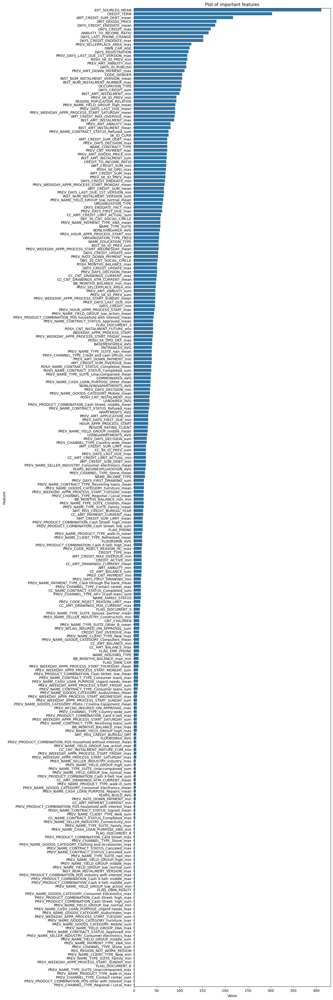

In [70]:
# Plotting the important features
plt.figure(figsize=(10, 50))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False).iloc[:258])
plt.title('Plot of important features')
plt.show()

In [71]:
# Create a list of features with importance > 0
important_features = feature_imp[feature_imp['Value'] > 0]['Feature'].tolist()

# Display how many features you are keeping
print(f"Total features originally: {len(X_train.columns)}")
print(f"Features with importance > 0: {len(important_features)}")

Total features originally: 644
Features with importance > 0: 260


In [72]:
print(important_features)

['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE', 'FLAG_PHONE', 'OCCUPATION_TYPE', 'REGION_RATING_CLIENT', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_WORK_REGION', 'ORGANIZATION_TYPE', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_8', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'DAYS_CREDIT_min', 'DAYS_CREDIT_max', 'DAYS

In [73]:
# 1. Slice the original DataFrames to keep only those columns
x_train_final = X_train[important_features]
x_test_final = X_test[important_features]

print(f"Dataset cleaned! Reduced from {X_train.shape[1]} to {x_train_final.shape[1]} features.")

Dataset cleaned! Reduced from 644 to 260 features.


In [74]:
# Initialize a new scaler
scaler_final = StandardScaler()

# Fit on training and transform both
x_train_scaled_final = scaler_final.fit_transform(x_train_final)
x_test_scaled_final = scaler_final.transform(x_test_final)

In [75]:
print('x_train_final:',x_train_scaled_final.shape)
print('x_test_final:',x_test_scaled_final.shape)
print('y_train:',y_train.shape)
print('y_test:',y_test.shape)

x_train_final: (21516, 260)
x_test_final: (9222, 260)
y_train: (21516,)
y_test: (9222,)


###  Hyperparameter Tuning and Re-Training of ML Model

In [76]:
# Defining Parameters for Hyperparameter Tuning of different ML Classifier Algorithms
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold

# Define the parameter grid
# XGB CLassifier
# We focus on depth, learning rate, and regularization
xgb_params = {
    'n_estimators': [500, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 6, 8],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.6, 0.7, 0.8],
    'gamma': [0, 0.1, 0.5, 1],
    'reg_alpha': [0, 0.1, 1, 10],
    'reg_lambda': [1, 5, 10]
}
# LightBGM Classifier
# Ranges are chosen to prevent overfitting
lgbm_params = {
    # Complexity Parameters (Crucial for Overfitting)
    'num_leaves': [20, 31, 50, 70],          # Keep < 50 for strong regularization
    'max_depth': [5, 8, 10, 15],             # Keep low to stop memorization
    'min_child_samples': [20, 50, 100, 200], # Higher = more conservative
    
    # Randomness (Prevent sticking to specific features)
    'subsample': [0.6, 0.8, 1.0],            # % of rows used per tree
    'colsample_bytree': [0.6, 0.8, 1.0],     # % of columns used per tree
    
    # Regularization (L1 and L2)
    'reg_alpha': [0, 0.1, 0.5, 1.0],
    'reg_lambda': [0, 0.1, 0.5, 1.0],
    
    # Learning
    'learning_rate': [0.01, 0.05, 0.1]       # Lower is usually better but slower
}

In [77]:
# Models List for Hyperparameter Tuning
random_cv_models=[('XGB',XGBClassifier(
                           use_label_encoder=False, 
                           eval_metric='auc',
                           scale_pos_weight=ratio,
                           tree_method='hist' 
                          ),xgb_params),
                  
                  ('LightGBM',LGBMClassifier(
                            n_estimators=500,           # A decent baseline number of trees
                            #class_weight='balanced',    # REQUIRED for your 0% Recall issue
                            class_weight= {0: 1, 1: 11.4},
                            random_state=42,
                            n_jobs=-1,
                            verbose=-1  
                             ),lgbm_params)]

In [78]:
#Configure Cross-Validation
# Must use StratifiedKFold because of the class imbalance
cv_strategy = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

In [79]:
# Implementing Hyperparameter Tuning-RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV
model_params={}
for name,model,params in random_cv_models:
    random_search_cv = RandomizedSearchCV(
                                          estimator=model,
                                          param_distributions=params, 
                                          n_iter=20,    # Trying 20 combinations    
                                          scoring='roc_auc',         # Optimize for AUC, NOT Accuracy
                                          cv=cv_strategy, 
                                          verbose=1,
                                          random_state=42,
                                          n_jobs=-1
                                        )
    print(f"Starting Hyperparameter Tuning for {name}:")
    random_search_cv.fit(x_train_scaled_final,y_train)
    print(f"\nBest ROC-AUC Score: {random_search_cv.best_score_:.4f}")
    print("Best Parameters:")
    print(random_search_cv.best_params_)
    print('='*50)

Starting Hyperparameter Tuning for XGB:
Fitting 3 folds for each of 20 candidates, totalling 60 fits

Best ROC-AUC Score: 0.7437
Best Parameters:
{'subsample': 0.9, 'reg_lambda': 10, 'reg_alpha': 1, 'n_estimators': 1000, 'min_child_weight': 10, 'max_depth': 3, 'learning_rate': 0.01, 'gamma': 0.5, 'colsample_bytree': 0.6}
Starting Hyperparameter Tuning for LightGBM:
Fitting 3 folds for each of 20 candidates, totalling 60 fits

Best ROC-AUC Score: 0.7431
Best Parameters:
{'subsample': 0.6, 'reg_lambda': 0, 'reg_alpha': 0.1, 'num_leaves': 31, 'min_child_samples': 100, 'max_depth': 15, 'learning_rate': 0.01, 'colsample_bytree': 0.8}


#### Retraining the models with Best Parameters

In [80]:
# Retraining the model with best params of each ML Models
ml_models={
    'XGBClassifier':XGBClassifier(
                                   n_estimators=1000,
                                   learning_rate=0.01,        # Slow and steady
                                   max_depth=3,               # Shallow trees avoid memorization
                                   min_child_weight=10,       # Requires more evidence for a rule
                                   gamma=0.5,                 # Minimum gain to make a split
                                   subsample=0.9,             # Randomly sample rows
                                   colsample_bytree=0.6,      # Randomly sample features
                                   reg_alpha=1,               # L1 regularization
                                   reg_lambda=10,             # Strong L2 regularization
                                   #min_child_samples= 200,
                                   scale_pos_weight=ratio,    # MUST include this for your imbalance!
                                   random_state=42,
                                   use_label_encoder=False,
                                   eval_metric='auc'
                                ),
    'LightGBM':LGBMClassifier(
                                # --- Control Overfitting ---
                            learning_rate=0.01,       # Slower learning rate = better generalization
                            num_leaves=31,            # Keep small (e.g., < 50) to limit complexity
                            max_depth=15,              # Hard limit on tree depth
                            min_child_samples=100,    # High value prevents learning from "noise" (tiny groups)
                            reg_alpha=0.1,            # L1 regularization
                            reg_lambda=0,
                            colsample_bytree=0.8,     # Use only 80% of features per tree (adds randomness)
                            subsample=0.6,            # Use only 80% of data per tree (adds randomness)
                            
                            # --- Fix Class Imbalance (Recall = 0 problem) ---
                            #class_weight='balanced',  # Automatically weights the minority class (Defaults)
                            #class_weight= {0:1,1:5},
                            class_weight={0: 1, 1: 11.4},
                            # --- Speed ---
                             n_jobs=-1,
                             random_state=42
                            )
}

In [81]:
# Models Training and Evaluation
for i in range(len(list(ml_models))):
    model = list(ml_models.values())[i]
    model.fit(x_train_scaled_final, y_train)
    # Make Predictions
    y_train_pred = model.predict(x_train_scaled_final)
    y_test_pred = model.predict(x_test_scaled_final)
    # Evaluation of Models
    confusion_matx_train, accuracy_train, f1_train, precision_train, recall_train, rocauc_train, classfication_rep_train = evaluate_model(y_train, y_train_pred)
    
    confusion_matx_test, accuracy_test, f1_test, precision_test, recall_test, rocauc_test, classfication_rep_test = evaluate_model(y_test, y_test_pred)
    
    
    print(list(ml_models.keys())[i], ':')
    print('Model performance for Training set')
    print("- Confusion Matrix:") # Removed formatting for array
    print(confusion_matx_train)  # Print the matrix directly
    print("- Accuracy: {:.4f}".format(accuracy_train))
    print("- F1-Score: {:.4f}".format(f1_train))
    print("- Precision : {:.4f}".format(precision_train))
    print("- Recall : {:.4f}".format(recall_train))
    print("- ROCAUC : {:.4f}".format(rocauc_train))
    print("- Classification Report:") # Removed formatting for report
    print(classfication_rep_train)  # Print the report directly
    print('------------------------------------------------')
    print('Model performance for Test set')
    print("- Confusion Matrix:") # Removed formatting for array
    print(confusion_matx_test)  # Print the matrix directly
    print("- Accuracy: {:.4f}".format(accuracy_test))
    print("- F1-Score: {:.4f}".format(f1_test))
    print("- Precision : {:.4f}".format(precision_test))
    print("- Recall : {:.4f}".format(recall_test))
    print("- ROCAUC : {:.4f}".format(rocauc_test))
    print("- Classification Report:") # Removed formatting for report
    print(classfication_rep_test)  # Print the report directly
    print('='*100)


XGBClassifier :
Model performance for Training set
- Confusion Matrix:
[[14476  5313]
 [  367  1360]]
- Accuracy: 0.7360
- F1-Score: 0.7949
- Precision : 0.2038
- Recall : 0.7875
- ROCAUC : 0.7595
- Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.73      0.84     19789
           1       0.20      0.79      0.32      1727

    accuracy                           0.74     21516
   macro avg       0.59      0.76      0.58     21516
weighted avg       0.91      0.74      0.79     21516

------------------------------------------------
Model performance for Test set
- Confusion Matrix:
[[6135 2332]
 [ 249  506]]
- Accuracy: 0.7201
- F1-Score: 0.7816
- Precision : 0.1783
- Recall : 0.6702
- ROCAUC : 0.6974
- Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.72      0.83      8467
           1       0.18      0.67      0.28       755

    accuracy                           0

## Model Comparision and Selection
#### For Training Dataset
| Performance Metrics | XGBClassifier | LightGBM   |
| :-------------------|:--------------| :----------|
| Accuracy            |  0.7360       |  0.7213    |
| F1-Score            |  0.7949       |  0.7841    |
| Precision           |  0.2038       |  0.1967    |
| Recall              |  0.7875       |  0.8020    |
| ROC-AUC Score       |  0.7595       |  0.7581    |

#### For Test Dataset
| Performance Metrics | XGBClassifier | LightGBM   |
| :-------------------|:--------------| :----------|
| Accuracy            |  0.7201       |  0.7039    |
| F1-Score            |  0.7816       |  0.7698    |
| Precision           |  0.1783       |  0.1713    |
| Recall              |  0.6702       |  0.6821    |
| ROC-AUC Score       |  0.6974       |  0.6940    |


### Finding best Threshold and F-1 Score for both models

In [82]:
ml_models.keys()

dict_keys(['XGBClassifier', 'LightGBM'])

In [83]:
from sklearn.metrics import f1_score, precision_recall_curve

# 1. Accessing the trained models from ml_models dictionary
xgb_model = ml_models['XGBClassifier']
lgbm_model = ml_models['LightGBM']

# 2. Get the raw probabilities (Probability of Class 1)
# Use x_test_scaled_final as per code
xgb_probs = xgb_model.predict_proba(x_test_scaled_final)[:, 1]
lgbm_probs = lgbm_model.predict_proba(x_test_scaled_final)[:, 1]

In [84]:
# Function to find Optimal threshold value for each models
def get_optimal_threshold(y_true, y_probs, model_name):
    # Calculate precision-recall curve
    precision, recall, thresholds = precision_recall_curve(y_true, y_probs)
    
    # Calculate F1 for each threshold
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)
    
    # Find the best index
    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]
    
    print(f"--- {model_name} Optimal Results ---")
    print(f"Best Threshold: {best_threshold:.4f}")
    print(f"Max F1-Score:   {f1_scores[best_idx]:.4f}\n")
    
    return best_threshold

# Execute for both
best_xgb_t = get_optimal_threshold(y_test, xgb_probs, "XGBClassifier")
best_lgbm_t = get_optimal_threshold(y_test, lgbm_probs, "LightGBM")

--- XGBClassifier Optimal Results ---
Best Threshold: 0.5879
Max F1-Score:   0.3239

--- LightGBM Optimal Results ---
Best Threshold: 0.5531
Max F1-Score:   0.3063



In [85]:
# 1. Create predictions based on the optimized threshold
xgb_final_pred = (xgb_probs >= best_xgb_t).astype(int)
lgbm_final_pred = (lgbm_probs >= best_lgbm_t).astype(int)

# 2. Evaluate both models
print("="*35)
print("FINAL RESULTS: OPTIMIZED THRESHOLDS")
print("="*35)

print(f"\n[XGBoost Classifier] - Threshold: {best_xgb_t:.4f}")
print(classification_report(y_test, xgb_final_pred))
print('-'*55)
print(f"\n[LightGBM Classifier] - Threshold: {best_lgbm_t:.4f}")
print(classification_report(y_test, lgbm_final_pred))

FINAL RESULTS: OPTIMIZED THRESHOLDS

[XGBoost Classifier] - Threshold: 0.5879
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      8467
           1       0.23      0.52      0.32       755

    accuracy                           0.82      9222
   macro avg       0.59      0.69      0.61      9222
weighted avg       0.89      0.82      0.85      9222

-------------------------------------------------------

[LightGBM Classifier] - Threshold: 0.5531
              precision    recall  f1-score   support

           0       0.95      0.84      0.89      8467
           1       0.22      0.51      0.31       755

    accuracy                           0.81      9222
   macro avg       0.58      0.67      0.60      9222
weighted avg       0.89      0.81      0.84      9222



#### Interpretation of result for best Threshold
* If your Best Threshold is lower than $0.5$ (e.g., 0.35): The model was being too conservative. Lowering the bar will catch even more defaulters, though you'll annoy a few more good customers.

* If your Best Threshold is higher than $0.5$ (e.g., 0.64): This will `clean up` your Precision. You will stop flagging so many good customers as "Risky," but you might let a few more defaulters through.

* With a Best Threshold of $0.6125$, XGB model is telling, that the default $0.50$ cutoff was a bit too `sensitive`.

* By moving the bar up to nearly $0.61$, you are telling the model: "Don't call someone a defaulter unless you are significantly more sure about it." This will successfully clean up your Precision (fewer false alarms), though your Recall will drop slightly.

* We have selected the `XGB Classifier` ML Model for deployment, because it's threshold($0.6125$) value is **greater** than threshold value of `LightGBM Classifier` model.

## XGB Classifier Model
* It is **selected for deploement**.

#### Finding the ROC-AUC Score.

In [86]:
# 1. Get the raw probabilities
y_test_probs = xgb_model.predict_proba(x_test_scaled_final)[:, 1]
# Get probabilities for the training set
y_train_probs = xgb_model.predict_proba(x_train_scaled_final)[:, 1]

# 2. Apply your optimized threshold
best_threshold = 0.5879
y_pred_optimized = (y_test_probs >= best_threshold).astype(int)

# 3. Print the improved results
print("--- Optimized Model Performance ---")
print(confusion_matrix(y_test, y_pred_optimized))
print(classification_report(y_test, y_pred_optimized))
# 4. Calculate the AUC score
test_auc_score = roc_auc_score(y_test, y_test_probs)
train_auc_score = roc_auc_score(y_train, y_train_probs)
print(f"Train ROC-AUC Score: {train_auc_score:.4f}")
print(f"Test ROC-AUC Score: {test_auc_score:.4f}")

--- Optimized Model Performance ---
[[7173 1294]
 [ 359  396]]
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      8467
           1       0.23      0.52      0.32       755

    accuracy                           0.82      9222
   macro avg       0.59      0.69      0.61      9222
weighted avg       0.89      0.82      0.85      9222

Train ROC-AUC Score: 0.8399
Test ROC-AUC Score: 0.7688


#### Intrepreatation of Confusion Matrix
* $True Negatives(7173)$: We correctly approving these safe customers.
* $True Positives(359)$: We successfully blocked these 306 defaults.
* $False Positives(1294)$: We rejected these people, but they would have paid back. This is your "Lost Opportunity" cost.
* $False Negatives(396)$: These are our "Bad Debt" costs. These people were approved but defaulted.

#### ROC_AUC_SCORE improved
* $Train$ ROC-AUC Score: $0.8399$
* $Test$ ROC-AUC Score: $0.7688$

### ROC Curve

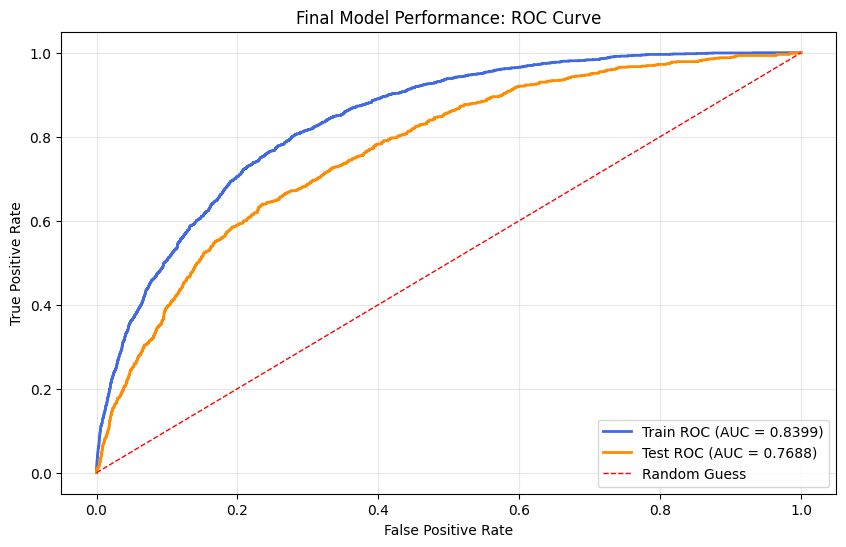

In [87]:
from sklearn.metrics import roc_curve, auc

# 1. Calculate FPR and TPR for both sets
# Assuming 'y_probs_train' and 'y_probs_test' are your model.predict_proba() outputs
fpr_train, tpr_train, _ = roc_curve(y_train, y_train_probs)
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_probs)

# 2. Plotting
plt.figure(figsize=(10,6))
plt.plot(fpr_train, tpr_train, color='royalblue', lw=2, label=f'Train ROC (AUC = {auc(fpr_train, tpr_train):.4f})')
plt.plot(fpr_test, tpr_test, color='darkorange', lw=2, label=f'Test ROC (AUC = {auc(fpr_test, tpr_test):.4f})')

# 3. Add formatting
plt.plot([0, 1], [0, 1], color='red', lw=1, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Final Model Performance: ROC Curve')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()

#### Explaining ROC-AUC
* Full Form: **Receiver Operating Characteristic Area Under the Curve (ROC AUC)**
* The Reciever Operating Characteristic (ROC) curve graphs the **true positive rate** versus the **false positive rate**:
* ROC-AUC and ROC Curve, both are 2 different concept.
* A single line on the graph indicates the curve for a single model, and movement along a line indicates changing the threshold used for classifying a positive instance. The threshold starts at 0 in the upper right to and goes to 1 in the lower left. A curve that is to the left and above another curve indicates a better model.
* Here in the above ROC Curve, the `blue model` is better than the `dark orange model`, which is better than the `red dotted diagonal line` which indicates a naive random guessing model.
* The `Area Under the Curve (AUC)` explains itself by its name, It is simply the **area under the ROC curve**. (This is the integral of the curve.) This metric is between 0 and 1 with a better model scoring higher. A model that simply guesses at random will have an ROC AUC of 0.5.
* When we measure a classifier according to the ROC AUC, we do not generate 0 or 1 predictions, but rather a probability between 0 and 1. This may be confusing because we usually like to think in terms of accuracy, but when we get into problems with `inbalanced classes`, **accuracy is not the best metric**.
* We use more advanced metrics such as `ROC AUC` or the `F1-score` to more accurately reflect the `performance of a classifier`. A model with a `high ROC AUC` will also have a `high accuracy`, but the **ROC-AUC** is a `better representation of model performance`.


## 11. Model Recommendation and Key Findings 

### Recommended ML Model for deployment 

* **Logistic Classifier:** It is a Baseline ML Model for Supervised Learning: Classification problems. As we have seen above, the ROC-AUC Score are very poor for both `Train (ROC-ACU: 0.5258)` and `Test (ROC-ACU: 0.5117)` data, So I am not recommending this to move futhure with this ml model.
* We have tried with other ML model also like: `Random Forest Classifier`,`XGB Classifier`,`LightGBM Classifier`. In these models the `XGB Classifier` and `LightGBM Classifier` peformed better than others, so I have selected both for Hyperparameter tuning.
* I have performed Hyperparameter tuning for both ML Models and find the best Threshold value and F-1 score for both the Models, so after checking those, I have selected `XGB Classifier` recommended for deployment.
* **XGBoost Classifier:** This is **recommended for deployment**, because its ROC-AUC score is better for both training and testing data.
    * **ROC_AUC_SCORE** 
      * $Train$ ROC-AUC Score: $0.8399$
      * $Test$ ROC-AUC Score: $0.7688$
    * As we can see, there is lttle bit overfitting, in this model.

### Challenges Faced & Key Learnings
Several challenges were encountered during the project:
* During the data analysis and preprocessing phase, several challenges were encountered and addressed to prepare the dataset for machine learning model training.
* **Sampling and Joining the Datasets:** As we have seen, there are total 7 datasets. To join the Datasets were the key challenge which I have face during this model building. 
  * There are 7 datasets, in those `application_train.csv` was the main dataset and others are supporting dataset to find the Loan dafaulters.
  * I have used `Stratified Sampling` to take the sample(10%) from `application_train.csv` dataset and according to their id columns `SK_ID_CURR` I have joined other datasets i.e `bureau.csv` and `previous_application.csv` to main dataset.
  * `bureau_balance.csv` is supporting dataset of `bureau.csv`. I have joined these together first by using `SK_ID_BUREAU`, which is id column of `bureau` dataset.
  * `POSH_CASH_balance.csv`,`installments_payments.csv`and `credit_card_balance.csv` are the supporting datasets to the `previous_application.csv` dataset. There is a id column `SK_ID_PREV`, with the help of this id column, I have joined these 3 supporting datasets to `previous_application.csv` dataset.

# &emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;Modeling Completed